# Region3 - All 479 - primary incldue
## Xiaonan Wang
## 31Aug2026

## Step0 - Setup and paths

In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(SeuratObject)
  library(dplyr)
  library(tidyr)
  library(tibble)
  library(Matrix)
  library(ggplot2)
})

set.seed(1234)

In [2]:
REGION_ID = "Region_1"

In [3]:
PROJECT_ROOT <- "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium"
PIPELINE_REPO <- file.path(PROJECT_ROOT, "adipose_analysis_B2", "YNH_Xenium_scWAT")
RUN_LABEL <- "full_notebook_qc_v2"
QC_RUN_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis_B2",
  "scwat_qc_outputs",
  "scwat_qc_hpc/sections",
  REGION_ID
)
DOWNSTREAM_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis_B2",
  "scwat_downstream_outputs",
  RUN_LABEL
)
ANCHOR_ROOT <- file.path(
  DOWNSTREAM_ROOT,
  paste0("03_", REGION_ID, "_Primary479")
)
INPUT_ROOT <- file.path(PROJECT_ROOT, "adipose_data_B2")

In [4]:
source(file.path(PIPELINE_REPO, "R", "source.R"))

In [5]:
assert_path_within(PROJECT_ROOT, QC_RUN_ROOT)
assert_path_within(PROJECT_ROOT, DOWNSTREAM_ROOT)
dir.create(DOWNSTREAM_ROOT, recursive = TRUE, showWarnings = FALSE)
assert_path_within(PROJECT_ROOT, ANCHOR_ROOT)
dir.create(ANCHOR_ROOT, recursive = TRUE, showWarnings = FALSE)

In [6]:
theme_cell <- function(base_size = 12) {
  theme_classic(base_size = base_size) +
    theme(
      panel.border = element_rect(
        colour = "black",
        fill = NA,
        linewidth = 0.8
      ),
      axis.line = element_line(colour = "black", linewidth = 0.6),
      axis.text = element_text(colour = "black"),
      axis.title = element_text(colour = "black"),
      strip.background = element_rect(
        fill = "white",
        colour = "black",
        linewidth = 0.8
      ),
      strip.text = element_text(face = "bold"),
      legend.title = element_text(face = "bold"),
      plot.title = element_text(face = "bold"),
      plot.subtitle = element_text(colour = "black")
    )
}

## Step1 - Create Seurat Obj

In [7]:
region_info <- discover_one_section(
  input_root = INPUT_ROOT,
  region_id = REGION_ID
)
REGION_XENIUM_DIR <- region_info$region_dir

In [8]:
list.files(
  REGION_XENIUM_DIR,
  recursive = FALSE
)

[1] "analysis"                     "analysis_summary.html"       
 [3] "analysis.zarr.zip"            "aux_outputs"                 
 [5] "cell_boundaries.csv.gz"       "cell_boundaries.parquet"     
 [7] "cell_feature_matrix"          "cell_feature_matrix.h5"      
 [9] "cell_feature_matrix.zarr.zip" "cells.csv.gz"                
[11] "cells.parquet"                "cells.zarr.zip"              
[13] "experiment.xenium"            "gene_panel.json"             
[15] "metrics_summary.csv"          "morphology_focus"            
[17] "morphology.ome.tif"           "nucleus_boundaries.csv.gz"   
[19] "nucleus_boundaries.parquet"   "transcripts.parquet"         
[21] "transcripts.zarr.zip"

In [9]:
region_spatial <- create_spatial_seurat_from_xenium(
  xenium_dir = REGION_XENIUM_DIR,
  project = REGION_ID,
  assay = "Xenium",
  fov = "fov",
  include_cell_segmentation = TRUE,
  include_nucleus_segmentation = TRUE
)

Reading Xenium output directly from:

  /dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/adipose_data_B2/output-XETG00205__0104985__Region_1__20260814__101700

Reading cell_feature_matrix.h5 ...

Genome matrix has multiple modalities, returning a list of matrices for this genome

Read10X returned feature types: Gene Expression, Negative Control Probe, Negative Control Codeword, Unassigned Codeword

Native matrix: 479 features × 92,044 cells

Reading cells.parquet ...

Matrix/metadata overlapping cells: 92,044

Warning message:
“Setting row names on a tibble is deprecated.”
Warning message:
“No cell overlap between new meta data and Seurat object”
Creating cell segmentation: 2,298,629 vertices

Creating nucleus segmentation: 2,280,703 vertices



Created native Xenium spatial Seurat object: Region_1

  Cells: 92,044

  Genes: 479

  FOV: fov

  Boundaries: centroids, segmentation, nucleus_segmentation



In [10]:
region_spatial

An object of class Seurat 
479 features across 92044 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: fov

In [11]:
head(region_spatial@meta.data)

,orig.ident,nCount_Xenium,nFeature_Xenium
,<fct>,<dbl>,<int>
aaaabndg-1,Region_1,275,84
aaaakjna-1,Region_1,133,68
aaaalfka-1,Region_1,30,22
aaaalpoa-1,Region_1,398,138
aaacfdfp-1,Region_1,182,63
aaacobha-1,Region_1,197,79


In [12]:
dim(region_spatial@meta.data)

[1] 92044     3

In [13]:
mask_file <- file.path(
  QC_RUN_ROOT,
  "cell_qc_metadata.tsv.gz"
)

stopifnot(file.exists(mask_file))

masks <- read.delim(
  mask_file,
  stringsAsFactors = FALSE,
  check.names = FALSE
)

dim(masks)

[1] 92044    35

In [19]:
identical(masks$cell_id, colnames(region_spatial))

[1] TRUE

In [26]:
region_spatial <- add_masks_to_seurat(
  object = region_spatial,
  masks = masks,
  overwrite = FALSE
)

Seurat cells: 92,044

Matched to masks: 92,044

Unmatched Seurat cells: 0

Skipping existing metadata columns: nCount_Xenium, nFeature_Xenium

Added 32 metadata columns.

Metadata dimensions: 92044 × 35



In [29]:
head(region_spatial@meta.data, n=2)

,orig.ident,nCount_Xenium,nFeature_Xenium,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,⋯,primary_include,strict_include,hotspot_review_cell,hotspot_sensitivity_include,section_status,mask_rule_primary,mask_rule_strict,mask_rule_hotspot_sensitivity,provenance,initial_qc_status
,<fct>,<dbl>,<int>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
aaaabndg-1,Region_1,275,84,749.7783,3049.482,275,0,0,0,0,⋯,TRUE,TRUE,FALSE,TRUE,PRIMARY_CONDITIONAL,nFeature_Xenium > 5 AND nFeature_Xenium < 200 AND nCount_Xenium > 10 AND nCount_Xenium < 1000,primary_include AND NOT qc_review_flag,primary_include AND NOT Region_3 morphology-review hotspot cell,scwat_qc_hpc::FULL_HPC,QC_EVIDENCE_PENDING
aaaakjna-1,Region_1,133,68,721.0421,3081.250,133,0,0,0,0,⋯,TRUE,TRUE,FALSE,TRUE,PRIMARY_CONDITIONAL,nFeature_Xenium > 5 AND nFeature_Xenium < 200 AND nCount_Xenium > 10 AND nCount_Xenium < 1000,primary_include AND NOT qc_review_flag,primary_include AND NOT Region_3 morphology-review hotspot cell,scwat_qc_hpc::FULL_HPC,QC_EVIDENCE_PENDING


In [30]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                    "nCount_Xenium"                
 [3] "nFeature_Xenium"               "x_centroid"                   
 [5] "y_centroid"                    "transcript_counts"            
 [7] "control_probe_counts"          "genomic_control_counts"       
 [9] "control_codeword_counts"       "unassigned_codeword_counts"   
[11] "deprecated_codeword_counts"    "total_counts"                 
[13] "cell_area"                     "nucleus_area"                 
[15] "nucleus_count"                 "segmentation_method"          
[17] "region_id"                     "control_fraction_cell"        
[19] "nucleus_missing_flag"          "multiple_nuclei_flag"         
[21] "cell_area_outlier_flag"        "high_control_flag"            
[23] "segmentation_multiplet_flag"   "qc_core_pass"                 
[25] "qc_review_flag"                "primary_include"              
[27] "strict_include"                "hotspot_review_cell"          
[29] "hotspot_sensitivity_include"   "section_status"               
[31] "mask_rule_primary"             "mask_rule_strict"             
[33] "mask_rule_hotspot_sensitivity" "provenance"                   
[35] "initial_qc_status"

In [31]:
table(region_spatial$primary_include, region_spatial$qc_core_pass)

       
        FALSE  TRUE
  FALSE   826     0
  TRUE      0 91218

In [32]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_all.rds")))

## Step2 - Define gene set info

In [33]:
# EOS features
EOS_GENE_SET_PATH <- file.path(
  PIPELINE_REPO,
  "config",
  "eos_gene_sets.tsv"
)

eos_gene_sets <- read.delim(
  EOS_GENE_SET_PATH,
  stringsAsFactors = FALSE
)

In [34]:
# Identity-transfer panel:
# complete 479-gene panel minus short-/long-lived Eos state genes.
# This retains the original 379 mMulti genes plus the 7 common Eos identity genes.

eos_state_genes <- unique(
  eos_gene_sets$gene[
    eos_gene_sets$gene_set %in% c("short_lived", "long_lived")
  ]
)

raw_panel_genes <- rownames(region_spatial)

identity_panel_genes <- setdiff(
  raw_panel_genes,
  eos_state_genes
)

cat("Raw panel genes:", length(raw_panel_genes), "\n")
cat("Eos state genes excluded:", length(intersect(raw_panel_genes, eos_state_genes)), "\n")
cat("Identity panel genes:", length(identity_panel_genes), "\n")

stopifnot(length(raw_panel_genes) == 479L)


Raw panel genes: 479 
Eos state genes excluded: 93 
Identity panel genes: 386 


In [35]:
FIX_GENESET = raw_panel_genes

## Step3 - Subset cells

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_all.rds")))

In [36]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                    "nCount_Xenium"                
 [3] "nFeature_Xenium"               "x_centroid"                   
 [5] "y_centroid"                    "transcript_counts"            
 [7] "control_probe_counts"          "genomic_control_counts"       
 [9] "control_codeword_counts"       "unassigned_codeword_counts"   
[11] "deprecated_codeword_counts"    "total_counts"                 
[13] "cell_area"                     "nucleus_area"                 
[15] "nucleus_count"                 "segmentation_method"          
[17] "region_id"                     "control_fraction_cell"        
[19] "nucleus_missing_flag"          "multiple_nuclei_flag"         
[21] "cell_area_outlier_flag"        "high_control_flag"            
[23] "segmentation_multiplet_flag"   "qc_core_pass"                 
[25] "qc_review_flag"                "primary_include"              
[27] "strict_include"                "hotspot_review_cell"          
[29] "hotspot_sensitivity_include"   "section_status"               
[31] "mask_rule_primary"             "mask_rule_strict"             
[33] "mask_rule_hotspot_sensitivity" "provenance"                   
[35] "initial_qc_status"

In [37]:
options(repr.plot.width=8, repr.plot.height=8)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


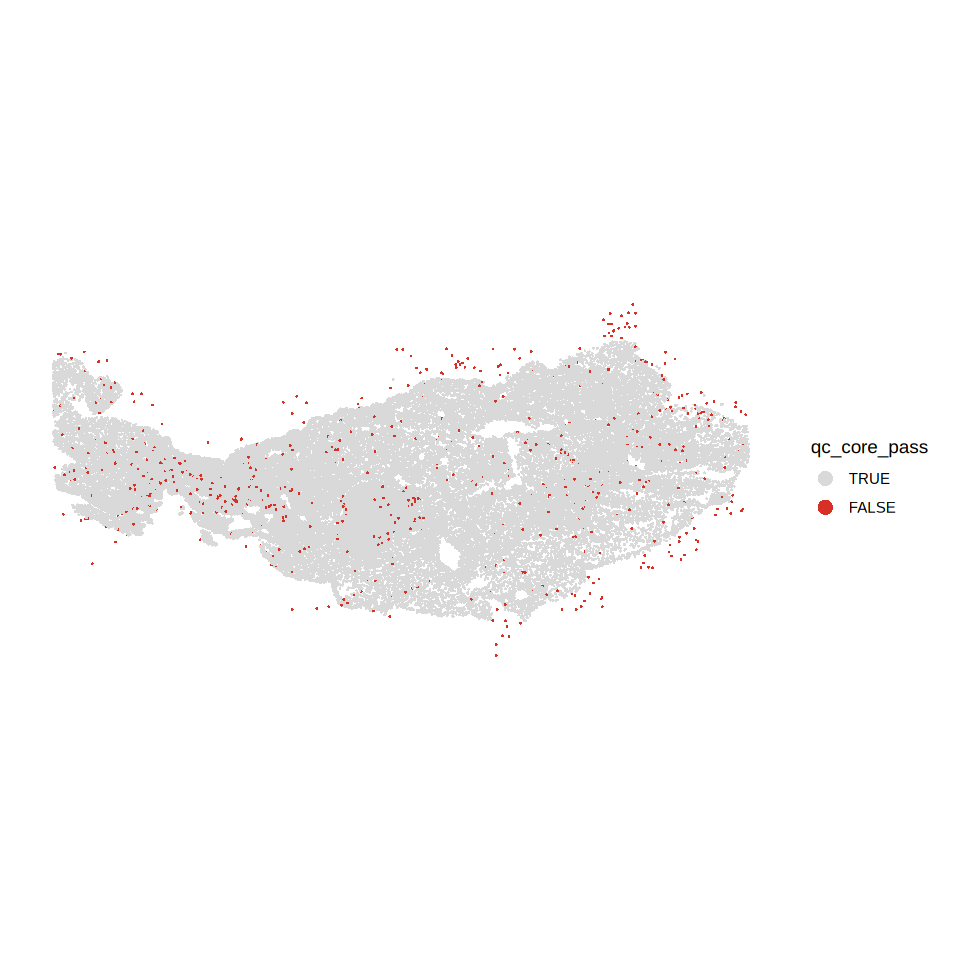

In [38]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  group.by = c('qc_core_pass'),
  flip_xy = FALSE,
  dark.background = FALSE,
  cols = c(
    "FALSE" = "#D73027", 
    "TRUE"  = "#D9D9D9"  
  )
)

In [39]:
flag_cols <- c(
  "high_control_flag",
  "segmentation_multiplet_flag",
  "nucleus_missing_flag",
  "multiple_nuclei_flag",
  "cell_area_outlier_flag"
)

sapply(
  masks[, flag_cols, drop = FALSE],
  function(x) {
    c(
      n = sum(x %in% TRUE, na.rm = TRUE),
      pct = 100 * mean(x %in% TRUE, na.rm = TRUE)
    )
  }
)

,high_control_flag,segmentation_multiplet_flag,nucleus_missing_flag,multiple_nuclei_flag,cell_area_outlier_flag
n,0,1605.000000,1177.000000,1506.000000,1066.000000
pct,0,1.743731,1.278736,1.636174,1.158142


In [40]:
table(!region_spatial$qc_core_pass, region_spatial$segmentation_multiplet_flag)

       
        FALSE  TRUE
  FALSE 89664  1554
  TRUE    775    51

In [41]:
region_spatial$primary_include_revised <-
  (masks$qc_core_pass %in% TRUE) &
  !(masks$high_control_flag %in% TRUE) &
  !(masks$segmentation_multiplet_flag %in% TRUE)

In [42]:
table(region_spatial$primary_include_revised)


FALSE  TRUE 
 2380 89664 

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


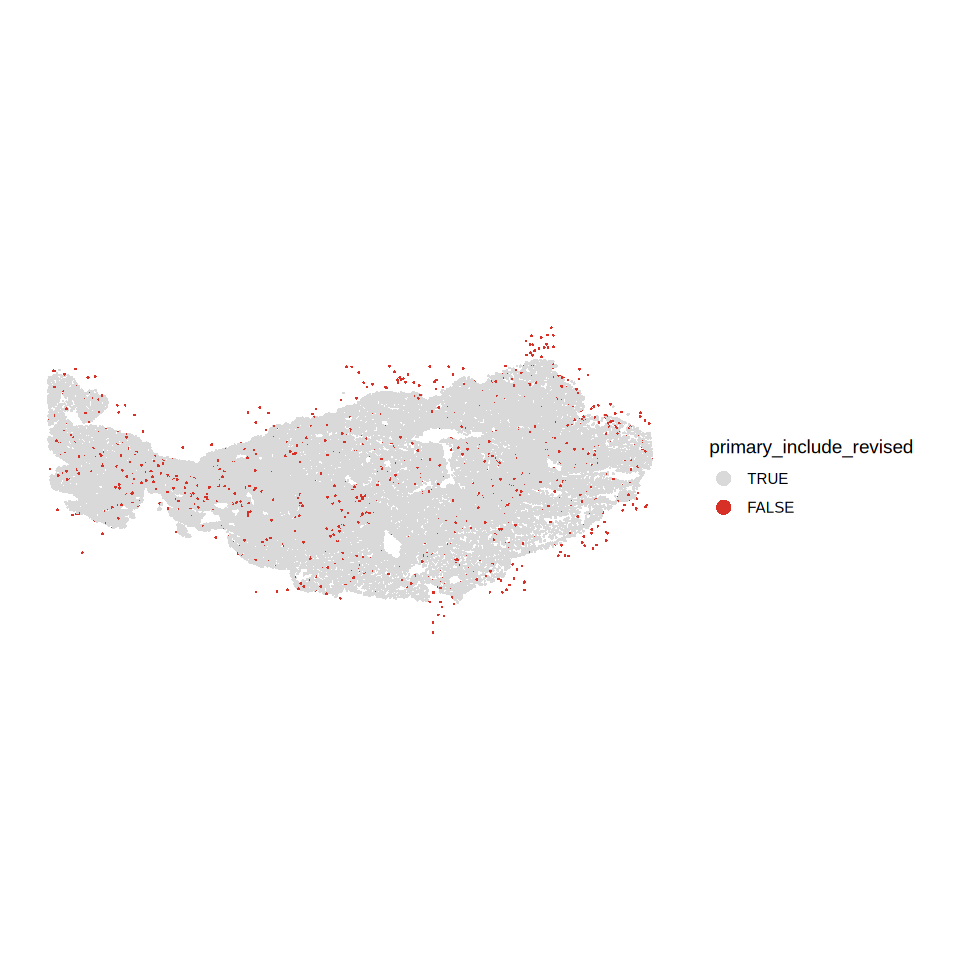

In [43]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  group.by = c('primary_include_revised'),
  flip_xy = FALSE,
  dark.background = FALSE,
  cols = c(
    "FALSE" = "#D73027", 
    "TRUE"  = "#D9D9D9"  
  )
)

In [44]:
region_spatial <- subset(
  region_spatial,
  subset = primary_include_revised == TRUE
)

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [45]:
region_spatial

An object of class Seurat 
479 features across 89664 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: fov

In [46]:
dim(region_spatial@meta.data)

[1] 89664    36

In [47]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [48]:
# Normalisation - better use lognormlize rather than SCTransform
DefaultAssay(region_spatial) <- "Xenium"

region_spatial <- NormalizeData(
  region_spatial,
  assay = "Xenium",
  normalization.method = "LogNormalize",
  scale.factor = 10000,
  verbose = FALSE
)

In [49]:
region_spatial

An object of class Seurat 
479 features across 89664 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 2 layers present: counts, data
 1 spatial field of view present: fov

In [50]:
# only use the cell type genes for PCA as key features
region_spatial <- ScaleData(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  verbose = FALSE
)

region_spatial <- RunPCA(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  npcs = 30,
  seed.use = 1234,
  verbose = FALSE
)

In [51]:
region_spatial

An object of class Seurat 
479 features across 89664 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 1 dimensional reduction calculated: pca
 1 spatial field of view present: fov

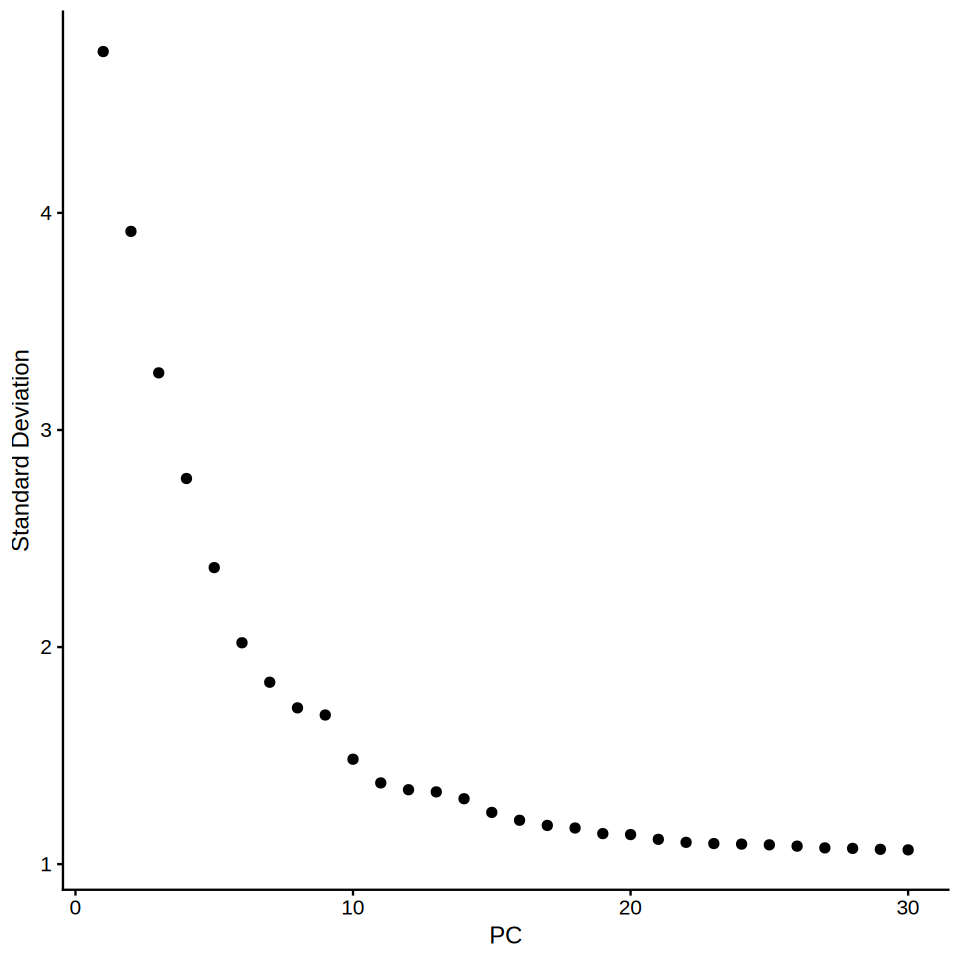

In [52]:
ElbowPlot(
  region_spatial,
  ndims = 30
)

In [53]:
options(repr.plot.width=12, repr.plot.height=12)

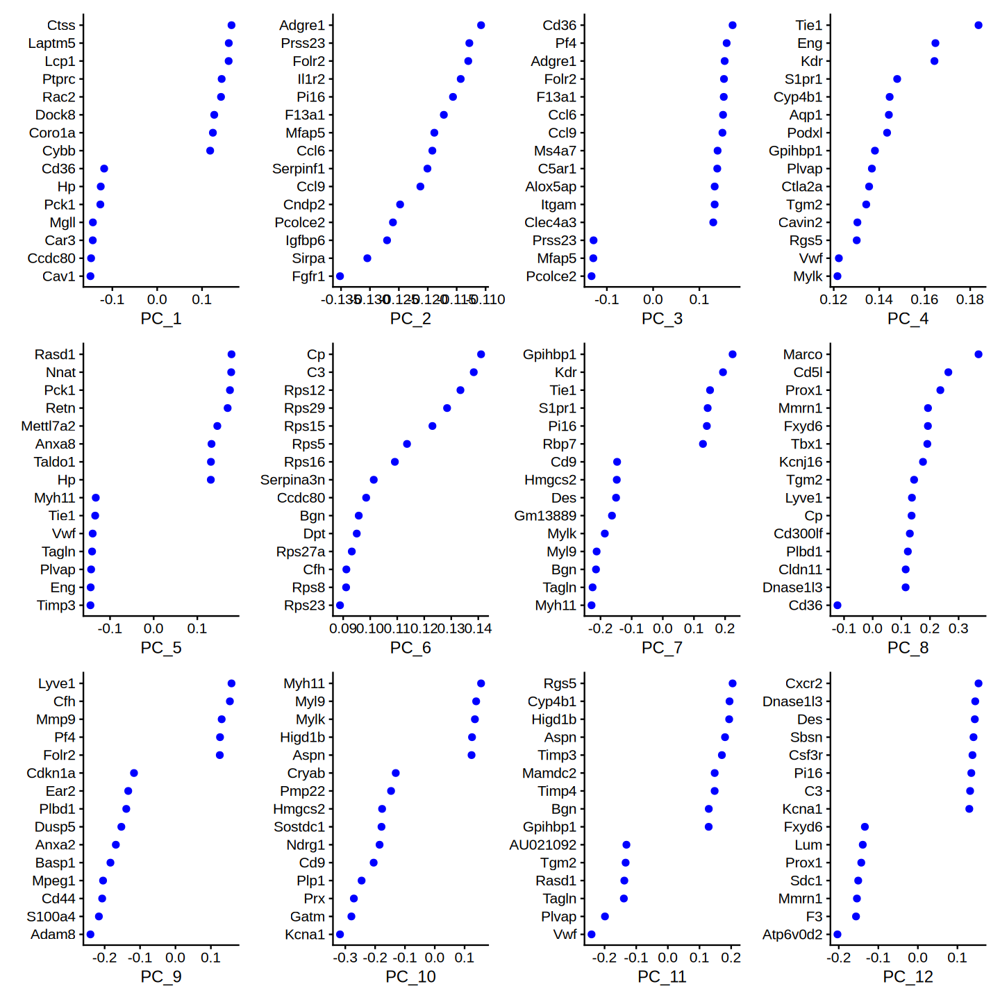

In [54]:
VizDimLoadings(
  region_spatial,
  dims = 1:12,
  reduction = "pca",
  nfeatures = 15
)

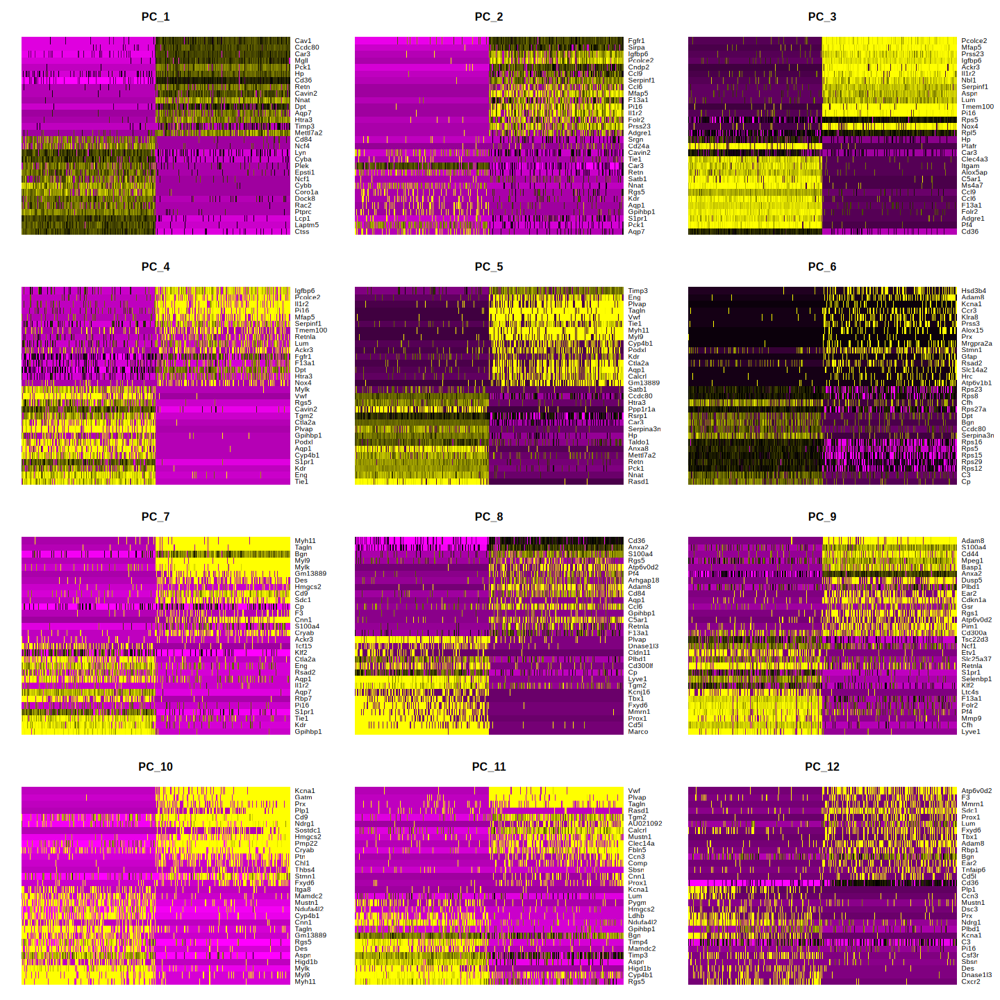

In [59]:
DimHeatmap(
  region_spatial,
  dims = 1:12,
  cells = 1000,
  balanced = TRUE
)

In [55]:
pcs <- Embeddings(
  region_spatial,
  reduction = "pca"
)

qc_vars <- c(
  "nCount_Xenium",
  "nFeature_Xenium",
  "cell_area"
)

qc_vars <- qc_vars[
  qc_vars %in% colnames(region_spatial@meta.data)
]

In [56]:
pc_qc_cor <- sapply(
  qc_vars,
  function(v) {
    apply(
      pcs,
      2,
      function(pc) {
        cor(
          pc,
          region_spatial@meta.data[[v]],
          method = "spearman",
          use = "pairwise.complete.obs"
        )
      }
    )
  }
)

round(pc_qc_cor, 3)

,nCount_Xenium,nFeature_Xenium,cell_area
PC_1,0.000,-0.064,-0.457
PC_2,-0.713,-0.869,-0.422
PC_3,-0.029,0.012,0.237
PC_4,0.363,0.407,0.124
PC_5,0.347,0.187,0.204
PC_6,0.298,0.155,0.273
PC_7,-0.011,0.006,-0.037
PC_8,-0.069,-0.055,0.003
PC_9,-0.007,-0.002,-0.092
PC_10,-0.072,-0.039,0.014


In [57]:
dims_use <- 1:30

PC1–PC12 are carrying structured, coherent biological programs rather than diffuse noise!

In [62]:
region_spatial <- FindNeighbors(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  k.param = 20,
  graph.name = c(
    "Xenium_nn_PC30",
    "Xenium_snn_PC30"
  ),
  verbose = FALSE
)

In [63]:
region_spatial <- RunUMAP(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  reduction.name = "umap_PC30",
  seed.use = 1234,
  verbose = FALSE
)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [64]:
resolutions <- c(
  0.7,
  0.8,
  1.0,
  1.2
)

for (res in resolutions) {
  print(res)
  region_spatial <- FindClusters(
    region_spatial,
    graph.name = "Xenium_snn_PC30",
    algorithm = 4,
    resolution = res,
    cluster.name = paste0(
      "cluster_res_",
      gsub("\\.", "_", res)
    ),
    random.seed = 1234,
    verbose = FALSE
  )
}

[1] 0.7
[1] 0.8
[1] 1
[1] 1.2


In [65]:
options(repr.plot.width=12, repr.plot.height=8)

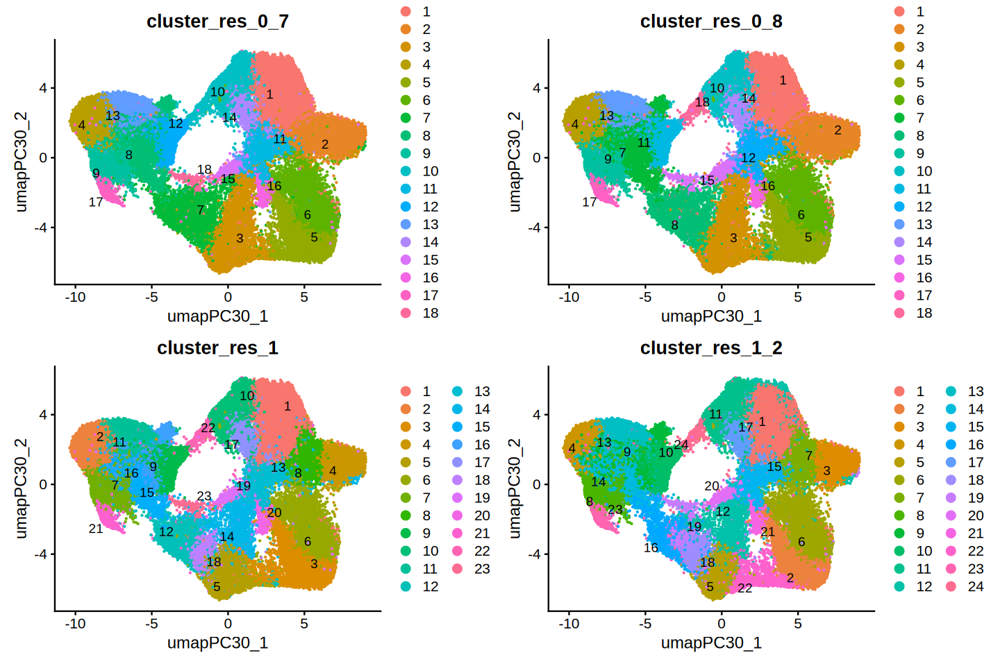

In [66]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = c(
    "cluster_res_0_7",
    "cluster_res_0_8",
    "cluster_res_1",
    "cluster_res_1_2"
  ),
  label = TRUE,
  repel = TRUE,
  ncol = 2
)

In [68]:
region_spatial

An object of class Seurat 
479 features across 89664 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap_PC30
 1 spatial field of view present: fov

In [67]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

## Step4 - Cell Type Annotataion M1 - By clustering scores

Try resolution 0.8

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [69]:
marker_df <- tibble::tribble(
  ~Gene_Symbol, ~CellType_main, ~CellType_subtype,

  "Gpihbp1", "Endothelial", "Capillary_EC",
  "Kdr",     "Endothelial", "Capillary_EC",

  "Vwf",     "Endothelial", "Venous_EC",
  "Plvap",   "Endothelial", "Venous_EC",

  "Mmrn1",   "Endothelial", "Lymphatic_EC",
  "Prox1",   "Endothelial", "Lymphatic_EC",
  "Lyve1",   "Endothelial", "Lymphatic_EC",

  "Pck1",    "Adipocyte", "Adipocyte",
  "Retn",    "Adipocyte", "Adipocyte",
  "Aqp7",    "Adipocyte", "Adipocyte",
  "Ppargc1a","Adipocyte", "Adipocyte",
  "Car3",    "Adipocyte", "Adipocyte",
  "Cd36",    "Adipocyte", "Adipocyte",

  "Pi16",    "Stromal_Fibroblast", "ASC",
  "Pcolce2", "Stromal_Fibroblast", "ASC",
  "Mfap5",   "Stromal_Fibroblast", "ASC",

  "Lum",     "Stromal_Fibroblast", "Fibroblast",
  "Serpinf1","Stromal_Fibroblast", "Fibroblast",
  "Bgn",     "Stromal_Fibroblast", "Fibroblast",
  "Dpt",     "Stromal_Fibroblast", "Fibroblast",
  "Aspn",    "Stromal_Fibroblast", "Fibroblast",
  "Ccdc80",  "Stromal_Fibroblast", "Fibroblast",

  "Tagln",   "Mural", "VSMC",
  "Myh11",   "Mural", "VSMC",
  "Cnn1",    "Mural", "VSMC",
  "Itga8",   "Mural", "VSMC",
  "Myl9",    "Mural", "VSMC",
  "Mylk",    "Mural", "VSMC",

  "Rgs5",    "Mural", "Pericyte",
  "Higd1b",  "Mural", "Pericyte",
  "Ndufa4l2","Mural", "Pericyte",
  "Myl9",    "Mural", "Pericyte",
  "Des",     "Mural", "Pericyte",
  "Timp3",   "Mural", "Pericyte",

  "Plp1",    "Neural", "Schwann",
  "Prx",     "Neural", "Schwann",
  "Pmp22",   "Neural", "Schwann",
  "Kcna1",   "Neural", "Schwann",
  "Chl1",    "Neural", "Schwann",

  "Pf4",     "Macrophage", "LYVE_macrophage",
  "Folr2",   "Macrophage", "LYVE_macrophage",
  "F13a1",   "Macrophage", "LYVE_macrophage",
  "C5ar1",   "Macrophage", "LYVE_macrophage",
  "Adgre1",  "Macrophage", "LYVE_macrophage",
  "Retnla",  "Macrophage", "LYVE_macrophage",
  "Lyve1",   "Macrophage", "LYVE_macrophage",
  "Ms4a7",   "Macrophage", "LYVE_macrophage",
  "Ccl6",    "Macrophage", "LYVE_macrophage",

  "Marco",   "Macrophage", "Scavenging_macrophage",
  "Mpeg1",   "Macrophage", "Scavenging_macrophage",
  "Cd5l",    "Macrophage", "Scavenging_macrophage",
  "Ms4a6c",  "Macrophage", "Scavenging_macrophage",
  "Lst1",    "Macrophage", "Scavenging_macrophage",

  "Cebpb",   "Monocyte", "Monocyte",
  "Ctss",    "Monocyte", "Monocyte",
  "Cd300a",  "Monocyte", "Monocyte",
  "Cybb",    "Monocyte", "Monocyte",

  "Csf3r",   "Neutrophil", "Neutrophil",
  "Cxcr2",   "Neutrophil", "Neutrophil",
  "Mmp9",    "Neutrophil", "Neutrophil",
  "Ctsg",    "Neutrophil", "Neutrophil",

  "Mrgpra2a",    "Mast cell", "MC",
  "Il1rl1",  "Mast cell", "MC",
  "Stfa2l1",  "Mast cell", "MC",
  "Cstdc4",  "Mast cell", "MC",
  "Asprv1",  "Mast cell", "MC",

  "Alox15",  "Eosinophil", "Eosinophil",
  "Siglecf", "Eosinophil", "Eosinophil",
  "Ccr3",    "Eosinophil", "Eosinophil",
  "Il5ra",   "Eosinophil", "Eosinophil",
  "Prg2",    "Eosinophil", "Eosinophil",
  "Ear1",    "Eosinophil", "Eosinophil",
  "Ear2",    "Eosinophil", "Eosinophil",

  "Cd3d",    "T cell", "T cell",
  "Cd8a",    "T cell", "T cell",
  "Ctla4",   "T cell", "T cell",
  "Epsti1",  "T cell", "T cell",

  "Itgal",   "NK", "NK",
  "Klra8",   "NK", "NK",

  "Basp1",   "DC", "DC",
  "Cytip",   "DC", "DC",
  "Adam8",   "DC", "DC",
  "Rab8b",   "DC", "DC",
  "Runx2",   "DC", "DC",

  "Plbd1",   "DC", "cDC",
  "Cd24a",   "DC", "cDC",
  "Psmb8",   "DC", "cDC",

    # leave B out as they are not good canonical markers 
  # "Slc25a37", "B cell", "B cell",
  # "Slc4a1", "B cell", "B cell",
  # "Cpa3", "B cell", "B cell",
 
  "Krt19",   "Mesothelial", "Mesothelial",
  "Cav1",    "Mesothelial", "Mesothelial",
  "Igfbp6",  "Mesothelial", "Mesothelial"
)
    
marker_df_use <- marker_df %>%
  filter(Gene_Symbol %in% rownames(region_spatial)) %>%
  distinct(Gene_Symbol, CellType_main, CellType_subtype)

In [70]:
table(marker_df_use$CellType_main)


         Adipocyte                 DC        Endothelial         Eosinophil 
                 6                  8                  7                  7 
        Macrophage          Mast cell        Mesothelial           Monocyte 
                14                  5                  3                  4 
             Mural             Neural         Neutrophil                 NK 
                12                  5                  4                  2 
Stromal_Fibroblast             T cell 
                 9                  4 

In [71]:
marker_coverage <- marker_df %>%
  mutate(Present = Gene_Symbol %in% rownames(region_spatial)) %>%
  group_by(CellType_main, CellType_subtype) %>%
  summarise(
    n_markers = n(),
    n_present = sum(Present),
    coverage = n_present / n_markers,
    genes_present = paste(Gene_Symbol[Present], collapse = ", "),
    .groups = "drop"
  ) %>%
  arrange(CellType_main, CellType_subtype)

marker_coverage

CellType_main,CellType_subtype,n_markers,n_present,coverage,genes_present
<chr>,<chr>,<int>,<int>,<dbl>,<chr>
Adipocyte,Adipocyte,6,6,1,"Pck1, Retn, Aqp7, Ppargc1a, Car3, Cd36"
DC,DC,5,5,1,"Basp1, Cytip, Adam8, Rab8b, Runx2"
DC,cDC,3,3,1,"Plbd1, Cd24a, Psmb8"
Endothelial,Capillary_EC,2,2,1,"Gpihbp1, Kdr"
Endothelial,Lymphatic_EC,3,3,1,"Mmrn1, Prox1, Lyve1"
Endothelial,Venous_EC,2,2,1,"Vwf, Plvap"
Eosinophil,Eosinophil,7,7,1,"Alox15, Siglecf, Ccr3, Il5ra, Prg2, Ear1, Ear2"
Macrophage,LYVE_macrophage,9,9,1,"Pf4, Folr2, F13a1, C5ar1, Adgre1, Retnla, Lyve1, Ms4a7, Ccl6"
Macrophage,Scavenging_macrophage,5,5,1,"Marco, Mpeg1, Cd5l, Ms4a6c, Lst1"


In [72]:
main_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_main",
  cluster_col = "cluster_res_0_8",
  assay = "Xenium",
  layer = "data",
  score_prefix = "MainScore",
  detect_prefix = "MainDetect",
  label_prefix = "Main"
)

region_spatial <- main_result$object

subtype_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_subtype",
  cluster_col = "cluster_res_0_8",
  assay = "Xenium",
  layer = "data",
  score_prefix = "SubtypeScore",
  detect_prefix = "SubtypeDetect",
  label_prefix = "Subtype"
)

region_spatial <- subtype_result$object

main_result$annotation
subtype_result$annotation

cluster_res_0_8,Main_label,Main_score,Main_second,Main_second_score,Main_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,Adipocyte,0.79634755,Endothelial,0.47176437,0.32458318
2,Adipocyte,1.07914455,Mesothelial,0.22372456,0.85541999
3,Macrophage,1.20465126,Monocyte,0.63364838,0.57100288
4,NK,0.32859299,Monocyte,0.21885666,0.10973634
5,Stromal_Fibroblast,1.44147652,Mesothelial,0.53394385,0.90753268
6,Stromal_Fibroblast,1.14352268,Mesothelial,0.71041627,0.43310640
7,Monocyte,0.33710231,DC,0.22498404,0.11211827
8,Monocyte,0.99693788,Macrophage,0.68908272,0.30785516
9,T.cell,0.95208071,NK,0.53562369,0.41645702


cluster_res_0_8,Subtype_label,Subtype_score,Subtype_second,Subtype_second_score,Subtype_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,Capillary_EC,1.66925279,Adipocyte,0.79634755,0.87290524
2,Adipocyte,1.07914455,Mesothelial,0.22372456,0.85541999
3,LYVE_macrophage,1.67085944,Monocyte,0.63364838,1.03721106
4,cDC,0.51153164,NK,0.32859299,0.18293865
5,ASC,2.16755338,Fibroblast,1.07843810,1.08911529
6,Fibroblast,1.36018928,Mesothelial,0.71041627,0.64977301
7,cDC,0.46958013,Scavenging_macrophage,0.37567550,0.09390463
8,Monocyte,0.99693788,LYVE_macrophage,0.70369648,0.29324140
9,T.cell,0.95208071,DC,0.57761527,0.37446544


In [75]:
subtype_to_main <- marker_df_use %>%
  transmute(
    CellType_subtype = as.character(CellType_subtype),
    CellType_main = as.character(CellType_main),
    subtype_key = make.names(CellType_subtype)
  ) %>%
  distinct()

xenium_cluster_annotation <- subtype_result$annotation %>%
  mutate(
    subtype_key = make.names(as.character(Subtype_label))
  ) %>%
  rename(
    Xenium_cluster_subtype_score = Subtype_score,
    Xenium_cluster_subtype_second = Subtype_second,
    Xenium_cluster_subtype_second_score = Subtype_second_score,
    Xenium_cluster_subtype_margin = Subtype_margin
  ) %>%
  left_join(
    subtype_to_main,
    by = "subtype_key"
  ) %>%
  mutate(
    Xenium_cluster_subtype = CellType_subtype
  ) %>%
  select(
    -subtype_key,
    -CellType_subtype,
    -Subtype_label
  ) %>%
  rename(
    Xenium_cluster_main = CellType_main
  ) %>%
  left_join(
    main_result$annotation %>%
      transmute(
        cluster_res_0_8,
        Xenium_main_score_label = as.character(Main_label),
        Xenium_main_score = Main_score,
        Xenium_main_second = as.character(Main_second),
        Xenium_main_second_score = Main_second_score,
        Xenium_main_margin = Main_margin
      ),
    by = "cluster_res_0_8"
  )

In [76]:
# Safely attach cluster-level Xenium evidence to every cell.
# Remove prior versions of these columns before joining.

xenium_cols <- setdiff(
  colnames(xenium_cluster_annotation),
  "cluster_res_0_8"
)

region_spatial@meta.data <- region_spatial@meta.data %>%
  select(-any_of(xenium_cols))

meta_tmp <- region_spatial@meta.data %>%
  rownames_to_column("seurat_cell") %>%
  mutate(cluster_res_0_8 = as.character(cluster_res_0_8)) %>%
  left_join(
    xenium_cluster_annotation %>%
      mutate(cluster_res_0_8 = as.character(cluster_res_0_8)),
    by = "cluster_res_0_8"
  ) %>%
  column_to_rownames("seurat_cell")

stopifnot(
  identical(rownames(meta_tmp), colnames(region_spatial))
)

region_spatial@meta.data <- meta_tmp

In [78]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                         
  [2] "nCount_Xenium"                      
  [3] "nFeature_Xenium"                    
  [4] "x_centroid"                         
  [5] "y_centroid"                         
  [6] "transcript_counts"                  
  [7] "control_probe_counts"               
  [8] "genomic_control_counts"             
  [9] "control_codeword_counts"            
 [10] "unassigned_codeword_counts"         
 [11] "deprecated_codeword_counts"         
 [12] "total_counts"                       
 [13] "cell_area"                          
 [14] "nucleus_area"                       
 [15] "nucleus_count"                      
 [16] "segmentation_method"                
 [17] "region_id"                          
 [18] "control_fraction_cell"              
 [19] "nucleus_missing_flag"               
 [20] "multiple_nuclei_flag"               
 [21] "cell_area_outlier_flag"             
 [22] "high_control_flag"                  
 [23] "segmentation_multiplet_flag"        
 [24] "qc_core_pass"                       
 [25] "qc_review_flag"                     
 [26] "primary_include"                    
 [27] "strict_include"                     
 [28] "hotspot_review_cell"                
 [29] "hotspot_sensitivity_include"        
 [30] "section_status"                     
 [31] "mask_rule_primary"                  
 [32] "mask_rule_strict"                   
 [33] "mask_rule_hotspot_sensitivity"      
 [34] "provenance"                         
 [35] "initial_qc_status"                  
 [36] "primary_include_revised"            
 [37] "cluster_res_0_7"                    
 [38] "seurat_clusters"                    
 [39] "cluster_res_0_8"                    
 [40] "cluster_res_1"                      
 [41] "cluster_res_1_2"                    
 [42] "MainScore_Endothelial"              
 [43] "MainScore_Adipocyte"                
 [44] "MainScore_Stromal_Fibroblast"       
 [45] "MainScore_Mural"                    
 [46] "MainScore_Neural"                   
 [47] "MainScore_Macrophage"               
 [48] "MainScore_Monocyte"                 
 [49] "MainScore_Neutrophil"               
 [50] "MainScore_Mast.cell"                
 [51] "MainScore_Eosinophil"               
 [52] "MainScore_T.cell"                   
 [53] "MainScore_NK"                       
 [54] "MainScore_DC"                       
 [55] "MainScore_Mesothelial"              
 [56] "MainDetect_Endothelial"             
 [57] "MainDetect_Adipocyte"               
 [58] "MainDetect_Stromal_Fibroblast"      
 [59] "MainDetect_Mural"                   
 [60] "MainDetect_Neural"                  
 [61] "MainDetect_Macrophage"              
 [62] "MainDetect_Monocyte"                
 [63] "MainDetect_Neutrophil"              
 [64] "MainDetect_Mast.cell"               
 [65] "MainDetect_Eosinophil"              
 [66] "MainDetect_T.cell"                  
 [67] "MainDetect_NK"                      
 [68] "MainDetect_DC"                      
 [69] "MainDetect_Mesothelial"             
 [70] "SubtypeScore_Capillary_EC"          
 [71] "SubtypeScore_Venous_EC"             
 [72] "SubtypeScore_Lymphatic_EC"          
 [73] "SubtypeScore_Adipocyte"             
 [74] "SubtypeScore_ASC"                   
 [75] "SubtypeScore_Fibroblast"            
 [76] "SubtypeScore_VSMC"                  
 [77] "SubtypeScore_Pericyte"              
 [78] "SubtypeScore_Schwann"               
 [79] "SubtypeScore_LYVE_macrophage"       
 [80] "SubtypeScore_Scavenging_macrophage" 
 [81] "SubtypeScore_Monocyte"              
 [82] "SubtypeScore_Neutrophil"            
 [83] "SubtypeScore_MC"                    
 [84] "SubtypeScore_Eosinophil"            
 [85] "SubtypeScore_T.cell"                
 [86] "SubtypeScore_NK"                    
 [87] "SubtypeScore_DC"                    
 [88] "SubtypeScore_cDC"                   
 [89] "SubtypeScore_Mesothelial"           
 [90] "SubtypeDetect_Capillary_EC"         
 [91] "SubtypeDetect_Venous_EC"           

In [77]:
dim(region_spatial@meta.data )

[1] 89664   120

In [79]:
options(repr.plot.width=16, repr.plot.height=6)

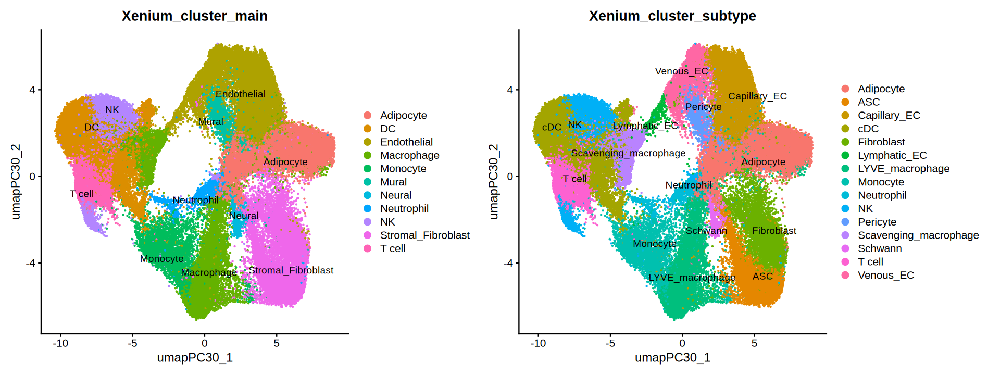

In [81]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = c("Xenium_cluster_main", "Xenium_cluster_subtype"),
  label = TRUE,
  repel = TRUE
)

In [82]:
options(repr.plot.width=16, repr.plot.height=16)

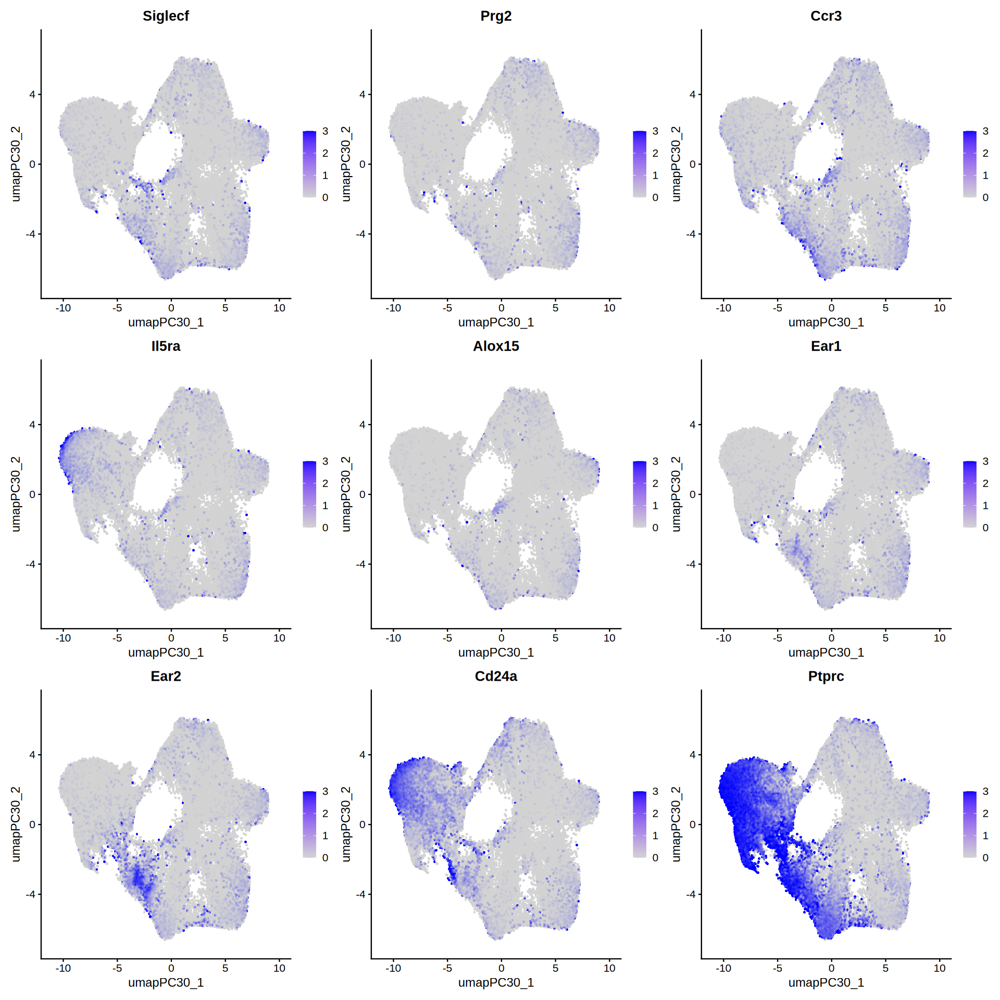

In [84]:
FeaturePlot(
    region_spatial,
    features = c(
        "Siglecf", "Prg2", "Ccr3",
        "Il5ra", "Alox15",
        "Ear1", "Ear2", "Cd24a", "Ptprc"
    ),
    reduction = "umap_PC30",
    raster = TRUE, 
    pt.size = 3, 
    max.cutoff = 3
)

In [85]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

## Step5 -  Cell Type Annotation M2 - By Reference

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [87]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [88]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)
DefaultAssay(scwat_ref) <- "RNA"

cat("Reference conditions:\n")
print(table(scwat_ref$Condition))

Reference conditions:

2.5 months  12 months 
     19252      21686 


In [89]:
scwat_ref$Wang_subtype_original <- as.character(
  scwat_ref$CellType_subtype
)

sort(unique(scwat_ref$Wang_subtype_original))

[1] "Arterial_EC"                "ASC"                       
 [3] "B"                          "Capillary_EC"              
 [5] "CCR2_inflammatory_Monocyte" "CCR7_migratory_DC"         
 [7] "cDC1"                       "cDC2"                      
 [9] "CP-1"                       "CP-2"                      
[11] "CP-A"                       "CX3CR1_Monocyte"           
[13] "Eosinophil"                 "Epithelial"                
[15] "IAP"                        "ILC2"                      
[17] "Inflammatory_Mac"           "LYVE1_resident_Mac"        
[19] "Mast cell"                  "MatureAdip"                
[21] "Mesothelial"                "Neutrophil"                
[23] "NK"                         "Pericyte"                  
[25] "Plasma"                     "RegFibro"                  
[27] "T"                          "TREM2_LAM"                 
[29] "γδ T"

In [90]:
# Explicit Wang subtype harmonization.
# Detailed immune labels are preserved.
# Closely related non-immune states are harmonized only for broad-lineage transfer.

wang_subtype_harmonization <- c(
  "ASC" = "ASC",
  "IAP" = "APC",
  "CP-1" = "APC",
  "CP-A" = "APC",
  "CP-2" = "APC",
  "RegFibro" = "APC",
  "MatureAdip" = "Adipocyte",
  "Pericyte" = "Mural",
  "Arterial_EC" = "Endothelial",
  "Capillary_EC" = "Endothelial",
  "Epithelial" = "Epithelial",
  "Mesothelial" = "Mesothelial",
  "T" = "T",
  "γδ T" = "γδ T",
  "NK" = "NK",
  "ILC2" = "ILC2",
  "B" = "B",
  "Plasma" = "Plasma",
  "CCR2_inflammatory_Monocyte" = "CCR2_inflammatory_Monocyte",
  "CX3CR1_Monocyte" = "CX3CR1_Monocyte",
  "Inflammatory_Mac" = "Inflammatory_Mac",
  "LYVE1_resident_Mac" = "LYVE1_resident_Mac",
  "TREM2_LAM" = "TREM2_LAM",
  "IFN_response_myeloid" = "IFN_response_myeloid",
  "cDC1" = "cDC1",
  "cDC2" = "cDC2",
  "CCR7_migratory_DC" = "CCR7_migratory_DC",
  "Neutrophil" = "Neutrophil",
  "Eosinophil" = "Eosinophil",
  "Mast cell" = "Mast cell"
)

unexpected_wang_labels <- setdiff(
  unique(scwat_ref$Wang_subtype_original),
  names(wang_subtype_harmonization)
)

if (length(unexpected_wang_labels)) {
  stop(
    "Unexpected Wang subtype labels. Review before proceeding: ",
    paste(unexpected_wang_labels, collapse = ", ")
  )
}

scwat_ref$Wang_subtype_harmonized <- unname(
  wang_subtype_harmonization[
    scwat_ref$Wang_subtype_original
  ]
)


In [91]:
scwat_ref$Wang_main <- case_when(
  scwat_ref$Wang_subtype_harmonized %in% c("ASC", "APC") ~ "Stromal_Fibroblast",
  scwat_ref$Wang_subtype_harmonized == "Mural" ~ "Mural",
  scwat_ref$Wang_subtype_harmonized == "Adipocyte" ~ "Adipocyte",
  scwat_ref$Wang_subtype_harmonized == "Endothelial" ~ "Endothelial",
  scwat_ref$Wang_subtype_harmonized == "Epithelial" ~ "Epithelial",
  scwat_ref$Wang_subtype_harmonized == "Mesothelial" ~ "Mesothelial",

  scwat_ref$Wang_subtype_harmonized %in% c("T", "γδ T") ~ "T cell",
  scwat_ref$Wang_subtype_harmonized == "NK" ~ "NK",
  scwat_ref$Wang_subtype_harmonized == "ILC2" ~ "ILC",
  scwat_ref$Wang_subtype_harmonized == "B" ~ "B cell",
  scwat_ref$Wang_subtype_harmonized == "Plasma" ~ "Plasma",

  scwat_ref$Wang_subtype_harmonized %in%
    c("CCR2_inflammatory_Monocyte", "CX3CR1_Monocyte") ~ "Monocyte",

  scwat_ref$Wang_subtype_harmonized %in%
    c("Inflammatory_Mac", "LYVE1_resident_Mac", "TREM2_LAM") ~ "Macrophage",

  scwat_ref$Wang_subtype_harmonized == "IFN_response_myeloid" ~ "Myeloid",

  scwat_ref$Wang_subtype_harmonized %in%
    c("cDC1", "cDC2", "CCR7_migratory_DC") ~ "DC",

  scwat_ref$Wang_subtype_harmonized == "Neutrophil" ~ "Neutrophil",
  scwat_ref$Wang_subtype_harmonized == "Eosinophil" ~ "Eosinophil",
  scwat_ref$Wang_subtype_harmonized == "Mast cell" ~ "Mast cell",

  TRUE ~ NA_character_
)

if (anyNA(scwat_ref$Wang_main)) {
  stop("Some Wang cells could not be mapped to the broad ontology.")
}

table(
  scwat_ref$Wang_main,
  scwat_ref$Wang_subtype_harmonized
)


                    
                     Adipocyte   APC   ASC     B CCR2_inflammatory_Monocyte
  Adipocyte                 40     0     0     0                          0
  B cell                     0     0     0  1241                          0
  DC                         0     0     0     0                          0
  Endothelial                0     0     0     0                          0
  Eosinophil                 0     0     0     0                          0
  Epithelial                 0     0     0     0                          0
  ILC                        0     0     0     0                          0
  Macrophage                 0     0     0     0                          0
  Mast cell                  0     0     0     0                          0
  Mesothelial                0     0     0     0                          0
  Monocyte                   0     0     0     0                       1256
  Mural                      0     0     0     0                   

In [ ]:
# saveRDS(scwat_ref,WANG_REFERENCE_PATH)

In [92]:
annotation_genes <- Reduce(
  intersect,
  list(
    FIX_GENESET,
    rownames(scwat_ref),
    rownames(region_spatial)
  )
)

cat("Annotation features:", length(annotation_genes), "\n")

if (length(annotation_genes) < 100) {
  stop("Too few shared identity genes for reliable transfer; review gene symbols/panel.")
}

# # Confirm short-/long-lived Eos state genes are excluded.
# stopifnot(
#   length(intersect(annotation_genes, eos_state_genes)) == 0
# )

Annotation features: 467 


In [95]:
ref_2p5 <- subset(
  scwat_ref,
  subset = Condition == "2.5 months"
)

ref_all <- scwat_ref

In [96]:
table(
  ref_2p5$Wang_subtype_harmonized
)

table(
  ref_all$Wang_subtype_harmonized
)


                 Adipocyte                        APC 
                        31                       6125 
                       ASC                          B 
                      1524                        715 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       653                         39 
                      cDC1                       cDC2 
                       465                        158 
           CX3CR1_Monocyte                Endothelial 
                       181                        917 
                Eosinophil                 Epithelial 
                        19                        413 
                      ILC2           Inflammatory_Mac 
                       473                        357 
        LYVE1_resident_Mac                  Mast cell 
                      3200                         28 
               Mesothelial                      Mural 
                       550                        827 
         


                 Adipocyte                        APC 
                        40                      14240 
                       ASC                          B 
                      6049                       1241 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                      1256                        113 
                      cDC1                       cDC2 
                       845                        247 
           CX3CR1_Monocyte                Endothelial 
                       570                       1319 
                Eosinophil                 Epithelial 
                       180                        625 
                      ILC2           Inflammatory_Mac 
                       751                        628 
        LYVE1_resident_Mac                  Mast cell 
                      5092                         52 
               Mesothelial                      Mural 
                      1856                       1628 
         

In [97]:
length(annotation_genes)

[1] 467

In [98]:
transfer_2p5 <- run_wang_transfer(
  reference = ref_2p5,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "Ref2p5"
)

transfer_all <- run_wang_transfer(
  reference = ref_all,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "RefAll"
)

Ref2p5: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”
RefAll: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”


In [99]:
region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$subtype
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$subtype
)

In [112]:
region_spatial

An object of class Seurat 
479 features across 89664 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap_PC30
 1 spatial field of view present: fov

In [114]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "x_centroid"                                                
  [5] "y_centroid"                                                
  [6] "transcript_counts"                                         
  [7] "control_probe_counts"                                      
  [8] "genomic_control_counts"                                    
  [9] "control_codeword_counts"                                   
 [10] "unassigned_codeword_counts"                                
 [11] "deprecated_codeword_counts"                                
 [12] "total_counts"                                              
 [13] "cell_area"                                                 
 [14] "nucleus_area"                                              
 [15] "nucleus_count"                                             
 [16] "segmentation_method"                                       
 [17] "region_id"                                                 
 [18] "control_fraction_cell"                                     
 [19] "nucleus_missing_flag"                                      
 [20] "multiple_nuclei_flag"                                      
 [21] "cell_area_outlier_flag"                                    
 [22] "high_control_flag"                                         
 [23] "segmentation_multiplet_flag"                               
 [24] "qc_core_pass"                                              
 [25] "qc_review_flag"                                            
 [26] "primary_include"                                           
 [27] "strict_include"                                            
 [28] "hotspot_review_cell"                                       
 [29] "hotspot_sensitivity_include"                               
 [30] "section_status"                                            
 [31] "mask_rule_primary"                                         
 [32] "mask_rule_strict"                                          
 [33] "mask_rule_hotspot_sensitivity"                             
 [34] "provenance"                                                
 [35] "initial_qc_status"                                         
 [36] "primary_include_revised"                                   
 [37] "cluster_res_0_7"                                           
 [38] "seurat_clusters"                                           
 [39] "cluster_res_0_8"                                           
 [40] "cluster_res_1"                                             
 [41] "cluster_res_1_2"                                           
 [42] "MainScore_Endothelial"                                     
 [43] "MainScore_Adipocyte"                                       
 [44] "MainScore_Stromal_Fibroblast"                              
 [45] "MainScore_Mural"                                           
 [46] "MainScore_Neural"                                          
 [47] "MainScore_Macrophage"                                      
 [48] "MainScore_Monocyte"                                        
 [49] "MainScore_Neutrophil"                                      
 [50] "MainScore_Mast.cell"                                       
 [51] "MainScore_Eosinophil"                                      
 [52] "MainScore_T.cell"                                          
 [53] "MainScore_NK"                                              
 [54] "MainScore_DC"                                              
 [55] "MainScore_Mesothelial"                                     
 [56] "MainDetect_Endothelial"                                    
 [57] "MainDetect_Adipocyte"                                      
 [58] "MainDetect_Stromal_Fibroblast"                             
 [59] "MainDetect_Mural"                                          
 [60] "MainDetect_Neural"                        

In [113]:
dim(region_spatial@meta.data)

[1] 89664   210

In [115]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [100]:
table(
  region_spatial$RefAll_subtype_predicted.id
)


                 Adipocyte                        APC 
                     10086                      14073 
                       ASC                          B 
                      5845                      13712 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                      1941                        770 
                      cDC1                       cDC2 
                      1127                       2931 
           CX3CR1_Monocyte                Endothelial 
                      2060                      13420 
                Eosinophil                 Epithelial 
                       222                        320 
                      ILC2           Inflammatory_Mac 
                        48                        778 
        LYVE1_resident_Mac                  Mast cell 
                     10683                         68 
               Mesothelial                      Mural 
                       847                       3571 
         

In [110]:
options(repr.plot.width=15, repr.plot.height=15)

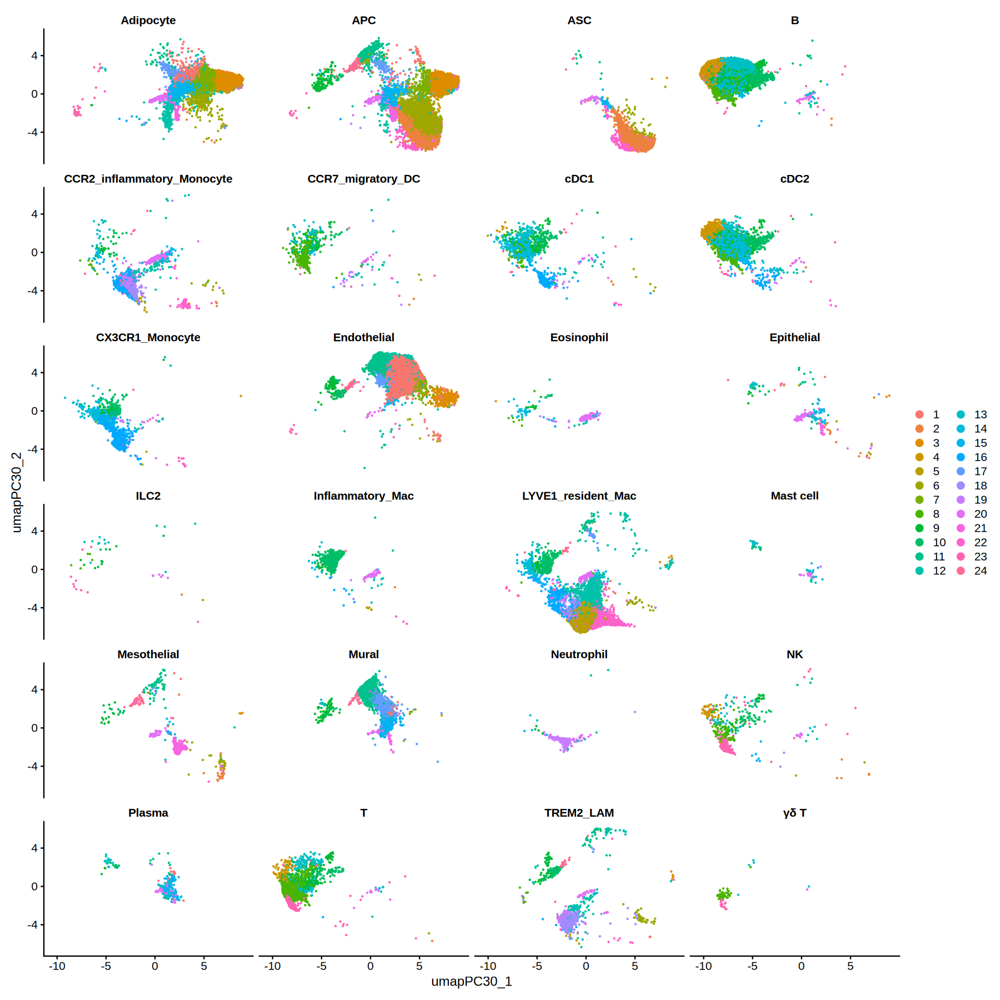

In [111]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  split.by = "RefAll_subtype_predicted.id",
  ncol=4
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


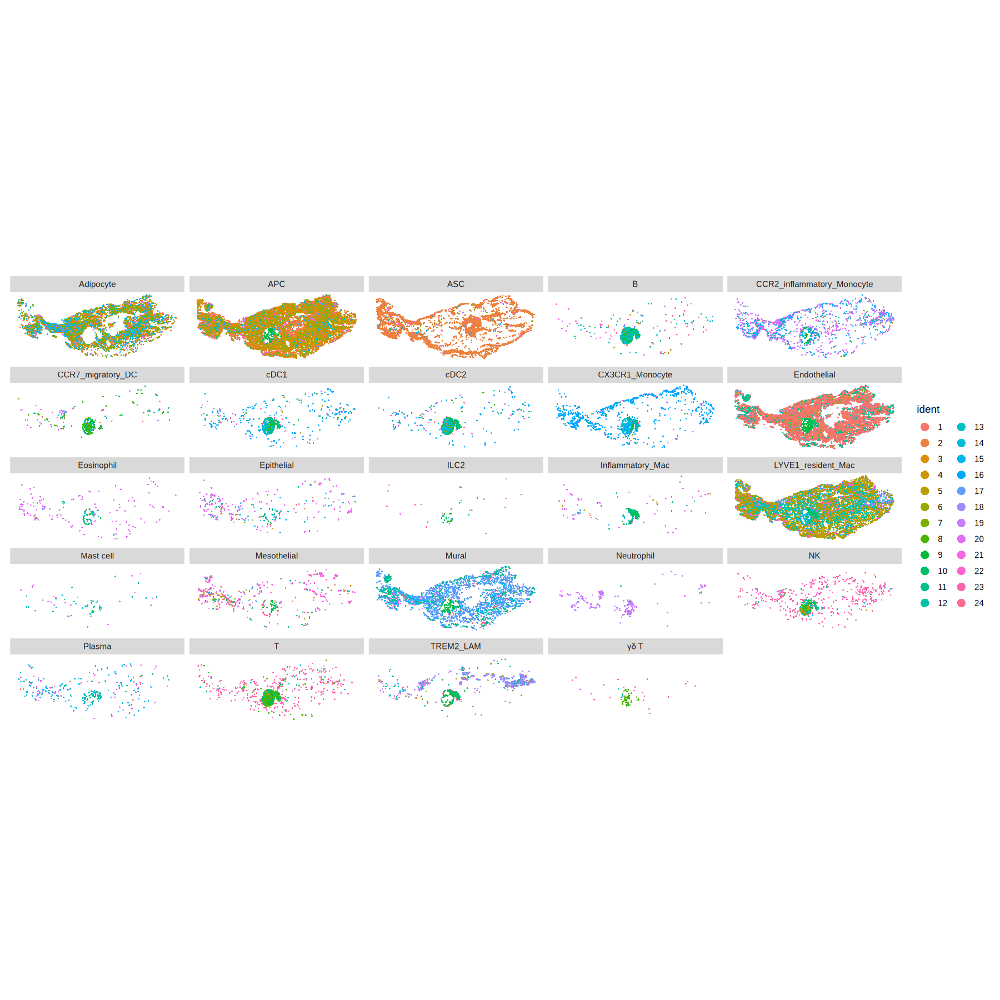

In [103]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "RefAll_subtype_predicted.id",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [107]:
options(repr.plot.width=15, repr.plot.height=10)

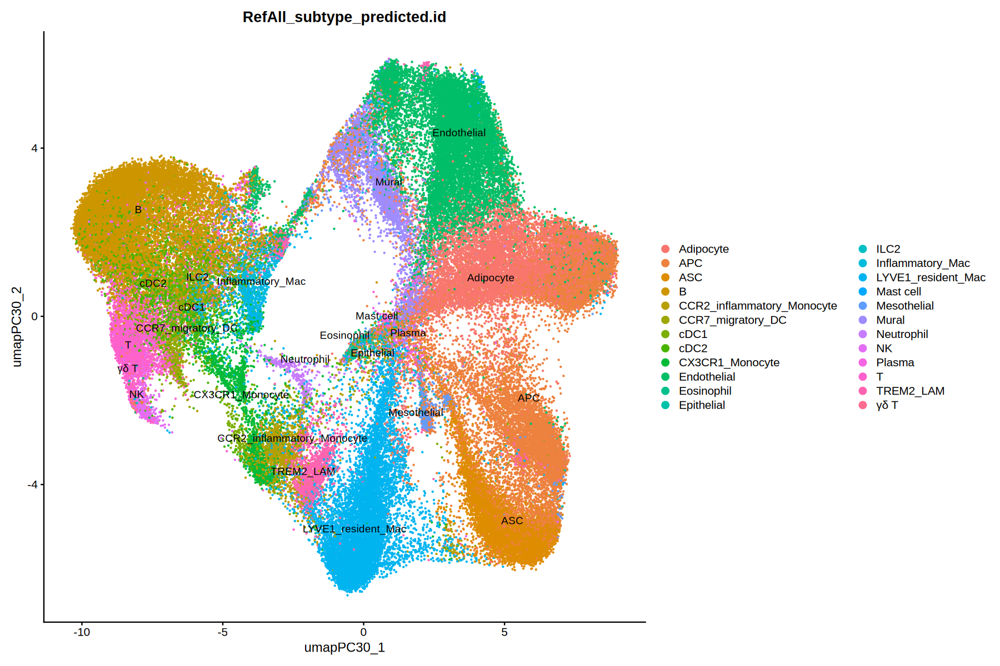

In [108]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = c("RefAll_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

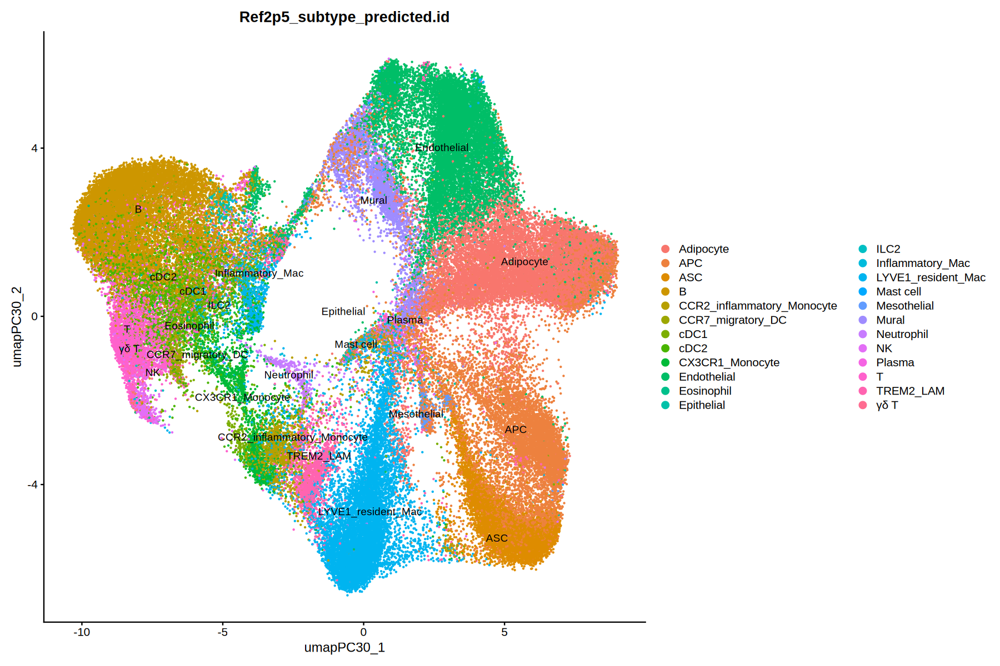

In [109]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = c("Ref2p5_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

## Step6 - Refine cell types

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [118]:
annotation_result <- refine_xenium_celltypes(
  object = region_spatial,
  reduction = "pca",
  dims = dims_use,
  k = 15,
  self_weight = 0.70
)

region_spatial <- annotation_result$object

Building transcriptomic kNN: k = 15, reduction = pca, dims = 1:30

Annotation complete.

Review cells: 24266 / 89664 (27.06%)

Schwann ontology-gap rescue: 710

Lymphatic EC ontology-gap rescue: 270



In [122]:
dim(region_spatial@meta.data)

[1] 89664   235

In [123]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "x_centroid"                                                
  [5] "y_centroid"                                                
  [6] "transcript_counts"                                         
  [7] "control_probe_counts"                                      
  [8] "genomic_control_counts"                                    
  [9] "control_codeword_counts"                                   
 [10] "unassigned_codeword_counts"                                
 [11] "deprecated_codeword_counts"                                
 [12] "total_counts"                                              
 [13] "cell_area"                                                 
 [14] "nucleus_area"                                              
 [15] "nucleus_count"                                             
 [16] "segmentation_method"                                       
 [17] "region_id"                                                 
 [18] "control_fraction_cell"                                     
 [19] "nucleus_missing_flag"                                      
 [20] "multiple_nuclei_flag"                                      
 [21] "cell_area_outlier_flag"                                    
 [22] "high_control_flag"                                         
 [23] "segmentation_multiplet_flag"                               
 [24] "qc_core_pass"                                              
 [25] "qc_review_flag"                                            
 [26] "primary_include"                                           
 [27] "strict_include"                                            
 [28] "hotspot_review_cell"                                       
 [29] "hotspot_sensitivity_include"                               
 [30] "section_status"                                            
 [31] "mask_rule_primary"                                         
 [32] "mask_rule_strict"                                          
 [33] "mask_rule_hotspot_sensitivity"                             
 [34] "provenance"                                                
 [35] "initial_qc_status"                                         
 [36] "primary_include_revised"                                   
 [37] "cluster_res_0_7"                                           
 [38] "seurat_clusters"                                           
 [39] "cluster_res_0_8"                                           
 [40] "cluster_res_1"                                             
 [41] "cluster_res_1_2"                                           
 [42] "MainScore_Endothelial"                                     
 [43] "MainScore_Adipocyte"                                       
 [44] "MainScore_Stromal_Fibroblast"                              
 [45] "MainScore_Mural"                                           
 [46] "MainScore_Neural"                                          
 [47] "MainScore_Macrophage"                                      
 [48] "MainScore_Monocyte"                                        
 [49] "MainScore_Neutrophil"                                      
 [50] "MainScore_Mast.cell"                                       
 [51] "MainScore_Eosinophil"                                      
 [52] "MainScore_T.cell"                                          
 [53] "MainScore_NK"                                              
 [54] "MainScore_DC"                                              
 [55] "MainScore_Mesothelial"                                     
 [56] "MainDetect_Endothelial"                                    
 [57] "MainDetect_Adipocyte"                                      
 [58] "MainDetect_Stromal_Fibroblast"                             
 [59] "MainDetect_Mural"                                          
 [60] "MainDetect_Neural"                        

In [119]:
annotation_result$summary[annotation_result$summary$Final_CellType_subtype=='Eosinophil',]

,Final_CellType_main,Final_CellType_subtype,Final_annotation_source,Final_annotation_confidence,Final_review_flag,n_cells
,<chr>,<chr>,<chr>,<chr>,<lgl>,<int>
21,Eosinophil,Eosinophil,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,114
22,Eosinophil,Eosinophil,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,31
23,Eosinophil,Eosinophil,Wang_RefAll_immune,REVIEW,TRUE,14


In [120]:
table(
  region_spatial$Final_CellType_main[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_CellType_subtype[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_annotation_confidence
)

table(
  region_spatial$Final_review_flag
)


         Adipocyte             B cell                 DC        Endothelial 
               921                486                125               9817 
        Eosinophil         Epithelial         Macrophage          Mast cell 
                14                228                649                  3 
       Mesothelial           Monocyte              Mural                 NK 
               227                 38                896                  4 
            Plasma Stromal_Fibroblast             T cell 
                14              10784                 60 


                 Adipocyte                        APC 
                       921                      10383 
                       ASC                          B 
                       401                        486 
              Capillary_EC CCR2_inflammatory_Monocyte 
                      8597                         24 
         CCR7_migratory_DC                       cDC1 
                        23                         29 
                      cDC2            CX3CR1_Monocyte 
                        73                         14 
                Eosinophil                 Epithelial 
                        14                        228 
          Inflammatory_Mac               Lymphatic_EC 
                       174                        248 
        LYVE1_resident_Mac                  Mast cell 
                       181                          3 
               Mesothelial                         NK 
                       227                          4 
         


       HIGH_CONCORDANT ONTOLOGY_GAP_SUPPORTED      REFERENCE_PRIMARY 
                 39965                    980                  24453 
                REVIEW 
                 24266 


FALSE  TRUE 
65398 24266 

In [124]:
options(repr.plot.width=15, repr.plot.height=10)

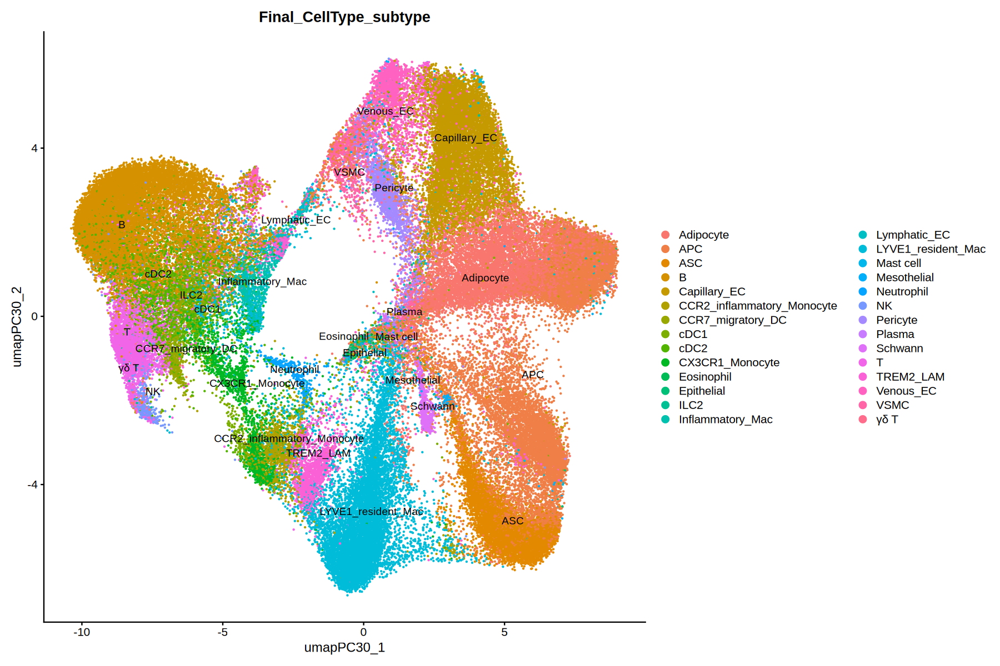

In [125]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = c("Final_CellType_subtype"),
  label = TRUE,
  repel = TRUE
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


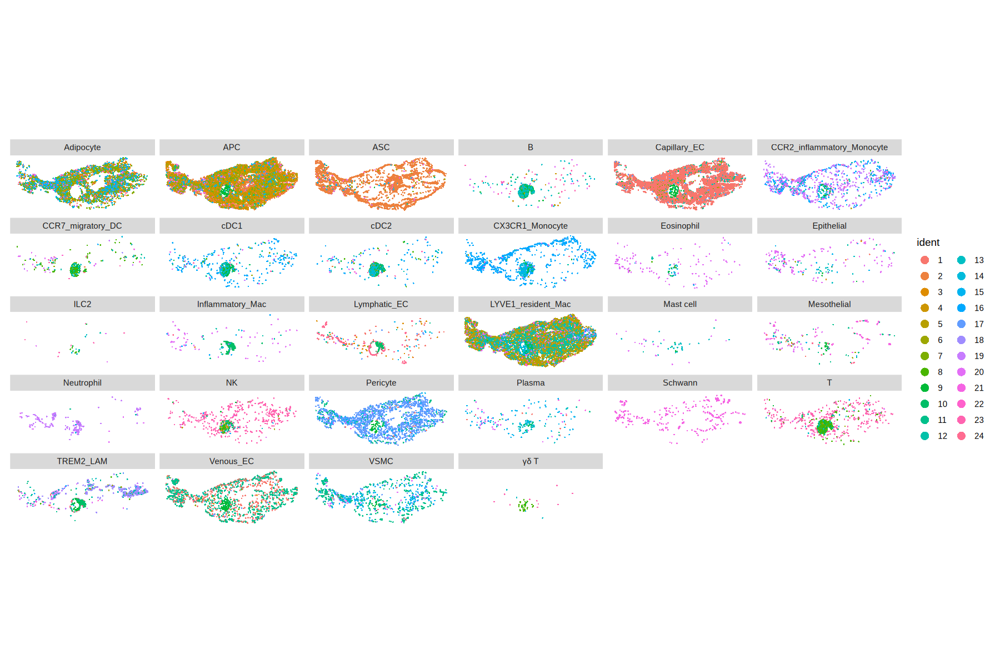

In [126]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "Final_CellType_subtype",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [131]:
options(repr.plot.width=20, repr.plot.height=16)

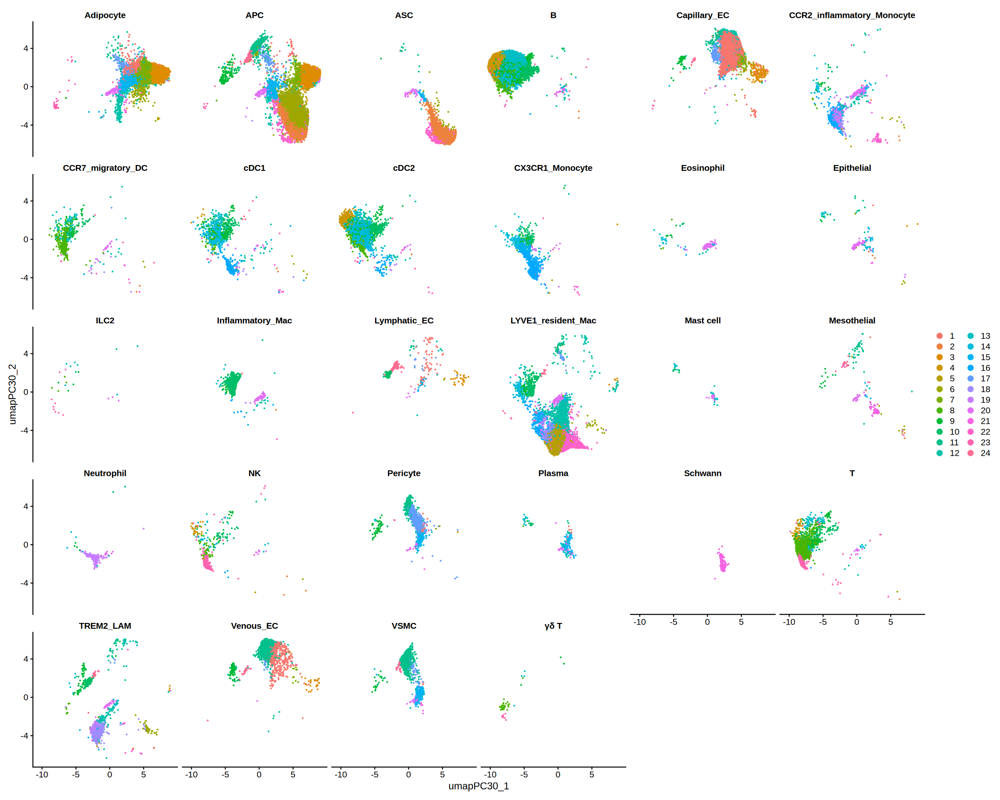

In [132]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  split.by = "Final_CellType_subtype",
  ncol=6
)

In [133]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

## Step7 - Define Eos 

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [134]:
length(rownames(region_spatial@meta.data)[region_spatial@meta.data$Final_CellType_subtype == "Eosinophil"])

[1] 159

In [135]:
dim(region_spatial)

[1]   479 89664

In [136]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [137]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)

In [138]:
eos_result <- score_eosinophil_likeness(
  reference = scwat_ref,
  query = region_spatial,
  reference_group_col = "Wang_subtype_harmonized"
)

region_spatial <- eos_result$object

Tier 1 core markers: Siglecf, Ccr3

Tier 2 support markers: Il5ra, Alox15

Tier 3 marker: Itgam

Tier 4 additional markers: Ear1, Ear2

Reference Eosinophils: 180

Reference other immune cells: 15001

Tier hierarchy:

  Tier1 = Siglecf + Ccr3

  Tier2 = core + Il5ra/Alox15

  Tier3 = core + Itgam

  Tier4 = any remaining >=2-marker combination

  Rest  = all remaining cells

Core weights (ranking only): Siglecf=0.386; Ccr3=0.614

Tier assignment complete.



In [147]:
dim(region_spatial@meta.data)

[1] 89664   256

In [148]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "x_centroid"                                                
  [5] "y_centroid"                                                
  [6] "transcript_counts"                                         
  [7] "control_probe_counts"                                      
  [8] "genomic_control_counts"                                    
  [9] "control_codeword_counts"                                   
 [10] "unassigned_codeword_counts"                                
 [11] "deprecated_codeword_counts"                                
 [12] "total_counts"                                              
 [13] "cell_area"                                                 
 [14] "nucleus_area"                                              
 [15] "nucleus_count"                                             
 [16] "segmentation_method"                                       
 [17] "region_id"                                                 
 [18] "control_fraction_cell"                                     
 [19] "nucleus_missing_flag"                                      
 [20] "multiple_nuclei_flag"                                      
 [21] "cell_area_outlier_flag"                                    
 [22] "high_control_flag"                                         
 [23] "segmentation_multiplet_flag"                               
 [24] "qc_core_pass"                                              
 [25] "qc_review_flag"                                            
 [26] "primary_include"                                           
 [27] "strict_include"                                            
 [28] "hotspot_review_cell"                                       
 [29] "hotspot_sensitivity_include"                               
 [30] "section_status"                                            
 [31] "mask_rule_primary"                                         
 [32] "mask_rule_strict"                                          
 [33] "mask_rule_hotspot_sensitivity"                             
 [34] "provenance"                                                
 [35] "initial_qc_status"                                         
 [36] "primary_include_revised"                                   
 [37] "cluster_res_0_7"                                           
 [38] "seurat_clusters"                                           
 [39] "cluster_res_0_8"                                           
 [40] "cluster_res_1"                                             
 [41] "cluster_res_1_2"                                           
 [42] "MainScore_Endothelial"                                     
 [43] "MainScore_Adipocyte"                                       
 [44] "MainScore_Stromal_Fibroblast"                              
 [45] "MainScore_Mural"                                           
 [46] "MainScore_Neural"                                          
 [47] "MainScore_Macrophage"                                      
 [48] "MainScore_Monocyte"                                        
 [49] "MainScore_Neutrophil"                                      
 [50] "MainScore_Mast.cell"                                       
 [51] "MainScore_Eosinophil"                                      
 [52] "MainScore_T.cell"                                          
 [53] "MainScore_NK"                                              
 [54] "MainScore_DC"                                              
 [55] "MainScore_Mesothelial"                                     
 [56] "MainDetect_Endothelial"                                    
 [57] "MainDetect_Adipocyte"                                      
 [58] "MainDetect_Stromal_Fibroblast"                             
 [59] "MainDetect_Mural"                                          
 [60] "MainDetect_Neural"                        

In [139]:
table(
  region_spatial$EosRef_tier,
  useNA = "ifany"
)


Conf Tier1 Conf Tier2 Conf Tier3 Conf Tier4       Rest 
       407        929       2470       4522      81336 

In [140]:
names(eos_result)

[1] "object"                      "marker_stats"               
 [3] "pair_stats"                  "rule_performance"           
 [5] "calibration"                 "reference_scores"           
 [7] "reference_tier_distribution" "candidate_table"            
 [9] "summary"                     "tier_summary"               
[11] "parameters"

In [141]:
eos_result$marker_stats

Gene,Marker_role,n_Eos,Eos_positive,Eos_pct,Other_macro_pct,Max_other_pct,Max_other_celltype,log2_detection_OR_macro,core_anchor_valid,core_weight
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<dbl>
Siglecf,Tier1_core,180,30,16.666667,1.2873214,5.809859,TREM2_LAM,3.7778262,TRUE,0.385808
Ccr3,Tier1_core,180,94,52.222222,1.4949066,6.161972,TREM2_LAM,6.0141590,TRUE,0.614192
Il5ra,Tier2_support,180,14,7.777778,5.2963671,40.000000,Plasma,0.5963723,FALSE,0.000000
Alox15,Tier2_support,180,67,37.222222,5.6362454,79.299363,Inflammatory_Mac,3.2720157,FALSE,0.000000
Itgam,Tier3_support,180,92,51.111111,41.1478146,96.496815,Inflammatory_Mac,0.5755878,FALSE,0.000000
Ear1,Tier4_context,180,0,0.000000,0.3448246,1.923077,Mast cell,-0.9009362,FALSE,0.000000
Ear2,Tier4_context,180,3,1.666667,14.7833889,62.631579,CX3CR1_Monocyte,-3.1534228,FALSE,0.000000


In [142]:
eos_result$pair_stats

Tier_rule,Core_marker,Partner_marker,Pair,n_Eos,Eos_positive,Eos_pct,Other_macro_pct,Max_other_pct,Max_other_celltype,log2_detection_OR_macro,reference_supported
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
Tier2,Siglecf,Il5ra,Siglecf + Il5ra,180,4,2.222222,0.00000000,0.000000,Mast cell,3.882979,TRUE
Tier2,Ccr3,Il5ra,Ccr3 + Il5ra,180,9,5.000000,0.28568619,1.923077,Mast cell,3.598426,TRUE
Tier2,Siglecf,Alox15,Siglecf + Alox15,180,14,7.777778,0.06360807,0.000000,Mast cell,5.202433,TRUE
Tier2,Ccr3,Alox15,Ccr3 + Alox15,180,44,24.444444,0.06210968,0.000000,Mast cell,7.115579,TRUE
Tier3,Siglecf,Itgam,Siglecf + Itgam,180,21,11.666667,0.96507512,5.633803,TREM2_LAM,3.554359,TRUE
Tier3,Ccr3,Itgam,Ccr3 + Itgam,180,51,28.333333,0.69867045,5.633803,TREM2_LAM,5.502629,TRUE


In [143]:
eos_result$summary

EosRef_call,n_cells,fraction
<chr>,<int>,<dbl>
OUTSIDE_IMMUNE,48155,0.537060582
REF_EOS_REST,35574,0.396747859
REF_EOS_TIER1,240,0.002676660
REF_EOS_TIER2,506,0.005643291
REF_EOS_TIER3,2102,0.023443076
REF_EOS_TIER4,3087,0.034428533


In [144]:
eos_result$tier_summary

EosRef_tier,n_cells,fraction
<chr>,<int>,<dbl>
Conf Tier1,407,0.004539168
Conf Tier2,929,0.010360903
Conf Tier3,2470,0.027547288
Conf Tier4,4522,0.050432727
Rest,81336,0.907119914


In [145]:
table(
  region_spatial$EosRef_tier,
  region_spatial$EosRef_call
)

            
             OUTSIDE_IMMUNE REF_EOS_REST REF_EOS_TIER1 REF_EOS_TIER2
  Conf Tier1            167            0           240             0
  Conf Tier2            423            0             0           506
  Conf Tier3            368            0             0             0
  Conf Tier4           1435            0             0             0
  Rest                45762        35574             0             0
            
             REF_EOS_TIER3 REF_EOS_TIER4
  Conf Tier1             0             0
  Conf Tier2             0             0
  Conf Tier3          2102             0
  Conf Tier4             0          3087
  Rest                   0             0

In [146]:
table(region_spatial$EosRef_call, region_spatial$Final_CellType_subtype)

                
                 Adipocyte   APC   ASC     B Capillary_EC
  OUTSIDE_IMMUNE      9179 14760  6051     0        10343
  REF_EOS_REST           0     0     0 13600            0
  REF_EOS_TIER1          0     0     0    11            0
  REF_EOS_TIER2          0     0     0   134            0
  REF_EOS_TIER3          0     0     0    32            0
  REF_EOS_TIER4          0     0     0   226            0
                
                 CCR2_inflammatory_Monocyte CCR7_migratory_DC  cDC1  cDC2
  OUTSIDE_IMMUNE                          0                 0     0     0
  REF_EOS_REST                          701               829  1049  2824
  REF_EOS_TIER1                          42                 1     8     3
  REF_EOS_TIER2                          42                 3     9    12
  REF_EOS_TIER3                         233                 5    13    40
  REF_EOS_TIER4                         649                 8    48    71
                
                 CX3CR1_M

In [ ]:
res <- plot_eos_call_by_subtype(
  object = region_spatial,
  return_data = TRUE
)

In [151]:
options(repr.plot.width=12, repr.plot.height=7)

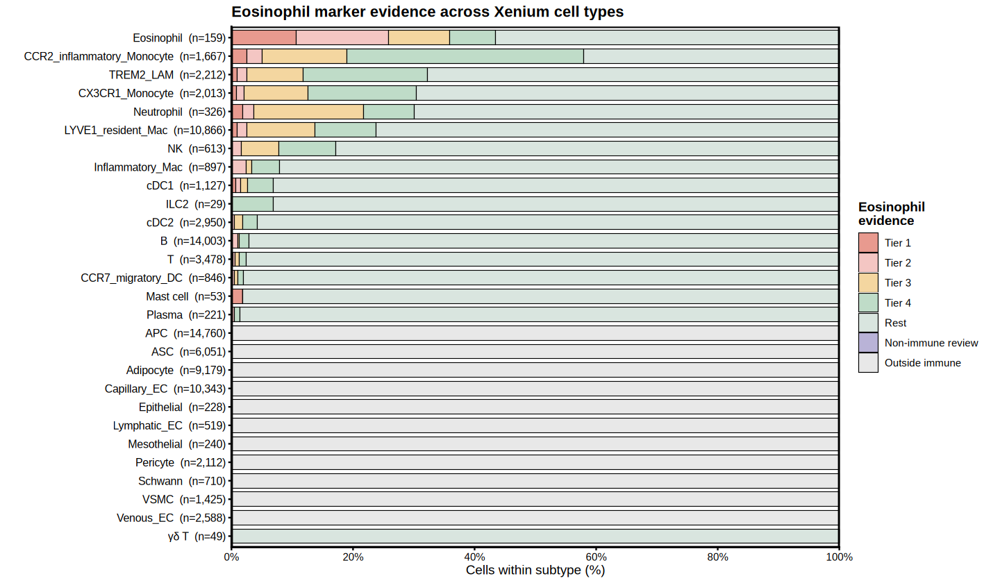

In [155]:
res$plot

In [168]:
options(repr.plot.width=18, repr.plot.height=8)

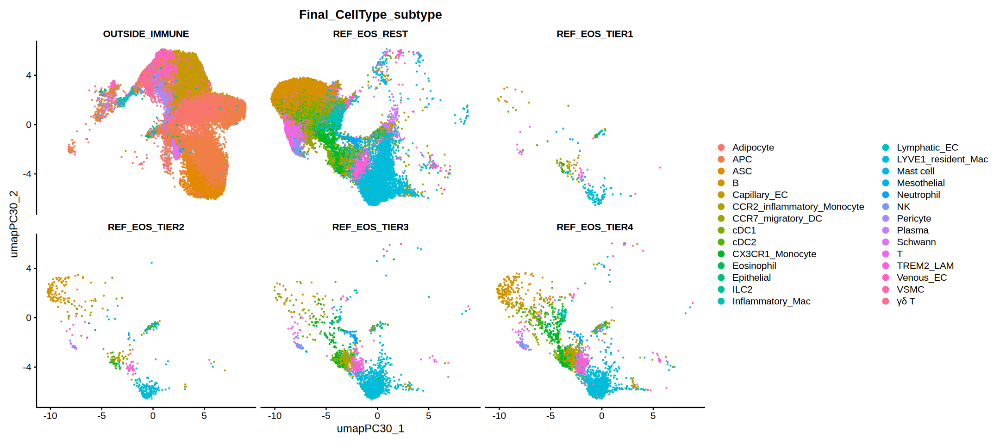

In [158]:
DimPlot(
  region_spatial,
  reduction = "umap_PC30",
  group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  ncol=3
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


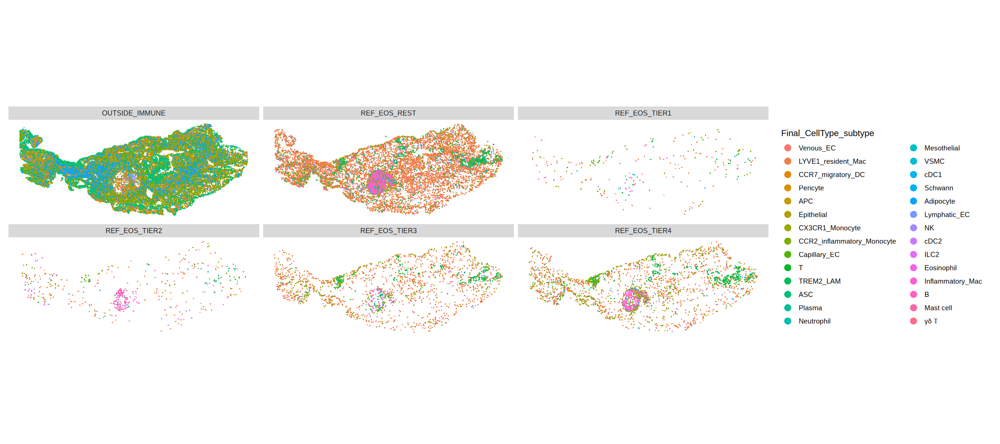

In [159]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
    group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [160]:
md <- region_spatial@meta.data

existing_eos <- (
  as.character(md$Final_CellType_subtype) ==
    "Eosinophil"
)

tier12 <- (
  md$EosRef_call %in%
    c(
      "REF_EOS_TIER1",
      "REF_EOS_TIER2"
    )
)

region_spatial$Final_Eos_status <- dplyr::case_when(

  existing_eos & tier12 ~
    "FINAL_EOS",

  existing_eos & !tier12 ~
    "REVIEW_EXISTING_EOS",

  !existing_eos & tier12 ~
    "REVIEW_TIER12_NON_EOS",

  TRUE ~
    "NON_EOS"
)

In [161]:
table(
  region_spatial$Final_Eos_status
)


            FINAL_EOS               NON_EOS   REVIEW_EXISTING_EOS 
                   41                 88800                   118 
REVIEW_TIER12_NON_EOS 
                  705 

In [162]:
region_spatial$Final_CellType_subtype_refined <-
  as.character(
    region_spatial$Final_CellType_subtype
  )

In [163]:
region_spatial$Final_CellType_subtype_refined[
  existing_eos | tier12
] <- "Eosinophil"

In [164]:
sum(region_spatial$Final_CellType_subtype_refined == "Eosinophil")

[1] 864

In [165]:
dim(region_spatial@meta.data)

[1] 89664   258

In [359]:
unique(region_spatial$Final_CellType_subtype_refined)

[1] "Venous_EC"                  "LYVE1_resident_Mac"        
 [3] "CCR7_migratory_DC"          "Pericyte"                  
 [5] "APC"                        "Epithelial"                
 [7] "CX3CR1_Monocyte"            "CCR2_inflammatory_Monocyte"
 [9] "Capillary_EC"               "T"                         
[11] "TREM2_LAM"                  "ASC"                       
[13] "Plasma"                     "Neutrophil"                
[15] "Mesothelial"                "Eosinophil"                
[17] "VSMC"                       "cDC1"                      
[19] "Schwann"                    "Adipocyte"                 
[21] "Lymphatic_EC"               "NK"                        
[23] "cDC2"                       "ILC2"                      
[25] "B"                          "Mast cell"                 
[27] "Inflammatory_Mac"           "γδ T"

In [166]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "x_centroid"                                                
  [5] "y_centroid"                                                
  [6] "transcript_counts"                                         
  [7] "control_probe_counts"                                      
  [8] "genomic_control_counts"                                    
  [9] "control_codeword_counts"                                   
 [10] "unassigned_codeword_counts"                                
 [11] "deprecated_codeword_counts"                                
 [12] "total_counts"                                              
 [13] "cell_area"                                                 
 [14] "nucleus_area"                                              
 [15] "nucleus_count"                                             
 [16] "segmentation_method"                                       
 [17] "region_id"                                                 
 [18] "control_fraction_cell"                                     
 [19] "nucleus_missing_flag"                                      
 [20] "multiple_nuclei_flag"                                      
 [21] "cell_area_outlier_flag"                                    
 [22] "high_control_flag"                                         
 [23] "segmentation_multiplet_flag"                               
 [24] "qc_core_pass"                                              
 [25] "qc_review_flag"                                            
 [26] "primary_include"                                           
 [27] "strict_include"                                            
 [28] "hotspot_review_cell"                                       
 [29] "hotspot_sensitivity_include"                               
 [30] "section_status"                                            
 [31] "mask_rule_primary"                                         
 [32] "mask_rule_strict"                                          
 [33] "mask_rule_hotspot_sensitivity"                             
 [34] "provenance"                                                
 [35] "initial_qc_status"                                         
 [36] "primary_include_revised"                                   
 [37] "cluster_res_0_7"                                           
 [38] "seurat_clusters"                                           
 [39] "cluster_res_0_8"                                           
 [40] "cluster_res_1"                                             
 [41] "cluster_res_1_2"                                           
 [42] "MainScore_Endothelial"                                     
 [43] "MainScore_Adipocyte"                                       
 [44] "MainScore_Stromal_Fibroblast"                              
 [45] "MainScore_Mural"                                           
 [46] "MainScore_Neural"                                          
 [47] "MainScore_Macrophage"                                      
 [48] "MainScore_Monocyte"                                        
 [49] "MainScore_Neutrophil"                                      
 [50] "MainScore_Mast.cell"                                       
 [51] "MainScore_Eosinophil"                                      
 [52] "MainScore_T.cell"                                          
 [53] "MainScore_NK"                                              
 [54] "MainScore_DC"                                              
 [55] "MainScore_Mesothelial"                                     
 [56] "MainDetect_Endothelial"                                    
 [57] "MainDetect_Adipocyte"                                      
 [58] "MainDetect_Stromal_Fibroblast"                             
 [59] "MainDetect_Mural"                                          
 [60] "MainDetect_Neural"                        

In [167]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [360]:
library(Seurat)
library(dplyr)
library(tidyr)
library(ggplot2)
library(tibble)

# ============================================================
# 1. Desired cell-type order
# ============================================================

celltype_order <- c(
  "Venous_EC",
  "LYVE1_resident_Mac",
  "CCR7_migratory_DC",
  "Pericyte",
  "APC",
  "Epithelial",
  "CX3CR1_Monocyte",
  "CCR2_inflammatory_Monocyte",
  "Capillary_EC",
  "T",
  "TREM2_LAM",
  "ASC",
  "Plasma",
  "Neutrophil",
  "Mesothelial",
  "Eosinophil",
  "VSMC",
  "cDC1",
  "Schwann",
  "Adipocyte",
  "Lymphatic_EC",
  "NK",
  "cDC2",
  "ILC2",
  "B",
  "Mast cell",
  "Inflammatory_Mac",
  "γδ T"
)


# ============================================================
# 2. Ranked marker candidates
#
# First genes are preferred.
# Script will take first 3 PRESENT in Xenium panel.
# ============================================================

marker_candidates <- list(

  Venous_EC = c(
    "Ackr1",
    "Vcam1",
    "Vwf",
    "Emcn",
    "Kdr"
  ),

  LYVE1_resident_Mac = c(
    "Lyve1",
    "Folr2",
    "F13a1",
    "Cfh",
    "Adgre1"
  ),

  CCR7_migratory_DC = c(
    "Ccr7",
    "Fscn1",
    "Ccl22",
    "Ccl17",
    "Cd83"
  ),

  Pericyte = c(
    "Rgs5",
    "Cspg4",
    "Pdgfrb",
    "Des",
    "Kcnj8"
  ),

  APC = c(
    "Pi16",
    "Dpp4",
    "Col14a1",
    "Cd248",
    "Pcolce2"
  ),

  Epithelial = c(
    "Epcam",
    "Krt8",
    "Krt18",
    "Krt19",
    "Krt7"
  ),

  CX3CR1_Monocyte = c(
    "Cx3cr1",
    "Nr4a1",
    "Fcgr1",
    "Lst1",
    "Csf1r"
  ),

  CCR2_inflammatory_Monocyte = c(
    "Ccr2",
    "Ly6c2",
    "Plac8",
    "S100a8",
    "Ccl2"
  ),

  Capillary_EC = c(
    "Gpihbp1",
    "Kdr",
    "Plvap",
    "Pecam1",
    "Klf2"
  ),

  T = c(
    "Cd3e",
    "Trbc1",
    "Lck",
    "Cd247",
    "Lat"
  ),

  TREM2_LAM = c(
    "Trem2",
    "Lpl",
    "Spp1",
    "Gpnmb",
    "Cd9"
  ),

  ASC = c(
    "Cd55",
    "Fbn1",
    "Pdgfra",
    "Sema3c",
    "Creb5"
  ),

  Plasma = c(
    "Jchain",
    "Mzb1",
    "Sdc1",
    "Prdm1",
    "Xbp1"
  ),

  Neutrophil = c(
    "Retnlg",
    "S100a8",
    "S100a9",
    "Csf3r",
    "Mmp8"
  ),

  Mesothelial = c(
    "Msln",
    "Upk3b",
    "Krt19",
    "Wt1",
    "Krt8"
  ),

  Eosinophil = c(
    "Ccr3",
    "Siglecf",
    "Prg2",
    "Il5ra",
    "Alox15"
  ),

  VSMC = c(
    "Myh11",
    "Acta2",
    "Tagln",
    "Cnn1",
    "Myl9"
  ),

  cDC1 = c(
    "Clec9a",
    "Xcr1",
    "Batf3",
    "Irf8",
    "Cadm1"
  ),

  Schwann = c(
    "Plp1",
    "S100b",
    "Sox10",
    "Mpz",
    "Sox2"
  ),

  Adipocyte = c(
    "Adipoq",
    "Plin1",
    "Aqp7",
    "Pck1",
    "Car3",
    "Retn"
  ),

  Lymphatic_EC = c(
    "Prox1",
    "Pdpn",
    "Ccl21a",
    "Flt4",
    "Lyve1"
  ),

  NK = c(
    "Nkg7",
    "Klrb1c",
    "Prf1",
    "Gzmb",
    "Klra8"
  ),

  cDC2 = c(
    "Clec10a",
    "Cd209a",
    "Sirpa",
    "Irf4",
    "Fcgr2b"
  ),

  ILC2 = c(
    "Gata3",
    "Il7r",
    "Klrg1",
    "Rora",
    "Il1rl1"
  ),

  B = c(
    "Cd79a",
    "Ms4a1",
    "Cd22",
    "Cd19",
    "Cd37"
  ),

  `Mast cell` = c(
    "Cpa3",
    "Kit",
    "Mcpt4",
    "Mcpt8",
    "Tpsb2"
  ),

  Inflammatory_Mac = c(
    "Il1b",
    "Cxcl2",
    "Ccl3",
    "Nfkbia",
    "Tnf"
  ),

  `γδ T` = c(
    "Trdc",
    "Trgc1",
    "Sox13",
    "Il17a",
    "Rorc"
  )
)

In [361]:
# ============================================================
# 4. Select first 3 available markers for each cell type
# ============================================================

selected_markers <- lapply(
  marker_candidates,
  function(x) {
    head(
      x[x %in% panel_genes],
      3
    )
  }
)


# Make readable table
marker_table <- dplyr::bind_rows(
  lapply(
    names(selected_markers),
    function(ct) {

      genes <- selected_markers[[ct]]

      tibble(
        CellType = ct,
        Marker = genes,
        Marker_rank = seq_along(genes)
      )
    }
  )
)

marker_table

CellType,Marker,Marker_rank
<chr>,<chr>,<int>
Venous_EC,Vwf,1
Venous_EC,Kdr,2
LYVE1_resident_Mac,Lyve1,1
LYVE1_resident_Mac,Folr2,2
LYVE1_resident_Mac,F13a1,3
Pericyte,Rgs5,1
Pericyte,Des,2
APC,Pi16,1
APC,Pcolce2,2


In [363]:
marker_table %>%
  dplyr::count(
    CellType,
    name = "n_markers"
  )

CellType,n_markers
<chr>,<int>
APC,2
Adipocyte,3
CX3CR1_Monocyte,2
Capillary_EC,3
Eosinophil,3
Epithelial,3
ILC2,1
Inflammatory_Mac,2
LYVE1_resident_Mac,3


In [364]:
region_spatial$Final_CellType_subtype_refined <- factor(
  region_spatial$Final_CellType_subtype_refined,
  levels = celltype_order
)

In [365]:
markers_plot <- unlist(
  selected_markers[celltype_order],
  use.names = FALSE
)

# Remove accidental duplicates
markers_plot <- unique(
  markers_plot
)

markers_plot

[1] "Vwf"     "Kdr"     "Lyve1"   "Folr2"   "F13a1"   "Rgs5"    "Des"    
 [8] "Pi16"    "Pcolce2" "Epcam"   "Krt8"    "Krt19"   "Nr4a1"   "Lst1"   
[15] "Gpihbp1" "Plvap"   "Cd9"     "Sdc1"    "Csf3r"   "Mmp8"    "Upk3b"  
[22] "Ccr3"    "Siglecf" "Prg2"    "Myh11"   "Tagln"   "Cnn1"    "Plp1"   
[29] "Sox2"    "Aqp7"    "Pck1"    "Car3"    "Prox1"   "Klra8"   "Sirpa"  
[36] "Il1rl1"  "Cpa3"    "Cxcl2"   "Nfkbia"

In [367]:
region_spatial$Final_CellType_subtype_refined <- factor(
  region_spatial$Final_CellType_subtype_refined,
  levels = rev(celltype_order)
)

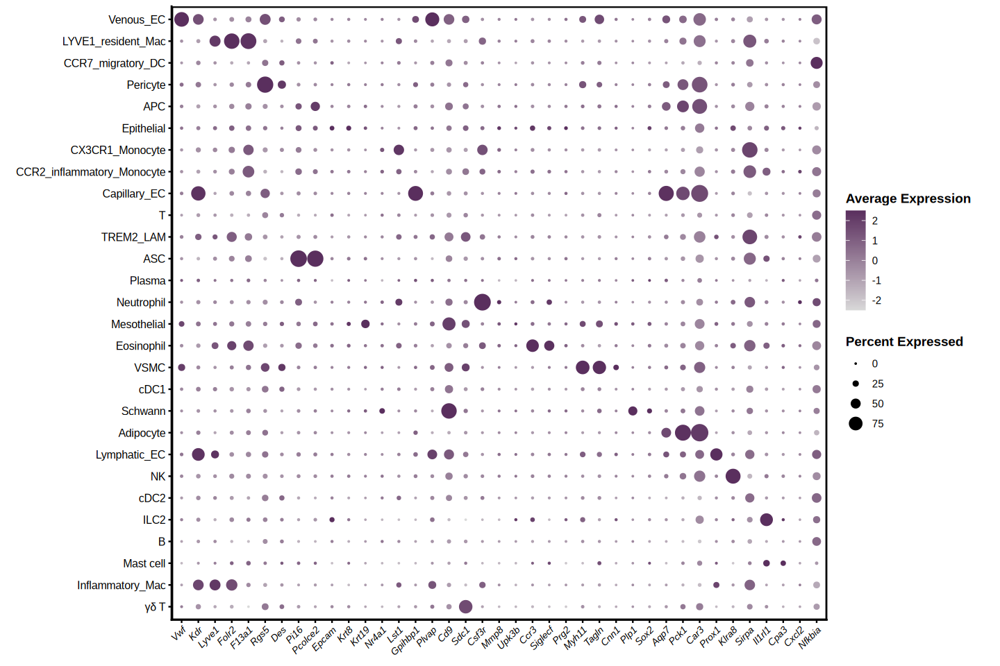

In [369]:
DefaultAssay(region_spatial) <- "Xenium"

p_marker_dot <- DotPlot(
  region_spatial,
  features = markers_plot,
  group.by = "Final_CellType_subtype_refined",
  assay = "Xenium",
  dot.scale = 6,
  scale = TRUE,
  cols = c(
    "#D9D9D9",
    "#5A2F5E"
  )
) +

  labs(
    x = NULL,
    y = NULL,
    colour = "Average\nexpression",
    size = "Cells\nexpressed (%)"
  ) +

  theme_cell(
    base_size = 11
  ) +

  theme(
    axis.text.x = element_text(
      angle = 45,
      hjust = 1,
      vjust = 1,
      size = 8,
      colour = "black",
      face = "italic"
    ),

    axis.text.y = element_text(
      size = 9,
      colour = "black"
    ),

    legend.position = "right",

    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank()
  )

p_marker_dot

In [169]:
options(repr.plot.width=12, repr.plot.height=8)

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


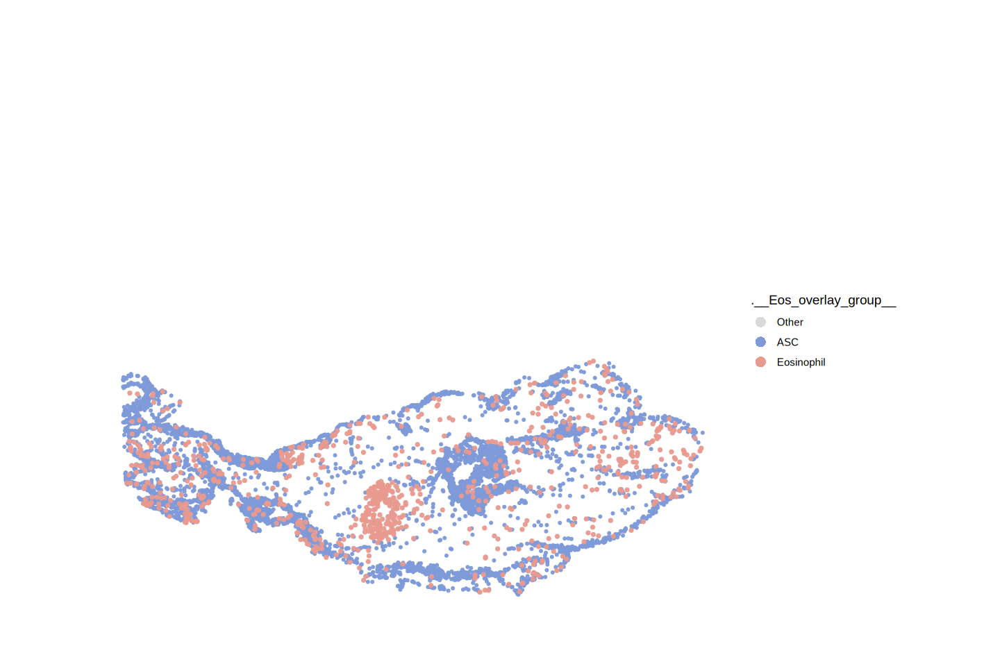

In [170]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "ASC",
    flip_xy = TRUE
)

In [171]:
unique(region_spatial$Final_CellType_subtype_refined)

[1] "Venous_EC"                  "LYVE1_resident_Mac"        
 [3] "CCR7_migratory_DC"          "Pericyte"                  
 [5] "APC"                        "Epithelial"                
 [7] "CX3CR1_Monocyte"            "CCR2_inflammatory_Monocyte"
 [9] "Capillary_EC"               "T"                         
[11] "TREM2_LAM"                  "ASC"                       
[13] "Plasma"                     "Neutrophil"                
[15] "Mesothelial"                "Eosinophil"                
[17] "VSMC"                       "cDC1"                      
[19] "Schwann"                    "Adipocyte"                 
[21] "Lymphatic_EC"               "NK"                        
[23] "cDC2"                       "ILC2"                      
[25] "B"                          "Mast cell"                 
[27] "Inflammatory_Mac"           "γδ T"

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


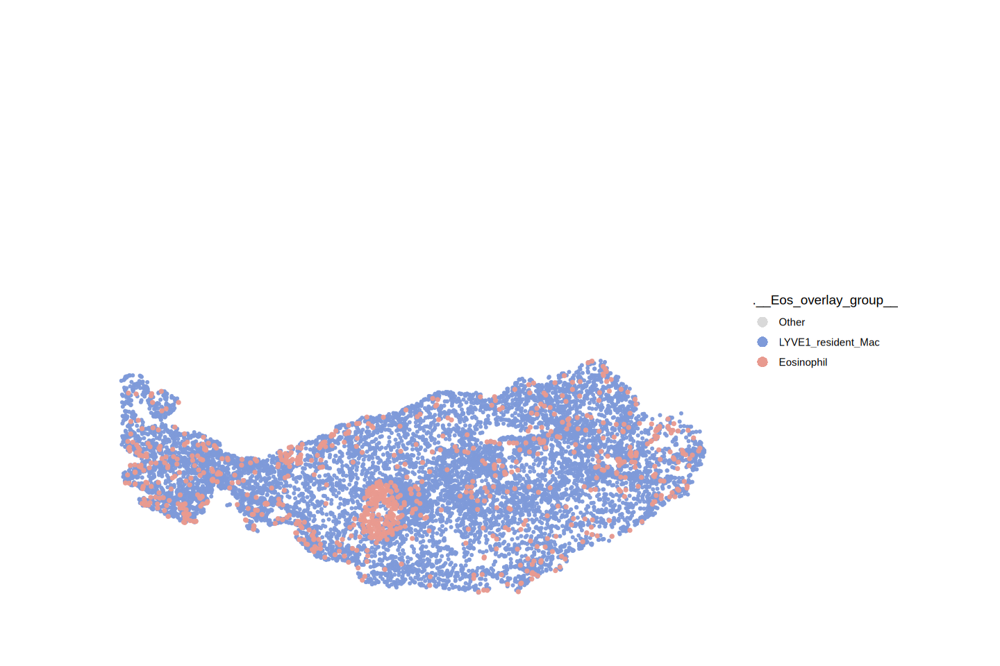

In [172]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "LYVE1_resident_Mac",
    flip_xy = TRUE
)

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


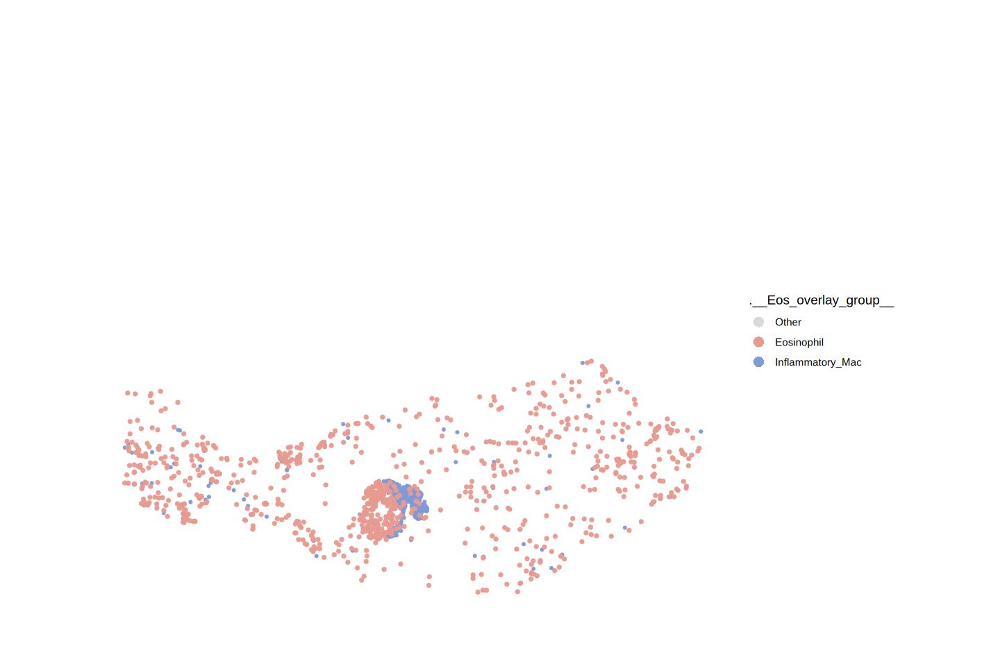

In [173]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Inflammatory_Mac",
    flip_xy = TRUE
)

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


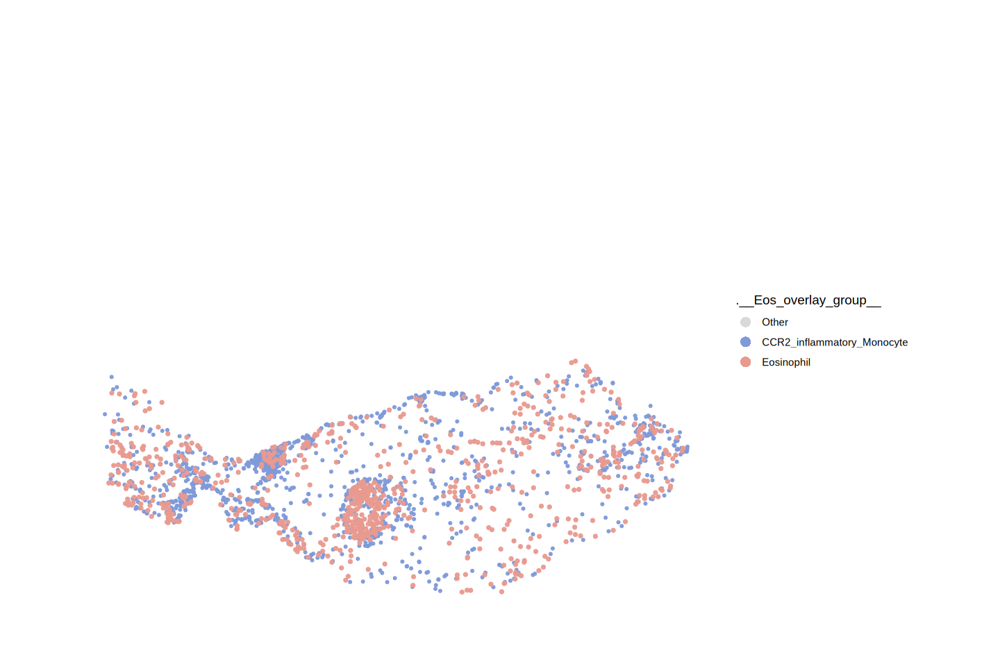

In [174]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "CCR2_inflammatory_Monocyte",
    flip_xy = TRUE
)

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


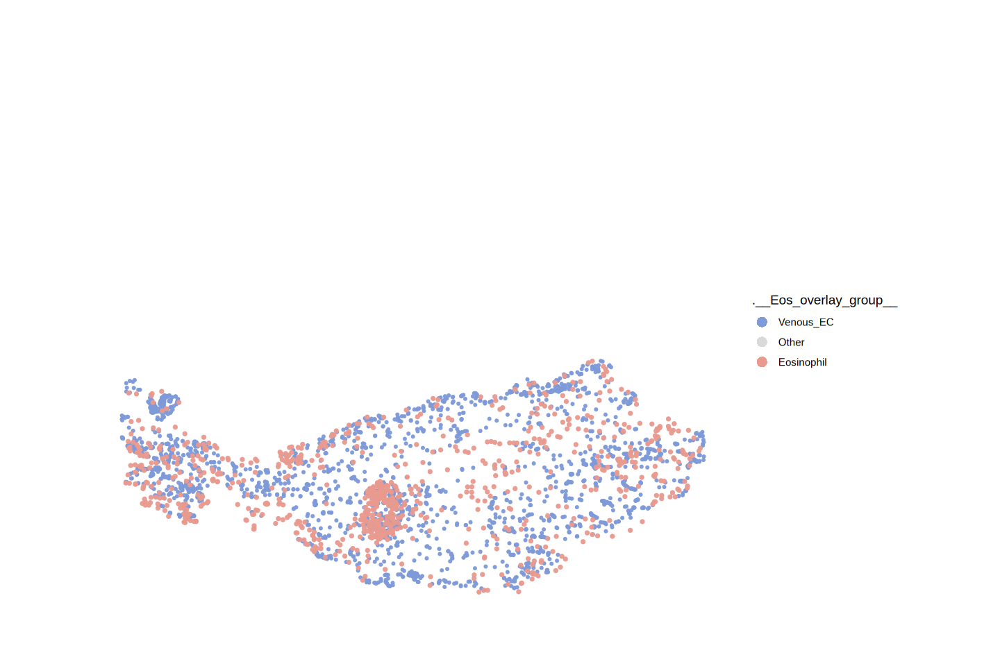

In [175]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Venous_EC",
    flip_xy = TRUE
)

Warning message:
“Removed 89664 rows containing missing values or values outside the scale range
(`geom_point()`).”


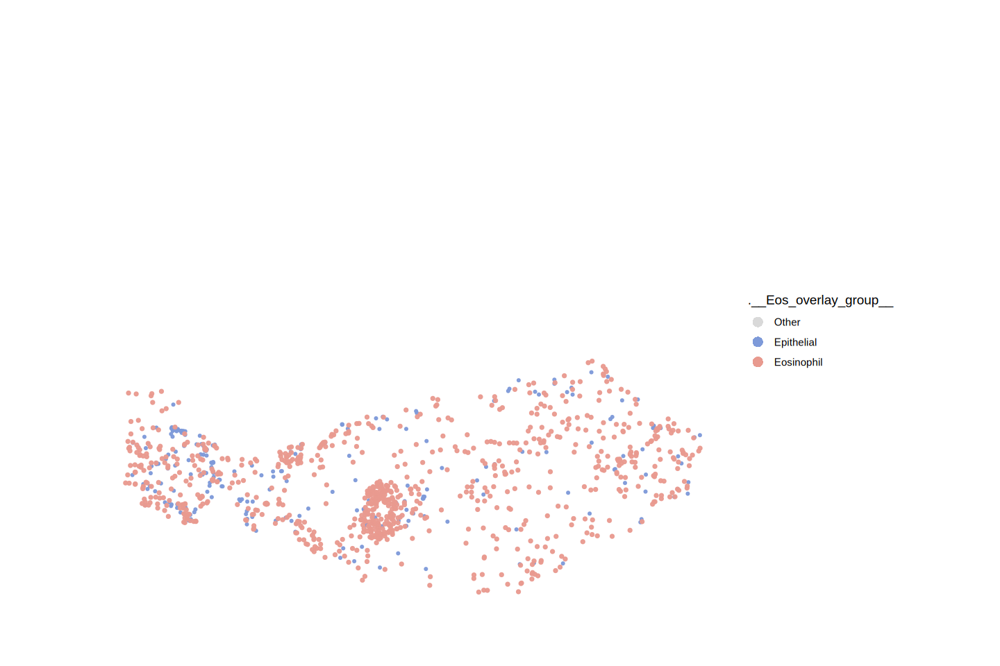

In [176]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Epithelial",
    flip_xy = TRUE
)

## Step8 - Define Eos subtype

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [177]:
table(region_spatial$EosRef_call)


OUTSIDE_IMMUNE   REF_EOS_REST  REF_EOS_TIER1  REF_EOS_TIER2  REF_EOS_TIER3 
         48155          35574            240            506           2102 
 REF_EOS_TIER4 
          3087 

In [178]:
eos_cells <- rownames(region_spatial@meta.data)[
  region_spatial$Final_CellType_subtype_refined == "Eosinophil"
]

length(eos_cells)

[1] 864

In [179]:
eos_obj <- subset(
  region_spatial,
  cells = eos_cells
)

DefaultAssay(eos_obj) <- "Xenium"

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [180]:
EOS_GENE_SET_PATH <- file.path(
  PIPELINE_REPO,
  "config",
  "eos_gene_sets.tsv"
)

eos_gene_sets <- read.delim(
  EOS_GENE_SET_PATH,
  stringsAsFactors = FALSE
)

In [181]:
short_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "short_lived"
]

long_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "long_lived"
]

length(short_genes)
# 47

length(long_genes)
# 46

[1] 47

[1] 46

In [182]:
short_use <- intersect(
  short_genes,
  rownames(eos_obj)
)

long_use <- intersect(
  long_genes,
  rownames(eos_obj)
)

cat(
  "Short-lived:",
  length(short_use),
  "/",
  length(short_genes),
  "\n"
)

cat(
  "Long-lived:",
  length(long_use),
  "/",
  length(long_genes),
  "\n"
)

Short-lived: 47 / 47 
Long-lived: 46 / 46 


In [183]:
short_use

[1] "Itgal"   "Nfkbia"  "Dusp5"   "Pim1"    "Fau"     "Birc3"   "Rps27a" 
 [8] "Ncf1"    "Rps3a1"  "Rpl18a"  "Mxd1"    "Tgm2"    "Thbs1"   "Rpl35a" 
[15] "Ypel3"   "Rps16"   "Coro1a"  "Stk19"   "Cyba"    "Cxcl2"   "Cd9"    
[22] "Taldo1"  "Vasp"    "Rpl37a"  "Rpl17"   "Slc16a3" "Rps15"   "Srgn"   
[29] "Rps13"   "Rps23"   "Rps12"   "Cdk2ap2" "Sirpa"   "Dazap2"  "Ccl6"   
[36] "Rpl5"    "Nr4a1"   "Rps29"   "Gsr"     "Rpl32"   "Rps5"    "Rps8"   
[43] "Rps26"   "Lcp1"    "Ptafr"   "Cebpb"   "Kdm6b"

In [184]:
long_use

[1] "Lmna"     "Fgfr1"    "Cd300a"   "Cd44"     "Cd24a"    "Ptprc"   
 [7] "Klf2"     "Rgs1"     "Camk1d"   "Fer"      "F5"       "Csf2rb"  
[13] "Kctd12"   "Cytip"    "Cd80"     "Mctp1"    "Cdkn1a"   "Coro2a"  
[19] "Adam8"    "Slc2a3"   "Il1rl1"   "Elmo1"    "Mbnl1"    "Lyn"     
[25] "Trerf1"   "Adgre1"   "Plek"     "Atp2b1"   "Dnaja1"   "Basp1"   
[31] "Srpk2"    "Prrc2c"   "Slk"      "Rab8b"    "Rbm39"    "Arhgap18"
[37] "Tsc22d3"  "Rbms1"    "Hsp90aa1" "Rsrp1"    "Cd47"     "Srsf2"   
[43] "Dock8"    "Calm1"    "S1pr1"    "Cd84"

In [185]:
short_ribosomal <- grep(
  "^Rp[ls]",
  short_use,
  value = TRUE
)

short_nonrib <- setdiff(
  short_use,
  short_ribosomal
)

cat(
  "Short full:", length(short_use), "\n",
  "Short ribosomal:", length(short_ribosomal), "\n",
  "Short non-ribosomal:", length(short_nonrib), "\n"
)

Short full: 47 
 Short ribosomal: 17 
 Short non-ribosomal: 30 


In [186]:
state_genes <- unique(
  c(
    short_use,
    long_use
  )
)

eos_obj <- ScaleData(
  eos_obj,
  features = state_genes,
  assay = "Xenium",
  verbose = FALSE
)

Warning message:
“Different features in new layer data than already exists for scale.data”


In [187]:
state_scaled <- GetAssayData(
  eos_obj,
  assay = "Xenium",
  layer = "scale.data"
)

state_scaled <- state_scaled[
  state_genes,
  ,
  drop = FALSE
]

In [188]:
short_score_full <- colMeans(
  state_scaled[
    short_use,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

short_score_nonrib <- colMeans(
  state_scaled[
    short_nonrib,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

long_score <- colMeans(
  state_scaled[
    long_use,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

In [189]:
eos_obj$EosShort_score_full <-
  short_score_full[colnames(eos_obj)]

eos_obj$EosShort_score_nonrib <-
  short_score_nonrib[colnames(eos_obj)]

eos_obj$EosLong_score <-
  long_score[colnames(eos_obj)]

In [190]:
eos_obj$EosState_score <-
  eos_obj$EosLong_score -
  eos_obj$EosShort_score_nonrib

In [191]:
eos_obj$EosState_score_full <-
  eos_obj$EosLong_score -
  eos_obj$EosShort_score_full

In [192]:
options(repr.plot.width=7, repr.plot.height=4)

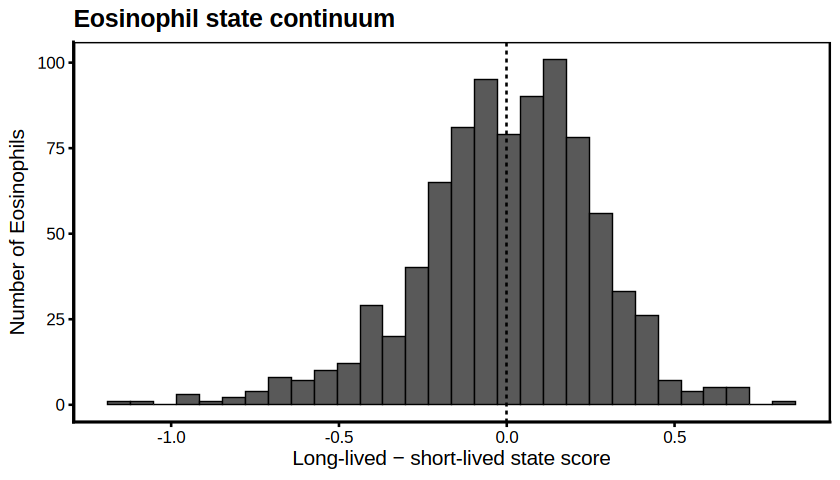

In [193]:
library(ggplot2)

ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_score
  )
) +
  geom_histogram(
    bins = 30,
    colour = "black",
    linewidth = 0.3
  ) +
  geom_vline(
    xintercept = 0,
    linetype = 2
  ) +
  labs(
    x = "Long-lived − short-lived state score",
    y = "Number of Eosinophils",
    title = "Eosinophil state continuum"
  ) +
  theme_cell()

In [194]:
options(repr.plot.width=6, repr.plot.height=6)

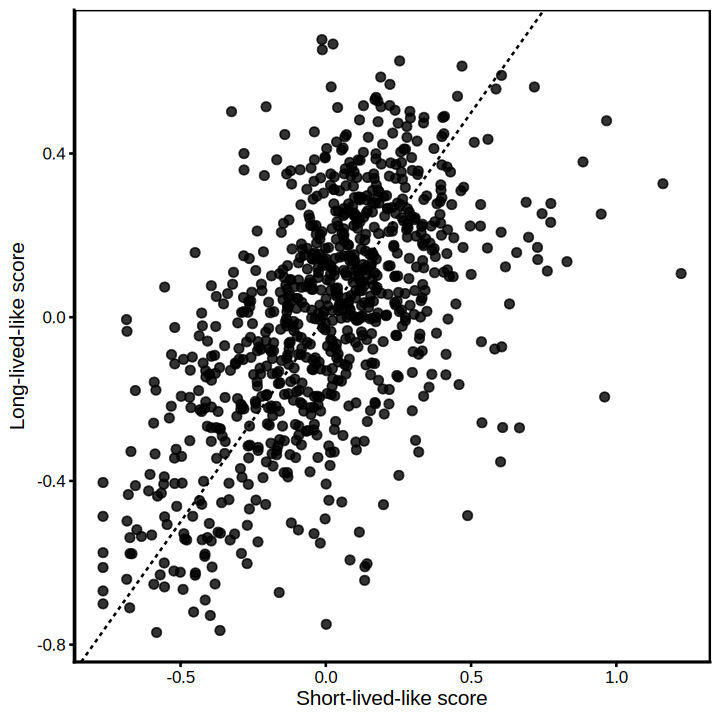

In [195]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_score_nonrib,
    y = EosLong_score
  )
) +
  geom_point(
    size = 2,
    alpha = 0.8
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  labs(
    x = "Short-lived-like score",
    y = "Long-lived-like score"
  ) +
  theme_cell()

In [196]:
state_counts <- FetchData(
  eos_obj,
  vars = state_genes,
  layer = "counts"
)

In [197]:
eos_obj$EosShort_n_detected <-
  rowSums(
    state_counts[, short_nonrib, drop = FALSE] > 0
  )

eos_obj$EosLong_n_detected <-
  rowSums(
    state_counts[, long_use, drop = FALSE] > 0
  )

eos_obj$EosShort_fraction_detected <-
  eos_obj$EosShort_n_detected /
  length(short_nonrib)

eos_obj$EosLong_fraction_detected <-
  eos_obj$EosLong_n_detected /
  length(long_use)

In [198]:
cor(
  eos_obj$EosState_score,
  eos_obj$nCount_Xenium,
  method = "spearman"
)

cor(
  eos_obj$EosState_score,
  eos_obj$nFeature_Xenium,
  method = "spearman"
)

[1] 0.1631667

[1] 0.2341087

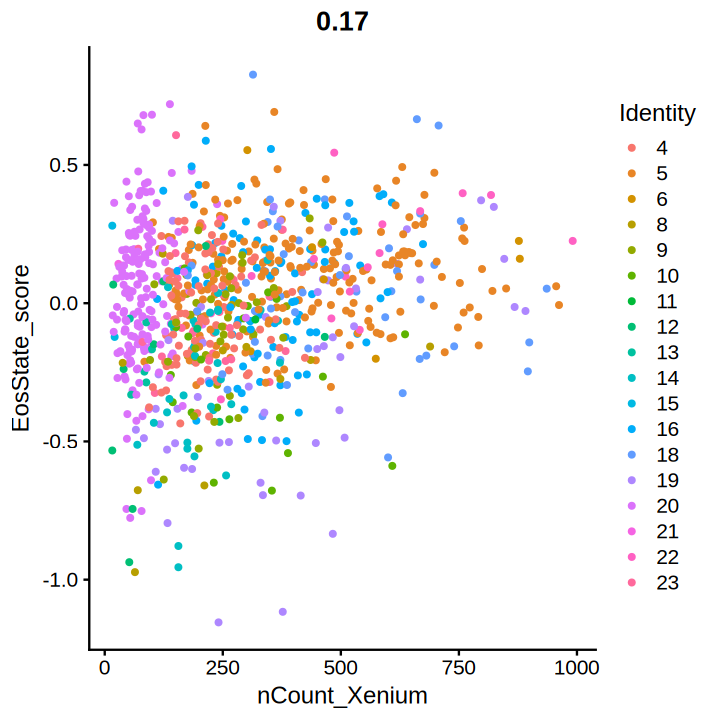

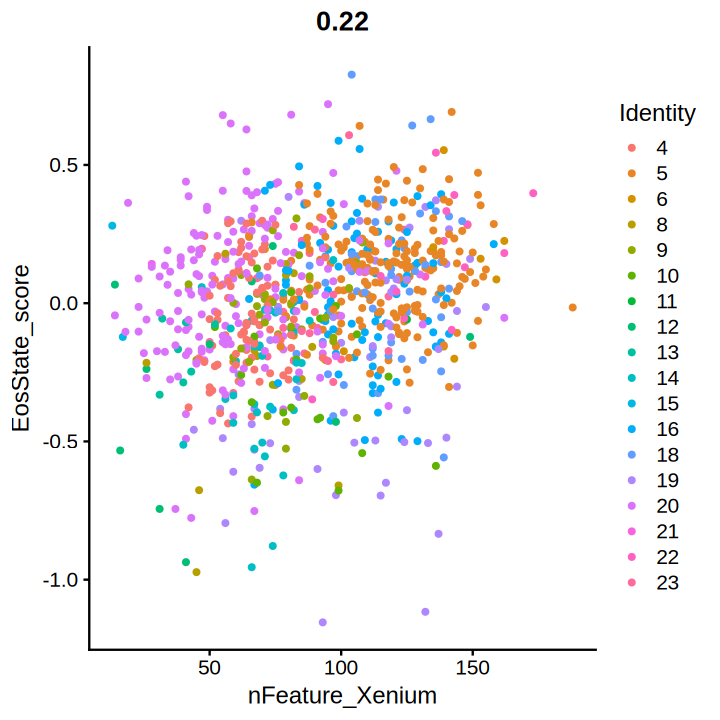

In [199]:
FeatureScatter(
  eos_obj,
  feature1 = "nCount_Xenium",
  feature2 = "EosState_score"
)

FeatureScatter(
  eos_obj,
  feature1 = "nFeature_Xenium",
  feature2 = "EosState_score"
)

In [200]:
cor(
  eos_obj$EosState_score,
  eos_obj$EosState_score_full,
  method = "spearman"
)

[1] 0.7618583

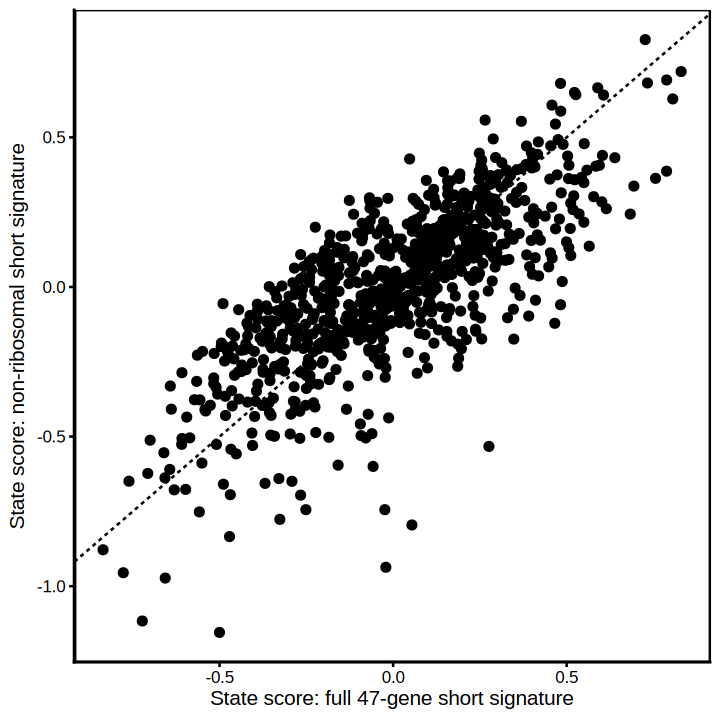

In [201]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_score_full,
    y = EosState_score
  )
) +
  geom_point(
    size = 2
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  labs(
    x = "State score: full 47-gene short signature",
    y = "State score: non-ribosomal short signature"
  ) +
  theme_cell()

In [202]:
eos_md <- eos_obj@meta.data

eos_obj$EosShort_z <- as.numeric(
  scale(eos_md$EosShort_score_nonrib)
)

eos_obj$EosLong_z <- as.numeric(
  scale(eos_md$EosLong_score)
)

In [203]:
# Relative short ↔ long state
eos_obj$EosState_balance <- (
  eos_obj$EosLong_z -
  eos_obj$EosShort_z
) / sqrt(2)

# Overall activation of the two Eos-state programs
eos_obj$EosState_activity <- (
  eos_obj$EosLong_z +
  eos_obj$EosShort_z
) / sqrt(2)

In [204]:
cor.test(
  eos_obj$EosShort_score_nonrib,
  eos_obj$EosLong_score,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosShort_score_nonrib, eos_obj$EosLong_score, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosShort_score_nonrib and eos_obj$EosLong_score
S = 45449186, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.5771983 


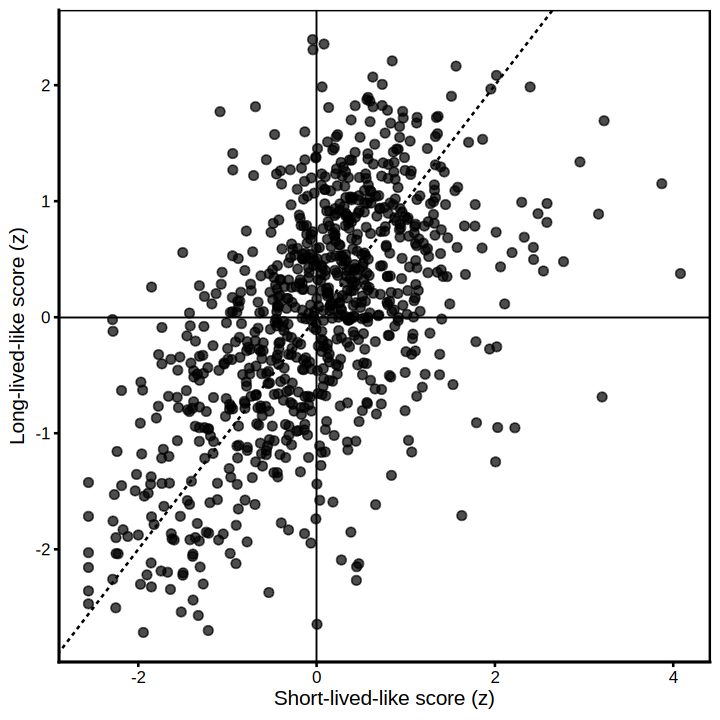

In [205]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_z,
    y = EosLong_z
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  geom_hline(
    yintercept = 0,
    linewidth = 0.4
  ) +
  geom_vline(
    xintercept = 0,
    linewidth = 0.4
  ) +
  labs(
    x = "Short-lived-like score (z)",
    y = "Long-lived-like score (z)"
  ) +
  theme_cell()

In [206]:
if (!requireNamespace("diptest", quietly = TRUE)) {
  install.packages("diptest")
}

diptest::dip.test(
  eos_obj$EosState_balance
)


	Hartigans' dip test for unimodality / multimodality

data:  eos_obj$EosState_balance
D = 0.0074739, p-value = 0.9929
alternative hypothesis: non-unimodal, i.e., at least bimodal


Package 'mclust' version 6.1.3
Type 'citation("mclust")' for citing this R package in publications.


Attaching package: ‘mclust’


The following object is masked from ‘package:dplyr’:

    count




---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust E (univariate, equal variance) model with 2 components: 

 log-likelihood   n df       BIC       ICL
      -833.8216 864  4 -1694.689 -1757.184

Clustering table:
  1   2 
 34 830 

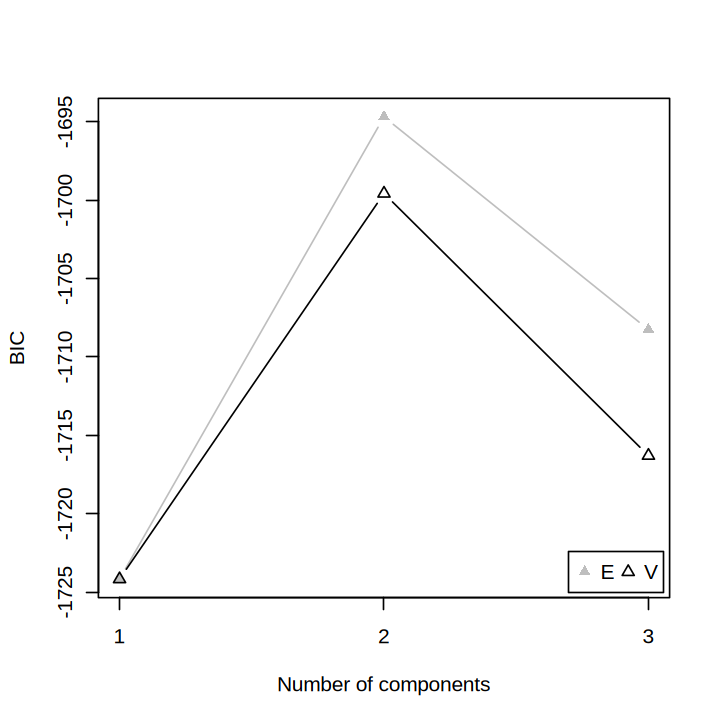

In [207]:
library(mclust)

mclust_fit <- Mclust(
  eos_obj$EosState_balance,
  G = 1:3
)

summary(mclust_fit)

plot(
  mclust_fit,
  what = "BIC"
)

In [208]:
eos_obj$EosState_n_detected <-
  eos_obj$EosShort_n_detected +
  eos_obj$EosLong_n_detected

`geom_smooth()` using formula = 'y ~ x'


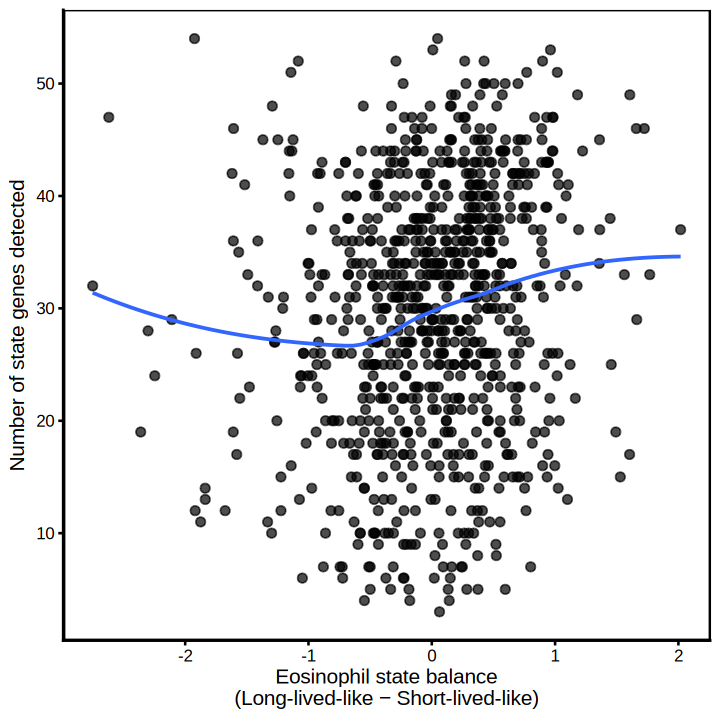

In [209]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_balance,
    y = EosState_n_detected
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_smooth(
    method = "loess",
    se = FALSE,
    linewidth = 0.8
  ) +
  labs(
    x = "Eosinophil state balance\n(Long-lived-like − Short-lived-like)",
    y = "Number of state genes detected"
  ) +
  theme_cell()

In [210]:
cor.test(
  eos_obj$EosState_balance,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$EosState_n_detected
S = 87662408, p-value = 4.701e-08
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1844999 


`geom_smooth()` using formula = 'y ~ x'


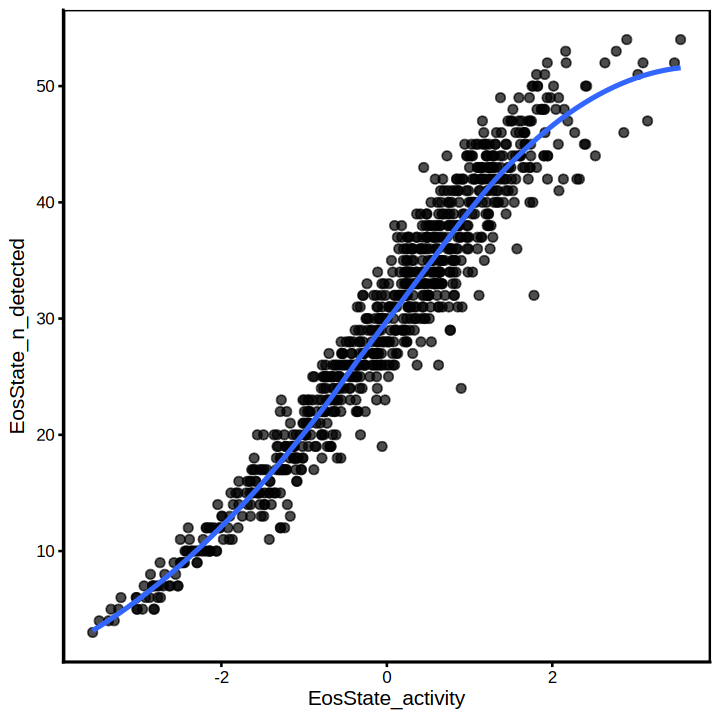

In [211]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_activity,
    y = EosState_n_detected
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_smooth(
    method = "loess",
    se = FALSE
  ) +
  theme_cell()

In [212]:
summary(
  eos_obj$EosState_n_detected
)

quantile(
  eos_obj$EosState_n_detected,
  probs = c(
    0.05,
    0.10,
    0.25,
    0.50,
    0.75,
    0.90,
    0.95
  )
)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   22.00   31.00   29.81   38.00   54.00 

5%   10%   25%   50%   75%   90%   95% 
10.00 14.00 22.00 31.00 38.00 44.00 46.85

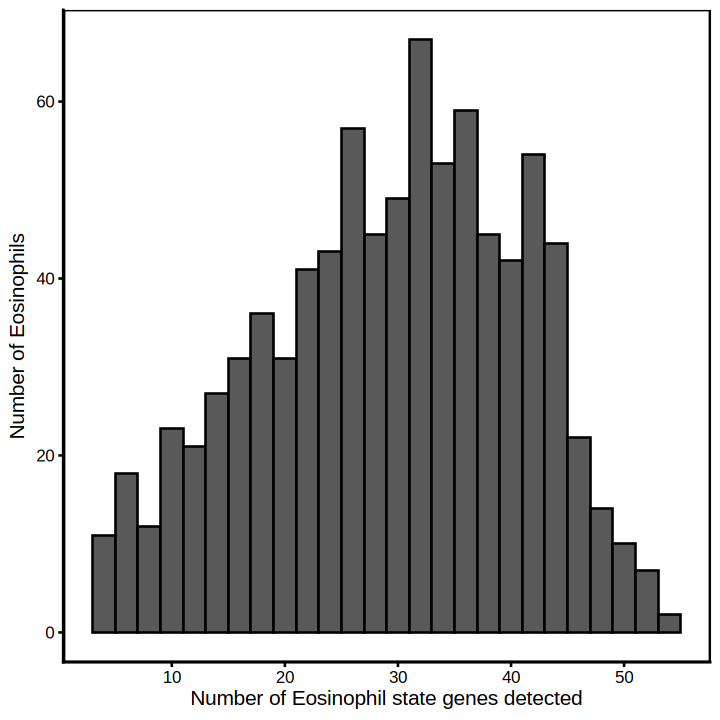

In [213]:
ggplot(
  eos_obj@meta.data,
  aes(x = EosState_n_detected)
) +
  geom_histogram(
    binwidth = 2,
    colour = "black"
  ) +
  labs(
    x = "Number of Eosinophil state genes detected",
    y = "Number of Eosinophils"
  ) +
  theme_cell()

In [214]:
# State balance vs signature detection
cor.test(
  eos_obj$EosState_balance,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

# Activity vs signature detection
cor.test(
  eos_obj$EosState_activity,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

# Balance vs total Xenium complexity
cor.test(
  eos_obj$EosState_balance,
  eos_obj$nFeature_Xenium,
  method = "spearman"
)

cor.test(
  eos_obj$EosState_balance,
  eos_obj$nCount_Xenium,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$EosState_n_detected
S = 87662408, p-value = 4.701e-08
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1844999 


Warning message in cor.test.default(eos_obj$EosState_activity, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_activity and eos_obj$EosState_n_detected
S = 4055860, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.9622694 


Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$nFeature_Xenium, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$nFeature_Xenium
S = 77744288, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.2767656 


Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$nCount_Xenium, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$nCount_Xenium
S = 84985867, p-value = 5.127e-10
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.2093991 


In [215]:
fit_detection <- loess(
  EosState_balance ~ EosState_n_detected,
  data = eos_obj@meta.data
)

eos_obj$EosState_balance_residual <-
  residuals(fit_detection)

In [216]:
cor(
  eos_obj$EosState_balance,
  eos_obj$EosState_balance_residual,
  method = "spearman",
  use = "complete.obs"
)

[1] 0.9797171

In [217]:
q <- 0.10

q_low <- quantile(
  eos_obj$EosState_balance,
  q,
  na.rm = TRUE
)

q_high <- quantile(
  eos_obj$EosState_balance,
  1 - q,
  na.rm = TRUE
)

eos_obj$EosState_extreme <- dplyr::case_when(

  # Long program must itself be above average
  eos_obj$EosState_balance >= q_high &
    eos_obj$EosLong_z > 0 ~
    "Long-lived-like",

  # Short program must itself be above average
  eos_obj$EosState_balance <= q_low &
    eos_obj$EosShort_z > 0 ~
    "Short-lived-like",

  TRUE ~
    "Intermediate"
)

In [218]:
eos_obj$EosState_extreme <- factor(
  eos_obj$EosState_extreme,
  levels = c(
    "Short-lived-like",
    "Intermediate",
    "Long-lived-like"
  )
)

table(eos_obj$EosState_extreme)


Short-lived-like     Intermediate  Long-lived-like 
              76              719               69 

In [219]:
options(repr.plot.width=8, repr.plot.height=6)

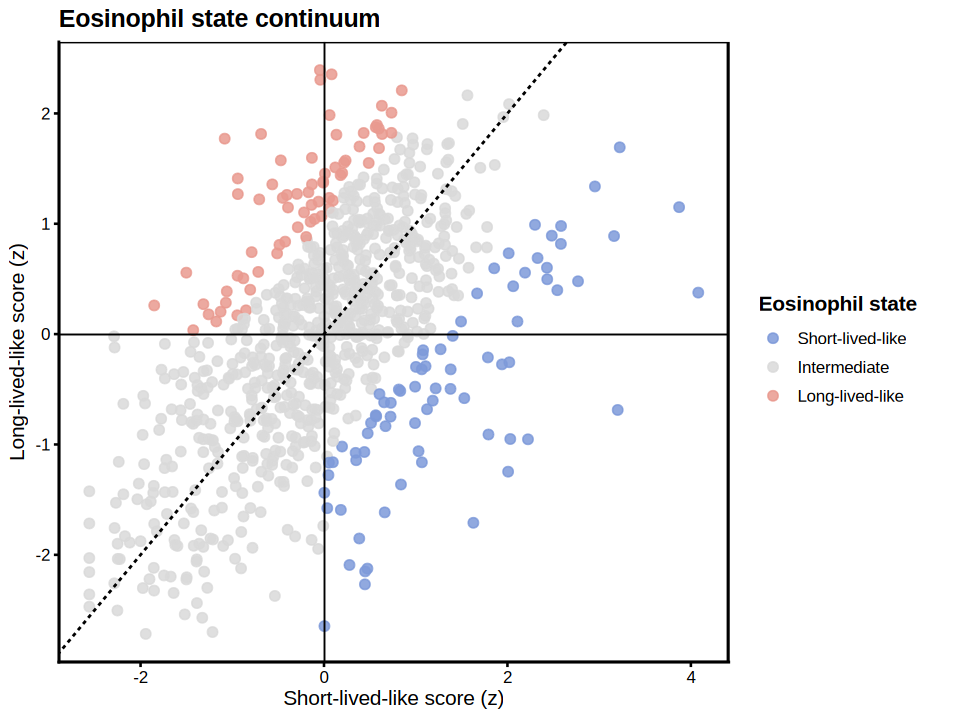

In [220]:
state_cols <- c(
  "Short-lived-like" = "#7E9AD9",
  "Intermediate"     = "#D9D9D9",
  "Long-lived-like"  = "#E89A8F"
)

ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_z,
    y = EosLong_z,
    colour = EosState_extreme
  )
) +
  geom_point(
    size = 2.2,
    alpha = 0.85
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.6
  ) +
  geom_hline(
    yintercept = 0,
    linewidth = 0.4
  ) +
  geom_vline(
    xintercept = 0,
    linewidth = 0.4
  ) +
  scale_colour_manual(
    values = state_cols,
    drop = FALSE
  ) +
  labs(
    title = "Eosinophil state continuum",
    x = "Short-lived-like score (z)",
    y = "Long-lived-like score (z)",
    colour = "Eosinophil state"
  ) +
  theme_cell()

In [229]:
options(repr.plot.width=6, repr.plot.height=6)

Short-lived genes available: 47 / 47

Short-lived genes used: 30

Long-lived genes available: 46 / 46

Total heatmap genes: 76

Cells shown in heatmap: 864



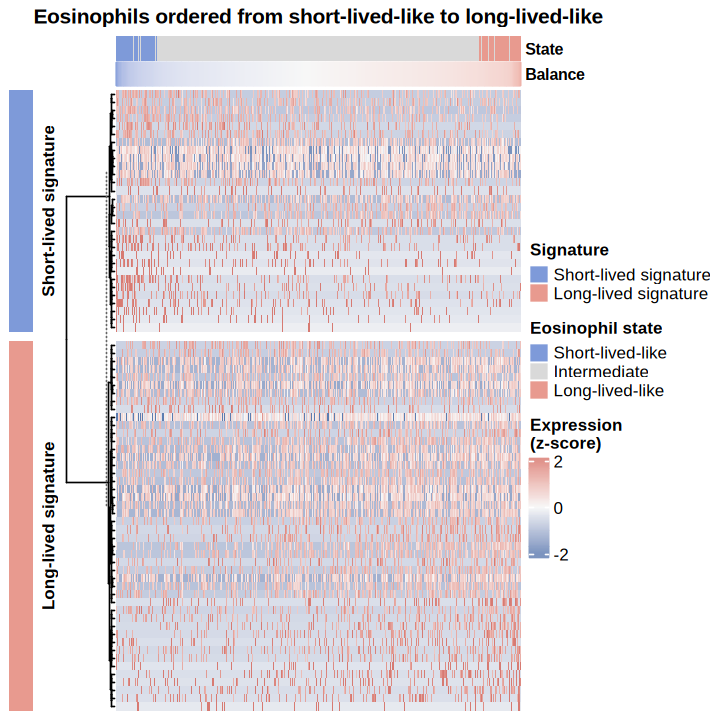

In [230]:
plot_eos_state_heatmap(
  eos_obj = eos_obj,
  eos_gene_sets = eos_gene_sets
)

In [228]:
# plot_eos_state_heatmap(
#   eos_obj = eos_obj,
#   eos_gene_sets = eos_gene_sets,
#   remove_short_ribosomal = FALSE
# )

In [231]:
# ============================================================
# 1. Eos state variables to map back
# ============================================================

state_vars <- c(
  "EosShort_score_nonrib",
  "EosLong_score",
  "EosShort_z",
  "EosLong_z",
  "EosState_balance",
  "EosState_activity",
  "EosState_n_detected",
  "EosState_extreme"
)

state_vars <- intersect(
  state_vars,
  colnames(eos_obj@meta.data)
)

state_vars

[1] "EosShort_score_nonrib" "EosLong_score"         "EosShort_z"           
[4] "EosLong_z"             "EosState_balance"      "EosState_activity"    
[7] "EosState_n_detected"   "EosState_extreme"

In [232]:
# ============================================================
# 2. Map Eos-state metadata back to full region_spatial
# ============================================================

eos_md <- eos_obj@meta.data

for (v in state_vars) {

  region_spatial@meta.data[[v]] <- eos_md[
    match(
      rownames(region_spatial@meta.data),
      rownames(eos_md)
    ),
    v
  ]
}

In [233]:
region_spatial$EosState_spatial <- dplyr::case_when(

  region_spatial$EosState_extreme == "Short-lived-like" ~
    "Short-lived-like",

  region_spatial$EosState_extreme == "Long-lived-like" ~
    "Long-lived-like",

  region_spatial$EosState_extreme == "Intermediate" ~
    "Intermediate",

  TRUE ~
    "Other"
)

region_spatial$EosState_spatial <- factor(
  region_spatial$EosState_spatial,
  levels = c(
    "Other",
    "Intermediate",
    "Short-lived-like",
    "Long-lived-like"
  )
)

In [234]:
dim(region_spatial@meta.data)

[1] 89664   267

In [235]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [236]:
saveRDS(eos_obj, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_eos.rds")))

In [240]:
options(repr.plot.width=16, repr.plot.height=8)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


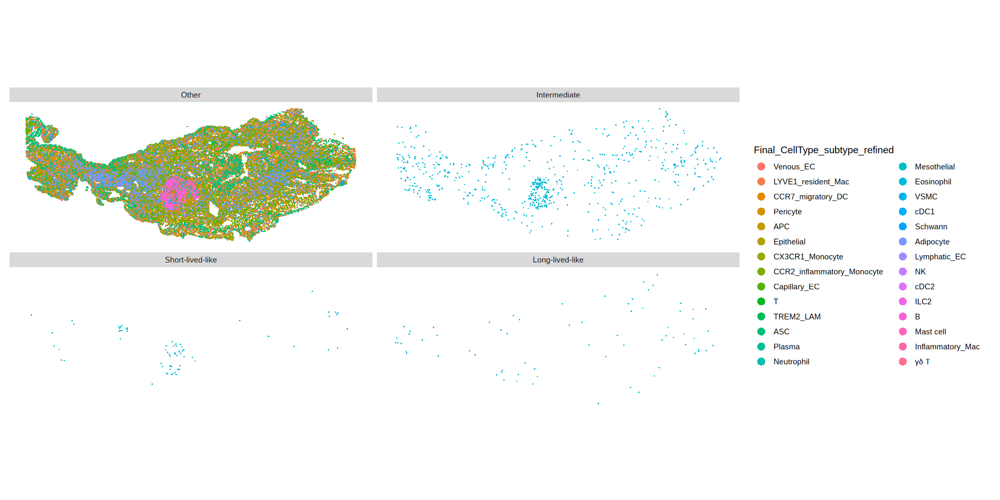

In [241]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "EosState_spatial",
  group.by = "Final_CellType_subtype_refined",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [242]:
coords <- GetTissueCoordinates(
  region_spatial[["fov"]],
  which = "centroids"
) %>%
  as.data.frame()

if (!"cell" %in% colnames(coords)) {
  coords$cell <- rownames(coords)
}

In [243]:
md <- region_spatial@meta.data

coords$EosState_balance <- md$EosState_balance[
  match(
    coords$cell,
    rownames(md)
  )
]

coords$EosState_extreme <- as.character(
  md$EosState_extreme[
    match(
      coords$cell,
      rownames(md)
    )
  ]
)

In [244]:
eos_coords <- coords %>%
  dplyr::filter(
    !is.na(EosState_balance)
  )

In [245]:
options(repr.plot.width=10, repr.plot.height=6)

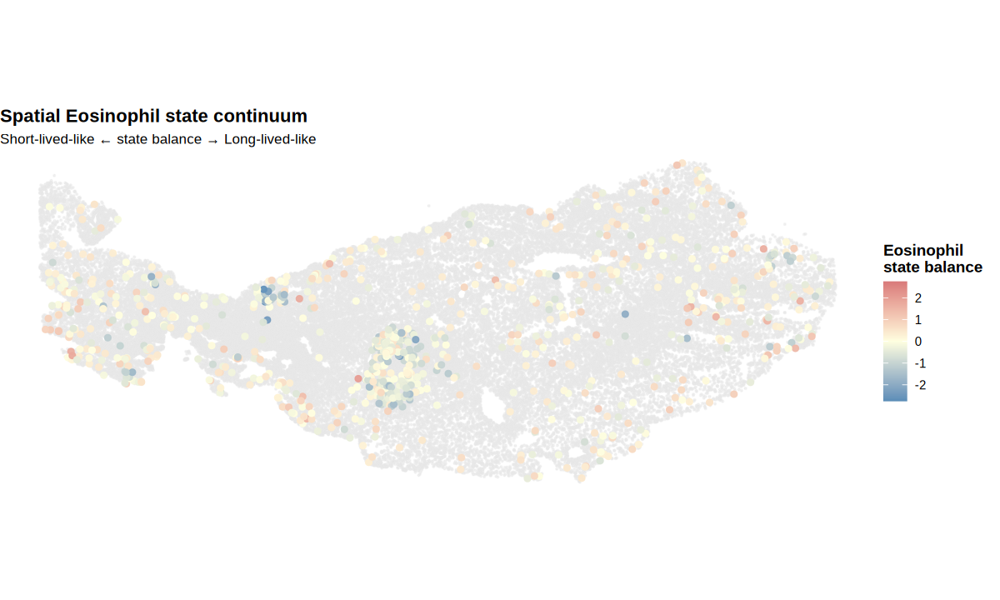

In [246]:
library(ggplot2)

balance_lim <- max(
  abs(eos_coords$EosState_balance),
  na.rm = TRUE
)

ggplot() +

  # ----------------------------------------------------------
  # All cells in grey
  # ----------------------------------------------------------
  geom_point(
    data = coords,
    aes(
      x = x,
      y = y
    ),
    colour = "#E8E8E8",
    size = 0.10,
    alpha = 0.5
  ) +

  # ----------------------------------------------------------
  # Eos colored by continuous balance
  # ----------------------------------------------------------
  geom_point(
    data = eos_coords,
    aes(
      x = x,
      y = y,
      colour = EosState_balance
    ),
    size = 1.5,
    alpha = 0.95
  ) +

  scale_colour_gradient2(
    low  = "#5B8DB8",
    mid  = "lightyellow",
    high = "#D97A7A",
    midpoint = 0,
    limits = c(
      -balance_lim,
      balance_lim
    ),
    name = "Eosinophil\nstate balance"
  ) +

  coord_fixed() +

  labs(
    title = "Spatial Eosinophil state continuum",
    subtitle = "Short-lived-like ← state balance → Long-lived-like",
    x = NULL,
    y = NULL
  ) +

  theme_void() +

  theme(
    plot.title = element_text(
      face = "bold",
      size = 13
    ),
    plot.subtitle = element_text(
      size = 10
    ),
    legend.title = element_text(
      face = "bold"
    )
  )

In [247]:
polarized_coords <- eos_coords %>%
  dplyr::filter(
    EosState_extreme %in%
      c(
        "Short-lived-like",
        "Long-lived-like"
      )
  )

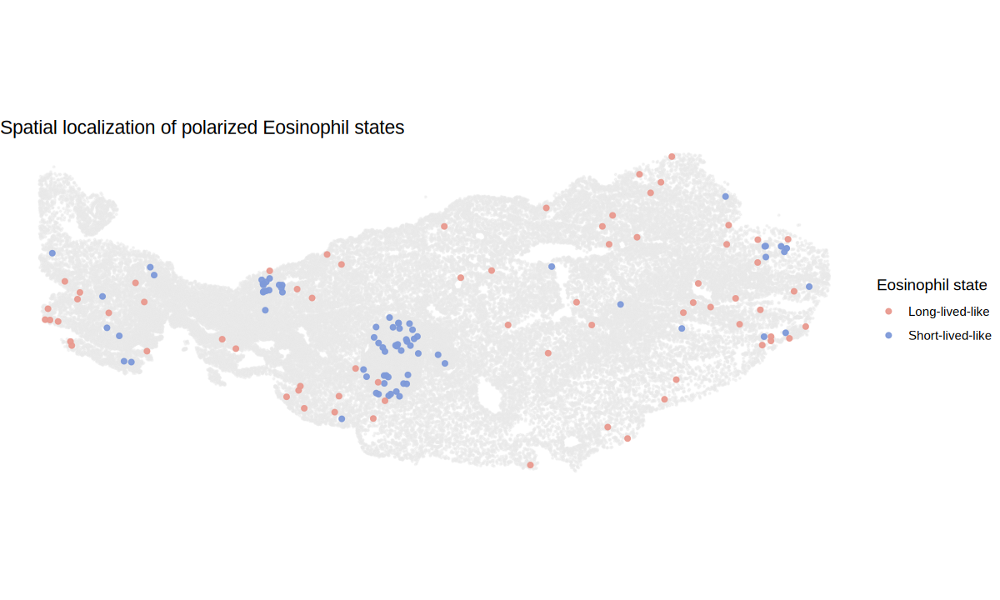

In [248]:
ggplot() +

  geom_point(
    data = coords,
    aes(x = x, y = y),
    colour = "#E8E8E8",
    size = 0.10,
    alpha = 0.45
  ) +

  geom_point(
    data = polarized_coords,
    aes(
      x = x,
      y = y,
      colour = EosState_extreme
    ),
    size = 1.2,
    alpha = 0.95
  ) +

  scale_colour_manual(
    values = c(
      "Short-lived-like" = "#7E9AD9",
      "Long-lived-like"  = "#E89A8F"
    )
  ) +

  coord_fixed() +

  labs(
    title = "Spatial localization of polarized Eosinophil states",
    colour = "Eosinophil state"
  ) +

  theme_void()

## Step9 - Eos Subtype DE Analysis

In [249]:
eos_obj = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_eos.rds")))

In [250]:
eos_obj

An object of class Seurat 
479 features across 864 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap_PC30
 1 spatial field of view present: fov

In [251]:
table(
  eos_obj$EosState_extreme,
  useNA = "ifany"
)

eos_de <- subset(
  eos_obj,
  subset = EosState_extreme %in%
    c(
      "Short-lived-like",
      "Long-lived-like"
    )
)

table(eos_de$EosState_extreme)


Short-lived-like     Intermediate  Long-lived-like 
              76              719               69 

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”



Short-lived-like     Intermediate  Long-lived-like 
              76                0               69 

In [252]:
Idents(eos_de) <- "EosState_extreme"

table(Idents(eos_de))


Short-lived-like  Long-lived-like 
              76               69 

In [253]:
genes_380_use <- intersect(
  identity_panel_genes,
  rownames(eos_de)
)

length(genes_380_use)

[1] 386

In [254]:
state_genes_93 <- unique(
  eos_gene_sets$gene
)

genes_de_primary <- setdiff(
  genes_380_use,
  state_genes_93
)

length(genes_de_primary)

[1] 379

In [255]:
DefaultAssay(eos_de) <- "Xenium"

eos_long_vs_short <- FindMarkers(
  eos_de,
  ident.1 = "Long-lived-like",
  ident.2 = "Short-lived-like",
  features = genes_de_primary,
  assay = "Xenium",
  slot = "data",
  test.use = "wilcox",
  logfc.threshold = 0,
  min.pct = 0,
  only.pos = FALSE
)

In [256]:
eos_long_vs_short <- eos_long_vs_short %>%
  tibble::rownames_to_column("Gene")

In [257]:
counts_de <- FetchData(
  eos_de,
  vars = genes_de_primary,
  layer = "counts"
)

state <- as.character(
  eos_de$EosState_extreme
)

long_idx <- state == "Long-lived-like"
short_idx <- state == "Short-lived-like"

pct_long <- colMeans(
  counts_de[long_idx, , drop = FALSE] > 0
) * 100

pct_short <- colMeans(
  counts_de[short_idx, , drop = FALSE] > 0
) * 100

In [258]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::mutate(
    pct_Long = pct_long[Gene],
    pct_Short = pct_short[Gene],
    delta_pct = pct_Long - pct_Short
  )

In [259]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::arrange(
    p_val_adj,
    dplyr::desc(abs(avg_log2FC))
  )

head(eos_long_vs_short, 30)

,Gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,pct_Long,pct_Short,delta_pct
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Pf4,4.195271e-12,4.1481902,0.652,0.132,2.009535e-09,65.217391,13.157895,52.059497
2,Ms4a7,3.846361e-11,4.2172205,0.565,0.066,1.842407e-08,56.521739,6.578947,49.942792
3,Folr2,2.328481e-10,3.0337279,0.681,0.197,1.115343e-07,68.115942,19.736842,48.379100
4,F13a1,4.054017e-10,2.9303114,0.710,0.289,1.941874e-07,71.014493,28.947368,42.067124
5,Cd36,9.228021e-08,1.4020870,0.826,0.368,4.420222e-05,82.608696,36.842105,45.766590
6,Pmp22,2.291772e-07,2.7018060,0.406,0.039,1.097759e-04,40.579710,3.947368,36.632342
7,Cndp2,7.233834e-07,1.2629902,0.826,0.421,3.465007e-04,82.608696,42.105263,40.503432
8,Ms4a6c,6.266919e-06,1.1681773,0.768,0.395,3.001854e-03,76.811594,39.473684,37.337910
9,Nupr1,6.893037e-06,2.0048096,0.420,0.092,3.301765e-03,42.028986,9.210526,32.818459


In [260]:
eos_de_candidates <- eos_long_vs_short %>%
  dplyr::filter(
    abs(avg_log2FC) >= 0.25,
    pmax(pct_Long, pct_Short) >= 10
  ) %>%
  dplyr::arrange(
    p_val_adj,
    dplyr::desc(abs(avg_log2FC))
  )

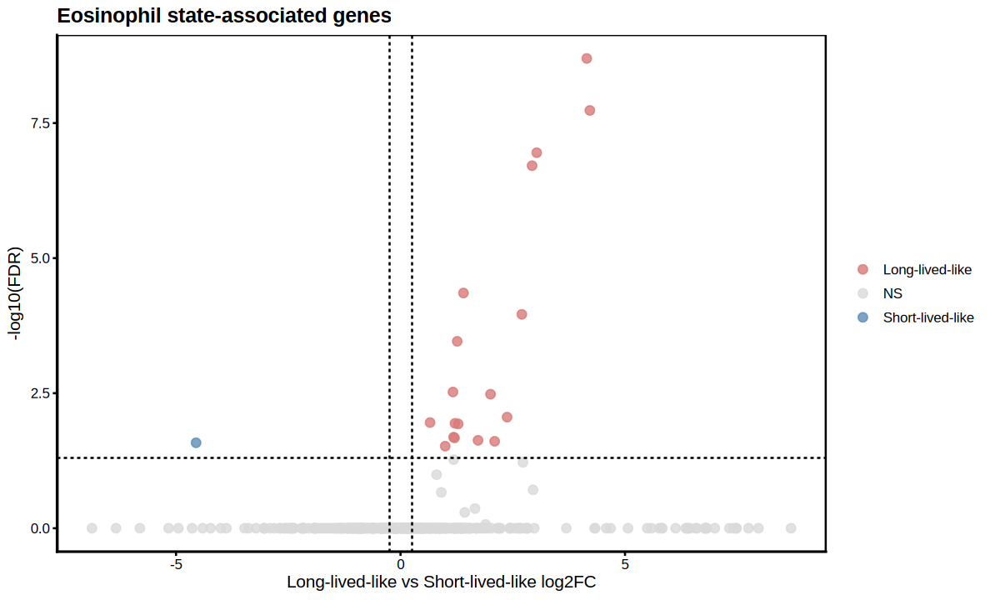

In [261]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::mutate(
    direction = dplyr::case_when(
      avg_log2FC >= 0.25 &
        p_val_adj < 0.05 ~ "Long-lived-like",

      avg_log2FC <= -0.25 &
        p_val_adj < 0.05 ~ "Short-lived-like",

      TRUE ~ "NS"
    )
  )

volcano_cols <- c(
  "Long-lived-like"  = "#D97A7A",
  "Short-lived-like" = "#5B8DB8",
  "NS"               = "#D9D9D9"
)

ggplot(
  eos_long_vs_short,
  aes(
    x = avg_log2FC,
    y = -log10(pmax(p_val_adj, 1e-300)),
    colour = direction
  )
) +
  geom_point(
    size = 2.5,
    alpha = 0.8
  ) +
  geom_vline(
    xintercept = c(-0.25, 0.25),
    linetype = 2
  ) +
  geom_hline(
    yintercept = -log10(0.05),
    linetype = 2
  ) +
  scale_colour_manual(
    values = volcano_cols
  ) +
  labs(
    x = "Long-lived-like vs Short-lived-like log2FC",
    y = "-log10(FDR)",
    colour = NULL,
    title = "Eosinophil state-associated genes"
  ) +
  theme_cell()

In [279]:
write.table(
  eos_long_vs_short,
  file = gzfile(
    file.path(
      ANCHOR_ROOT,
      "eos_long_vs_short.tsv.gz"
    )
  ),
  sep = "\t",
  quote = FALSE,
  row.names = FALSE
)

In [262]:
DEList1 = read.csv("/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/eos_Fat_new_markers_1204.csv")
DEList1 = DEList1[DEList1$cluster == 0,]
DEList2 = read.csv("/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/fats_DEG-limma DEG.csv")
# DEList2 = DEList2[DEList2$Grp == 0,]

In [263]:
print(dim(DEList1))

[1] 1396    7


In [264]:
print(dim(DEList2))

[1] 24816    13


In [265]:
head(DEList1, n=2)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,0.00000e+00,-3.7096954,0.216,0.796,0.000000e+00,0,Retnlg
2,2.38385e-116,-0.8431252,0.779,0.937,5.915761e-112,0,Nfkbia


In [266]:
head(DEList2, n=2)

,X,logFC,AveExpr,t,P.Value,adj.P.Val,B,Symbol,Grp,Exp.Mean.0,Exp.Per.0,Exp.Mean.1,Exp.Per.1
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,Retnla,1.1903136,1.610515,18.73977,1.083802e-75,2.988405e-72,158.2497,Retnla,0,1.969115,0.4756677,0.7788012,0.2381280
2,mt-Nd1,0.9997852,2.708106,21.54368,2.309937e-98,2.866170e-94,210.3352,mt-Nd1,0,3.009306,0.8462908,2.0095211,0.6386786


In [267]:
dim(eos_long_vs_short)

[1] 379  10

In [268]:
intersect(eos_long_vs_short$Gene, DEList1$gene)

[1] "Retnla"  "Ccl9"    "Emb"     "Laptm5"  "Pglyrp1" "Satb1"   "Rsad2"  
 [8] "Runx2"   "Mmp9"    "Rac2"    "Il1r2"   "C5ar1"   "Mgll"    "Tmem147"
[15] "Alox5ap" "Anxa2"   "Cybb"    "Prg2"

In [269]:
options(repr.plot.width=6, repr.plot.height=6)

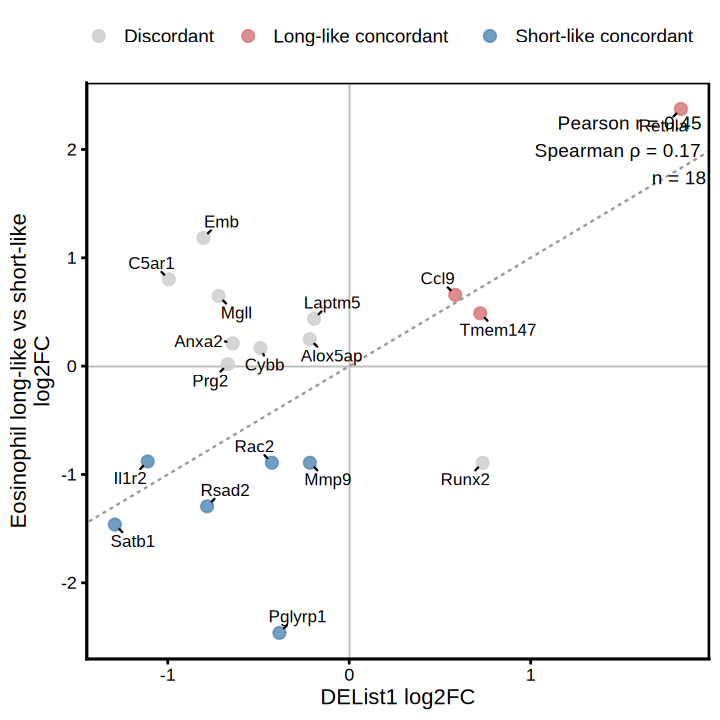

In [270]:
library(dplyr)
library(ggplot2)
library(ggrepel)


# ============================================================
# Prepare plotting dataframe
# ============================================================

scatter_df <- eos_long_vs_short %>%
  dplyr::select(
    Gene,
    Eos_log2FC = avg_log2FC
  ) %>%
  inner_join(
    DEList1 %>%
      dplyr::select(
        gene,
        DEList1_log2FC = avg_log2FC
      ),
    by = c("Gene" = "gene")
  ) %>%
  mutate(
    Concordance = case_when(

      Eos_log2FC > 0 &
        DEList1_log2FC > 0 ~
        "Long-like concordant",

      Eos_log2FC < 0 &
        DEList1_log2FC < 0 ~
        "Short-like concordant",

      TRUE ~
        "Discordant"
    ),

    label_score =
      abs(Eos_log2FC) +
      abs(DEList1_log2FC)
  )


# ============================================================
# Select genes to label
# ============================================================

label_df <- scatter_df %>%
  arrange(
    desc(label_score)
  ) %>%
  slice_head(
    n = 40
  )


# ============================================================
# Correlation
# ============================================================

r_p <- cor(
  scatter_df$Eos_log2FC,
  scatter_df$DEList1_log2FC,
  method = "pearson"
)

r_s <- cor(
  scatter_df$Eos_log2FC,
  scatter_df$DEList1_log2FC,
  method = "spearman"
)


# ============================================================
# Macaron colors
# ============================================================

scatter_cols <- c(

  "Long-like concordant" =
    "#D97A7A",

  "Short-like concordant" =
    "#5B8DB8",

  "Discordant" =
    "#CFCFCF"
)



# ============================================================
# Cell-style scatter
# ============================================================

p_logFC_scatter <- ggplot(
  scatter_df,
  aes(
    x = DEList1_log2FC,
    y = Eos_log2FC,
    colour = Concordance
  )
) +

  geom_hline(
    yintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_vline(
    xintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.5,
    colour = "#999999"
  ) +

  geom_point(
    size = 2.8,
    alpha = 0.85
  ) +

  geom_text_repel(
    data = label_df,

    aes(
      label = Gene
    ),

    size = 3.5,

    colour = "black",

    box.padding = 0.35,

    point.padding = 0.2,

    max.overlaps = Inf,

    min.segment.length = 0
  ) +

  scale_colour_manual(
    values = scatter_cols
  ) +

  annotate(
    "text",

    x = Inf,

    y = Inf,

    hjust = 1.05,

    vjust = 1.5,

    label = paste0(
      "Pearson r = ",
      round(r_p, 2),
      "\nSpearman ρ = ",
      round(r_s, 2),
      "\nn = ",
      nrow(scatter_df)
    ),

    size = 4
  ) +

  labs(

    x =
      "DEList1 log2FC",

    y =
      "Eosinophil long-like vs short-like\nlog2FC",

    colour = NULL

  ) +

  theme_cell(base_size = 13) +

  theme(

    legend.position = "top",

    legend.text = element_text(
      size = 11
    )

  )


p_logFC_scatter

In [271]:
library(dplyr)
library(ggplot2)
library(ggrepel)

# ============================================================
# 1. Prepare DEList2
# ============================================================

DEList2_use <- DEList2 %>%
  dplyr::mutate(
    gene_plot = dplyr::case_when(
      !is.na(Symbol) & Symbol != "" ~ as.character(Symbol),
      !is.na(X) & X != "" ~ as.character(X),
      TRUE ~ NA_character_
    )
  ) %>%
  dplyr::filter(
    !is.na(gene_plot)
  ) %>%
  dplyr::distinct(
    gene_plot,
    .keep_all = TRUE
  )


# ============================================================
# 2. Merge with eos_long_vs_short
# ============================================================

scatter_df2 <- eos_long_vs_short %>%
  dplyr::select(
    Gene,
    Eos_log2FC = avg_log2FC
  ) %>%
  dplyr::inner_join(
    DEList2_use %>%
      dplyr::select(
        gene_plot,
        DEList2_log2FC = logFC
      ),
    by = c("Gene" = "gene_plot")
  )

nrow(scatter_df2)
head(scatter_df2)

[1] 337

,Gene,Eos_log2FC,DEList2_log2FC
,<chr>,<dbl>,<dbl>
1,Pf4,4.148190,-0.011060085
2,Ms4a7,4.217221,0.001806827
3,Folr2,3.033728,0.003138138
4,F13a1,2.930311,0.004607317
5,Cd36,1.402087,0.049578174
6,Pmp22,2.701806,-0.001765857


In [272]:
scatter_df2 <- scatter_df2 %>%
  dplyr::mutate(
    Concordance = dplyr::case_when(

      Eos_log2FC > 0 &
        DEList2_log2FC > 0 ~
        "Long-like concordant",

      Eos_log2FC < 0 &
        DEList2_log2FC < 0 ~
        "Short-like concordant",

      TRUE ~
        "Discordant"
    ),

    label_score =
      abs(Eos_log2FC) +
      abs(DEList2_log2FC)
  )

In [273]:
scatter_df2$DEList2_log2FC_cap <- pmax(
  pmin(
    scatter_df2$DEList2_log2FC,
    0.01
  ),
  -0.01
)

In [274]:
label_df2 <- scatter_df2 %>%
  dplyr::filter(
    Concordance != "Discordant"
  ) %>%
  dplyr::arrange(
    dplyr::desc(label_score)
  ) %>%
  dplyr::slice_head(
    n = 40
  )

In [275]:
r_p2 <- cor(
  scatter_df2$Eos_log2FC,
  scatter_df2$DEList2_log2FC,
  method = "pearson",
  use = "complete.obs"
)

r_s2 <- cor(
  scatter_df2$Eos_log2FC,
  scatter_df2$DEList2_log2FC,
  method = "spearman",
  use = "complete.obs"
)

In [276]:
options(repr.plot.width=8, repr.plot.height=8)

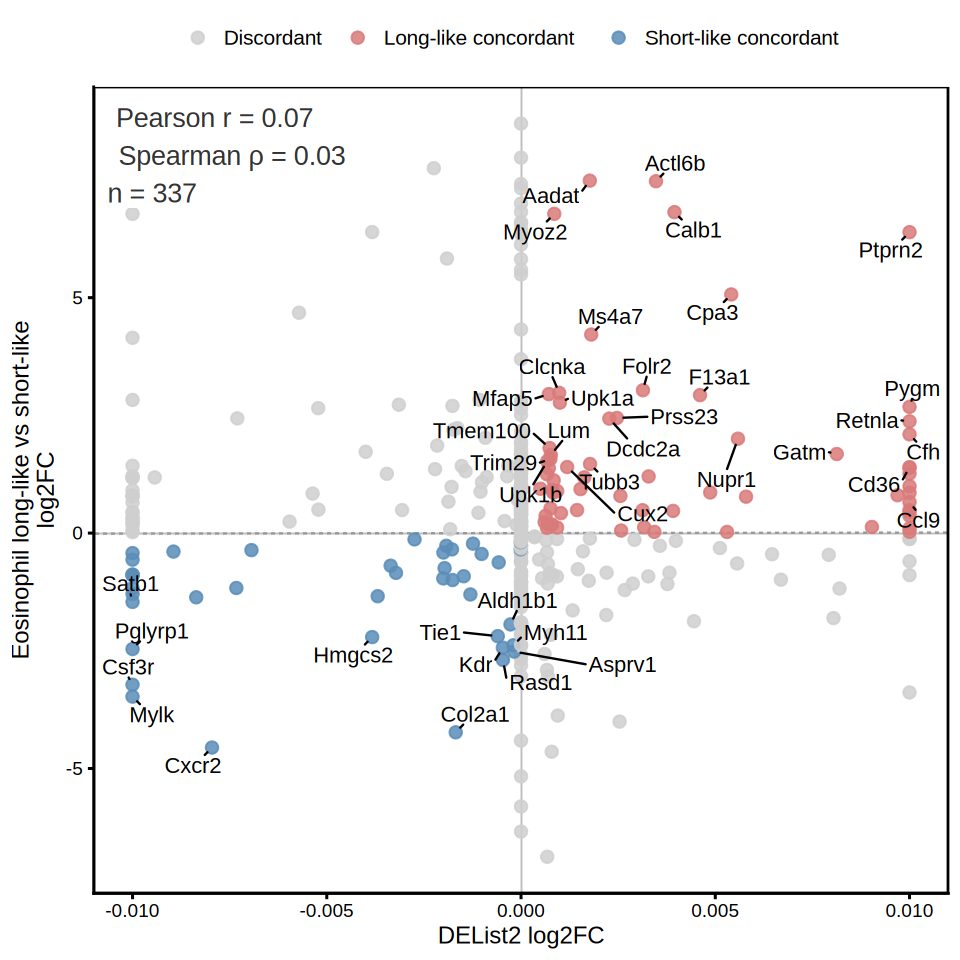

In [277]:
scatter_cols2 <- c(
  "Long-like concordant"  = "#D97A7A",
  "Short-like concordant" = "#5B8DB8",
  "Discordant"            = "#CFCFCF"
)

p_logFC_scatter_DEList2 <- ggplot(
  scatter_df2,
  aes(
    x = DEList2_log2FC_cap,
    y = Eos_log2FC,
    colour = Concordance
  )
) +

  geom_hline(
    yintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_vline(
    xintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.5,
    colour = "#999999"
  ) +

  geom_point(
    size = 2.8,
    alpha = 0.85
  ) +

  ggrepel::geom_text_repel(
    data = label_df2,
    aes(label = Gene),
    size = 4.5,
    colour = "black",
    box.padding = 0.35,
    point.padding = 0.2,
    max.overlaps = Inf,
    min.segment.length = 0
  ) +

  scale_colour_manual(
    values = scatter_cols2
  ) +

annotate(
  "label",
  x = -Inf,
  y = Inf,
  hjust = -0.08,
  vjust = 1.15,
  label = paste0(
    "Pearson r = ", sprintf("%.2f", r_p2),
    "\nSpearman \u03c1 = ", sprintf("%.2f", r_s2),
    "\nn = ", nrow(scatter_df2)
  ),
  size = 5.5,
  colour = "#333333",
  fill = "white",
  linewidth = 0,
  label.padding = unit(0.18, "lines")
)+

  labs(
    x = "DEList2 log2FC",
    y = "Eosinophil long-like vs short-like\nlog2FC",
    colour = NULL
  ) +

  theme_cell(base_size = 14) +

  theme(
    legend.position = "top",
    legend.text = element_text(size = 12)
  ) 

p_logFC_scatter_DEList2

- Red / Long-like: Tissue adaptation, repair, ECM remodeling (Areg/Retnla)
- Blue / Short-like: Granulocyte recruitment, innate/inflammatory activity (Pglyrp1/Cxcr2/Rsad2)

## Step10 - Estimate Nearest Cell Types

In [280]:
library(Seurat)
library(dplyr)
library(tidyr)
library(ggplot2)
library(FNN)
library(purrr)
library(tibble)

# ============================================================
# Settings
# ============================================================

celltype_col <- "Final_CellType_subtype_refined"

state_col   <- "EosState_extreme"
balance_col <- "EosState_balance"

short_name <- "Short-lived-like"
long_name  <- "Long-lived-like"

state_cols <- c(
  "Short-lived-like" = "#5B8DB8",
  "Intermediate"     = "#F6D6A8",
  "Long-lived-like"  = "#D97A7A"
)

if (!exists("theme_cell")) {
  theme_cell <- function(base_size = 12) {
    theme_classic(base_size = base_size) +
      theme(
        panel.border = element_rect(
          colour = "black",
          fill = NA,
          linewidth = 0.8
        ),
        axis.line = element_line(
          colour = "black",
          linewidth = 0.6
        ),
        axis.text = element_text(colour = "black"),
        axis.title = element_text(colour = "black"),
        legend.title = element_text(face = "bold"),
        plot.title = element_text(face = "bold")
      )
  }
}


Attaching package: ‘purrr’


The following object is masked _by_ ‘.GlobalEnv’:

    %||%


The following object is masked from ‘package:mclust’:

    map




In [281]:
# ============================================================
# Spatial coordinates
# ============================================================

coords <- GetTissueCoordinates(
  region_spatial[["fov"]],
  which = "centroids"
) %>%
  as.data.frame()

# Check coordinate columns
colnames(coords)

[1] "x"    "y"    "cell"

In [282]:
eos_md <- eos_obj@meta.data

idx <- match(
  colnames(region_spatial),
  rownames(eos_md)
)

for (v in state_cols) {
  region_spatial@meta.data[[v]] <- eos_md[[v]][idx]
}

In [283]:
if (!"cell" %in% colnames(coords)) {
  coords$cell <- rownames(coords)
}

stopifnot(
  all(c("cell", "x", "y") %in% colnames(coords))
)

md <- region_spatial@meta.data
md$cell <- rownames(md)

coords <- coords %>%
  left_join(
    md,
    by = "cell"
  )

nrow(coords)
table(
  is.na(coords[[celltype_col]])
)

[1] 89664


FALSE 
89664 

In [284]:
# All confirmed Eos with a state balance
eos_all <- coords %>%
  filter(
    !is.na(.data[[balance_col]])
  )

# q10/q90 polarized Eos only
eos_extreme <- eos_all %>%
  filter(
    .data[[state_col]] %in%
      c(short_name, long_name)
  )

table(eos_all[[state_col]])
table(eos_extreme[[state_col]])


Short-lived-like     Intermediate  Long-lived-like 
              76              719               69 


Short-lived-like     Intermediate  Long-lived-like 
              76                0               69 

In [285]:
# KNOWN INVALID LEGACY LOGIC: celltype_col points to the unrefined label.
# Rescued Eos can therefore remain in this apparent non-Eos pool.
reference_cells <- coords %>%
  filter(
    !is.na(.data[[celltype_col]]),
    .data[[celltype_col]] != "Eosinophil"
  )

table(reference_cells[[celltype_col]])


                 Adipocyte                        APC 
                      9179                      14760 
                       ASC                          B 
                      6051                      13858 
              Capillary_EC CCR2_inflammatory_Monocyte 
                     10343                       1583 
         CCR7_migratory_DC                       cDC1 
                       842                       1110 
                      cDC2            CX3CR1_Monocyte 
                      2935                       1971 
                Epithelial                       ILC2 
                       228                         29 
          Inflammatory_Mac               Lymphatic_EC 
                       875                        519 
        LYVE1_resident_Mac                  Mast cell 
                     10589                         52 
               Mesothelial                 Neutrophil 
                       240                        314 
         

                         Spatial coordinates
                                │
                                ▼
                     Each Eosinophil as query
                                │
              ┌─────────────────┴─────────────────┐
              │                                   │
        Distance-based                       Neighborhood-based
              │                                   │
      ┌───────┴────────┐                 ┌────────┴────────┐
      │                │                 │                 │
closest_df      nearest_by_type     neighborhood_comp      │
      │                │                 │                 │
      │          ┌─────┴──────┐          │                 │
      │          │            │          ▼                 │
      │   distance_stats  balance_distance_stats   neighborhood_stats
      │
single nearest
cell identity

### Step10_1 - What is the single closest non-Eos cell type?

the single nearest cell - only considers one cell

In [286]:
# NOT VALID FOR INTERPRETATION: eos_all and reference_cells were not
# checked for disjoint cell IDs, so zero-distance self-matches occur.
ref_xy <- as.matrix(
  reference_cells[, c("x", "y")]
)

eos_xy <- as.matrix(
  eos_all[, c("x", "y")]
)

nn1 <- FNN::get.knnx(
  data = ref_xy,
  query = eos_xy,
  k = 1
)

closest_df <- eos_all %>%
  transmute(
    cell,
    EosState = .data[[state_col]],
    EosState_balance = .data[[balance_col]],
    x,
    y
  )

closest_df$closest_cell <- reference_cells$cell[
  nn1$nn.index[, 1]
]

closest_df$closest_type <- reference_cells[[celltype_col]][
  nn1$nn.index[, 1]
]

closest_df$closest_distance <- nn1$nn.dist[, 1]

In [287]:
head(closest_df)

table(
  closest_df$EosState,
  closest_df$closest_type
)

,cell,EosState,EosState_balance,x,y,closest_cell,closest_type,closest_distance
,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1,aacjlcia-1,Intermediate,0.02522054,855.7946,3184.336,aacjokkl-1,APC,10.792481
2,aaefbcfl-1,Long-lived-like,1.02887558,555.8090,3082.605,ghapobba-1,ASC,7.476624
3,aafgdbpi-1,Long-lived-like,1.08896392,591.1885,3180.128,aafifjcl-1,LYVE1_resident_Mac,15.508329
4,aafollcf-1,Intermediate,-0.68902222,444.6310,3031.727,ggplfnbc-1,LYVE1_resident_Mac,8.394683
5,aaigcfnf-1,Intermediate,0.46813165,618.2896,4370.527,efglmckl-1,Venous_EC,9.695648
6,aamhkpoo-1,Intermediate,-0.16847235,1129.5569,4370.324,egjedlmn-1,Adipocyte,14.110254


                  
                   Adipocyte APC ASC   B Capillary_EC
  Short-lived-like         0   4   2  23            0
  Intermediate            37  91  91 127           28
  Long-lived-like          4  14  10   1            5
                  
                   CCR2_inflammatory_Monocyte CCR7_migratory_DC cDC1 cDC2
  Short-lived-like                          2                 0    3    5
  Intermediate                             35                 3   13   13
  Long-lived-like                           5                 0    0    1
                  
                   CX3CR1_Monocyte Epithelial ILC2 Inflammatory_Mac
  Short-lived-like               2          0    0                0
  Intermediate                  17         15    1                4
  Long-lived-like                1          0    0                0
                  
                   Lymphatic_EC LYVE1_resident_Mac Mast cell Mesothelial
  Short-lived-like            0                 10         1       

In [288]:
closest_summary <- closest_df %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  dplyr::count(
    EosState,
    closest_type,
    name = "n"
  ) %>%
  group_by(EosState) %>%
  mutate(
    pct = 100 * n / sum(n)
  ) %>%
  ungroup()

closest_summary

EosState,closest_type,n,pct
<fct>,<chr>,<int>,<dbl>
Short-lived-like,APC,4,5.263158
Short-lived-like,ASC,2,2.631579
Short-lived-like,B,23,30.263158
Short-lived-like,CCR2_inflammatory_Monocyte,2,2.631579
Short-lived-like,CX3CR1_Monocyte,2,2.631579
Short-lived-like,LYVE1_resident_Mac,10,13.157895
Short-lived-like,Mast cell,1,1.315789
Short-lived-like,Neutrophil,6,7.894737
Short-lived-like,T,6,7.894737


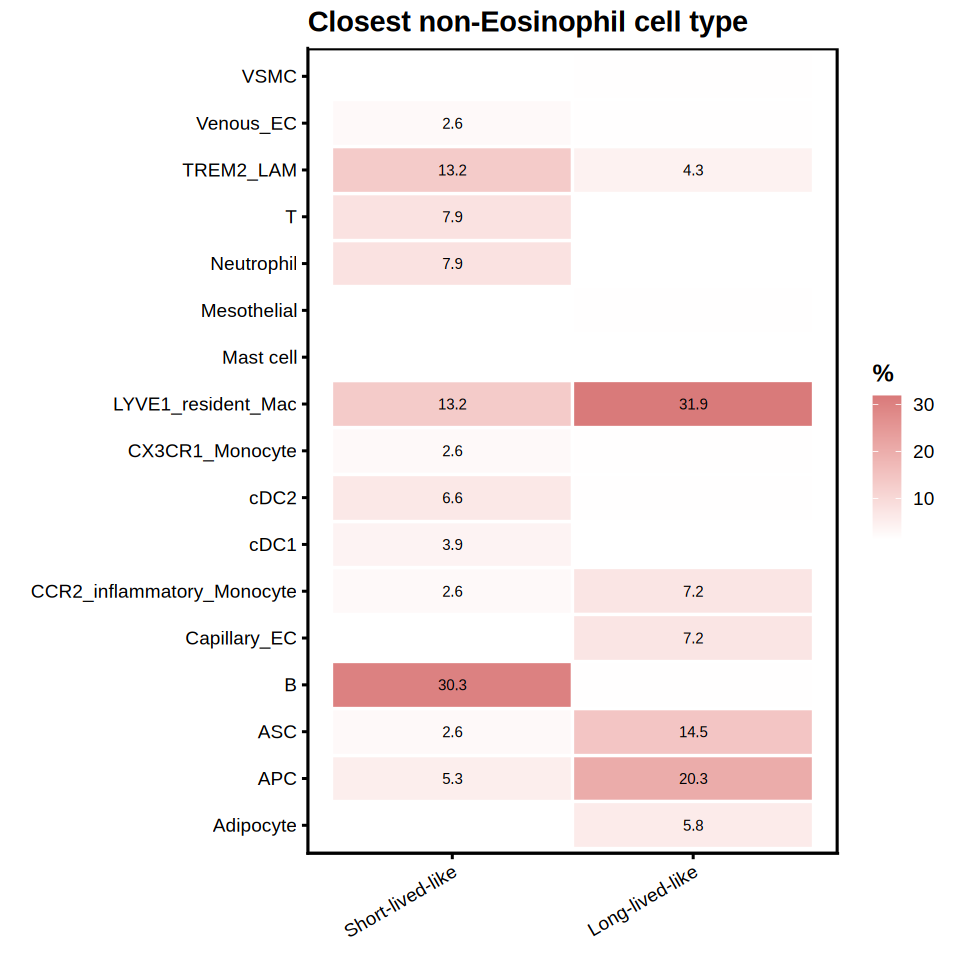

In [289]:
p_closest <- ggplot(
  closest_summary,
  aes(
    x = EosState,
    y = closest_type,
    fill = pct
  )
) +
  geom_tile(
    colour = "white",
    linewidth = 0.7
  ) +
  geom_text(
    aes(
      label = ifelse(pct >= 2, sprintf("%.1f", pct), "")
    ),
    size = 3
  ) +
  scale_fill_gradient(
    low = "white",
    high = "#D97A7A"
  ) +
  labs(
    x = NULL,
    y = NULL,
    fill = "%",
    title = "Closest non-Eosinophil cell type"
  ) +
  theme_cell(base_size=14) +
  theme(
    axis.text.x = element_text(
      angle = 30,
      hjust = 1
    )
  )

p_closest

### Step10_2 - Distance from every Eos to every cell type

nearest cell of every cell type - Do the two extreme Eos states occupy different spatial positions relative to particular cell types? - only uses the extreme groups and therefore discards Intermediate Eos

In [290]:
# ============================================================
# Nearest distance to each cell type
# ============================================================

target_types <- sort(
  unique(
    as.character(
      reference_cells[[celltype_col]]
    )
  )
)

nearest_by_type <- purrr::map_dfr(
  target_types,
  function(ct) {

    target <- reference_cells %>%
      filter(
        .data[[celltype_col]] == ct
      )

    if (nrow(target) < 1) {
      return(NULL)
    }

    nn <- FNN::get.knnx(
      data = as.matrix(
        target[, c("x", "y")]
      ),
      query = as.matrix(
        eos_all[, c("x", "y")]
      ),
      k = 1
    )

    tibble(
      cell = eos_all$cell,
      target_type = ct,
      nearest_distance = nn$nn.dist[, 1]
    )
  }
)

In [291]:
nearest_by_type <- nearest_by_type %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [292]:
distance_stats <- nearest_by_type %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  group_by(target_type) %>%
  summarise(

    n_short = sum(
      EosState == short_name
    ),

    n_long = sum(
      EosState == long_name
    ),

    median_short = median(
      nearest_distance[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    median_long = median(
      nearest_distance[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    delta_distance =
      median_long -
      median_short,

    p_value = wilcox.test(
      nearest_distance[
        EosState == long_name
      ],
      nearest_distance[
        EosState == short_name
      ],
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    direction = case_when(
      delta_distance < 0 ~
        "Closer to Long-like",

      delta_distance > 0 ~
        "Closer to Short-like",

      TRUE ~ "Similar"
    )
  ) %>%
  arrange(delta_distance)

distance_stats

target_type,n_short,n_long,median_short,median_long,delta_distance,p_value,FDR,direction
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Schwann,76,69,329.91609,197.81370,-132.1023866,3.693061e-04,5.539591e-04,Closer to Long-like
ASC,76,69,122.13635,36.02729,-86.1090611,4.517523e-08,9.382548e-08,Closer to Long-like
Adipocyte,76,69,95.39938,58.20940,-37.1899798,8.762295e-04,1.245168e-03,Closer to Long-like
APC,76,69,29.86080,20.42978,-9.4310275,7.942761e-03,9.324111e-03,Closer to Long-like
Pericyte,76,69,73.08606,73.39567,0.3096056,9.731552e-01,9.731552e-01,Closer to Short-like
LYVE1_resident_Mac,76,69,19.30181,25.24549,5.9436845,2.130958e-01,2.301434e-01,Closer to Short-like
Capillary_EC,76,69,45.75758,54.02657,8.2689871,6.589048e-01,6.842473e-01,Closer to Short-like
Venous_EC,76,69,43.08294,66.37973,23.2967904,1.570978e-03,2.120820e-03,Closer to Short-like
CCR2_inflammatory_Monocyte,76,69,37.09033,78.46360,41.3732719,1.493263e-06,2.519881e-06,Closer to Short-like


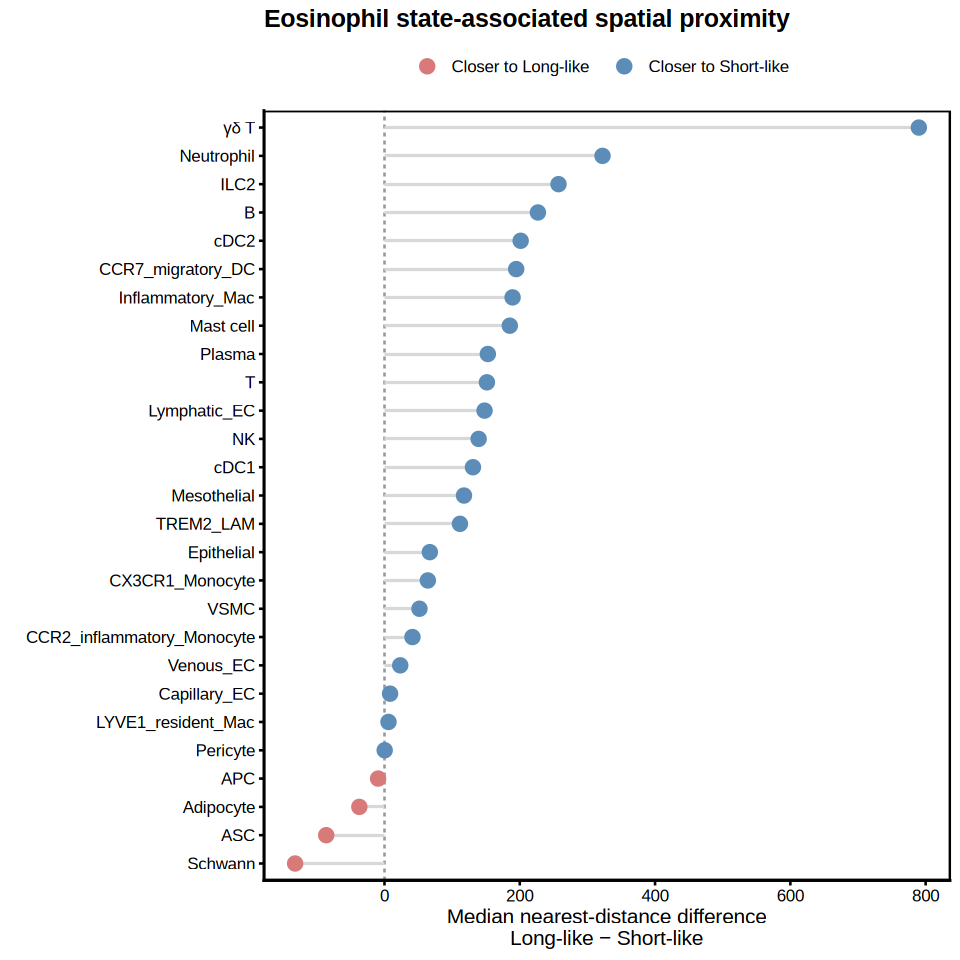

In [293]:
distance_cols <- c(
  "Closer to Long-like"  = "#D97A7A",
  "Closer to Short-like" = "#5B8DB8",
  "Similar"              = "#CFCFCF"
)

p_distance <- ggplot(
  distance_stats,
  aes(
    x = delta_distance,
    y = reorder(
      target_type,
      delta_distance
    ),
    colour = direction
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = delta_distance,
      yend = target_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    size = 3.5
  ) +
  scale_colour_manual(
    values = distance_cols
  ) +
  labs(
    x = "Median nearest-distance difference\nLong-like − Short-like",
    y = NULL,
    colour = NULL,
    title = "Eosinophil state-associated spatial proximity"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_distance

### Step10_3 - Continues EosState_balance vs distance - Primary!

continuous Eos state balance - Does Eosinophil state progressively change as the distance to a given cell type changes? 
Spearman correlation - As Eos become increasingly Long-like, they are progressively closer to venous EC.

In [294]:
balance_distance_stats <- nearest_by_type %>%
  group_by(target_type) %>%
  summarise(

    n = sum(
      complete.cases(
        EosState_balance,
        nearest_distance
      )
    ),

    rho = cor(
      EosState_balance,
      nearest_distance,
      method = "spearman",
      use = "complete.obs"
    ),

    p_value = cor.test(
      EosState_balance,
      nearest_distance,
      method = "spearman",
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    interpretation = case_when(

      rho < 0 ~
        "Closer with Long-like balance",

      rho > 0 ~
        "Closer with Short-like balance",

      TRUE ~
        "No direction"
    )
  ) %>%
  arrange(rho)

balance_distance_stats

target_type,n,rho,p_value,FDR,interpretation
<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
ASC,864,-0.234737135,2.794141e-12,6.858345e-12,Closer with Long-like balance
Adipocyte,864,-0.148746680,1.131644e-05,1.697466e-05,Closer with Long-like balance
Schwann,864,-0.123089442,2.871362e-04,3.691751e-04,Closer with Long-like balance
APC,864,-0.114633833,7.360441e-04,9.033268e-04,Closer with Long-like balance
Pericyte,864,0.001579586,9.630210e-01,9.630210e-01,Closer with Short-like balance
LYVE1_resident_Mac,864,0.009283049,7.852563e-01,8.154585e-01,Closer with Short-like balance
Capillary_EC,864,0.016395901,6.303220e-01,6.807477e-01,Closer with Short-like balance
ILC2,864,0.113398467,8.402871e-04,9.453230e-04,Closer with Short-like balance
VSMC,864,0.113734370,8.106661e-04,9.453230e-04,Closer with Short-like balance


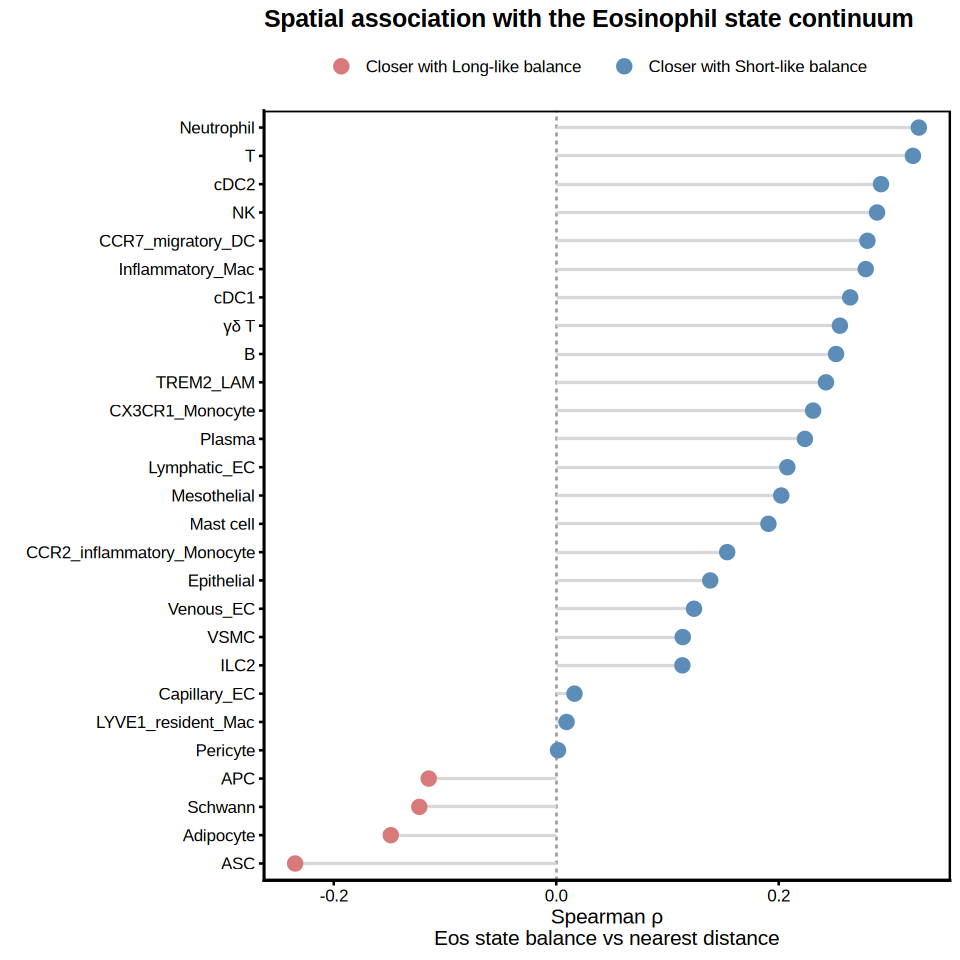

In [295]:
p_balance_distance <- ggplot(
  balance_distance_stats,
  aes(
    x = rho,
    y = reorder(
      target_type,
      rho
    ),
    colour = interpretation
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = rho,
      yend = target_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    size = 3.5
  ) +
  scale_colour_manual(
    values = c(
      "Closer with Long-like balance" =
        "#D97A7A",

      "Closer with Short-like balance" =
        "#5B8DB8",

      "No direction" =
        "#CFCFCF"
    )
  ) +
  labs(
    x = "Spearman \u03c1\nEos state balance vs nearest distance",
    y = NULL,
    colour = NULL,
    title = "Spatial association with the Eosinophil state continuum"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_balance_distance

`geom_smooth()` using formula = 'y ~ x'


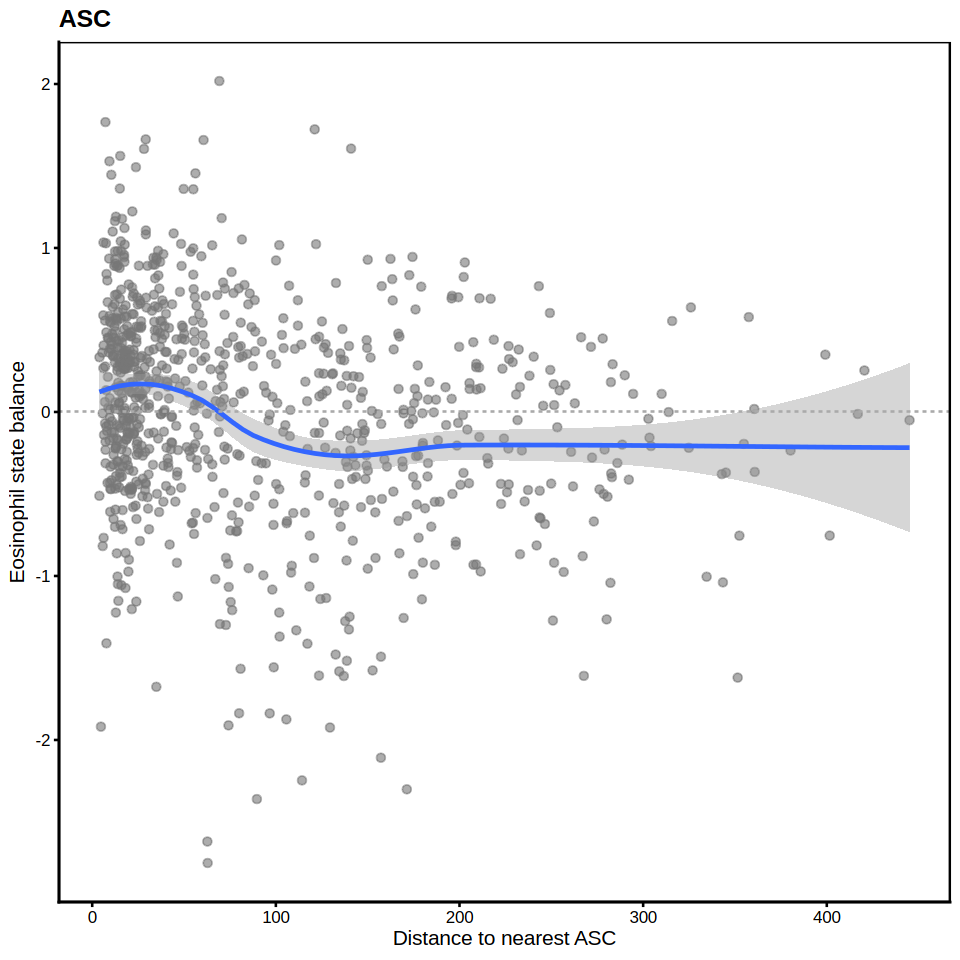

In [296]:
selected_type <- "ASC"

p_one_distance <- nearest_by_type %>%
  filter(
    target_type == selected_type
  ) %>%
  ggplot(
    aes(
      x = nearest_distance,
      y = EosState_balance
    )
  ) +
  geom_point(
    size = 1.8,
    alpha = 0.6,
    colour = "#777777"
  ) +
  geom_smooth(
    method = "loess",
    se = TRUE,
    linewidth = 1
  ) +
  geom_hline(
    yintercept = 0,
    linetype = 2,
    colour = "#AAAAAA"
  ) +
  labs(
    x = paste0(
      "Distance to nearest ",
      selected_type
    ),
    y = "Eosinophil state balance",
    title = selected_type
  ) +
  theme_cell()

p_one_distance

### Step10_4 - Local neighborhood composition

composition of the whole local neighborhood - What cell types make up the local neighborhood around each individual Eos?  
Instead of asking: How far away is the nearest ASC?   
Ask: Among the local cells around this Eos, how many are ASC, macrophages, EC, pericytes, etc.?  (k=15)

- neighborhood_comp: gives the neighborhood composition for each individual Eos.
- neighborhood_stats: summarizes those data by state.

In [297]:
# ============================================================
# k-nearest neighborhood
# ============================================================

k_neighbors <- 15

nnk <- FNN::get.knnx(
  data = as.matrix(
    reference_cells[, c("x", "y")]
  ),
  query = as.matrix(
    eos_all[, c("x", "y")]
  ),
  k = k_neighbors
)

In [298]:
neighbor_long <- tibble(

  cell = rep(
    eos_all$cell,
    each = k_neighbors
  ),

  neighbor_rank = rep(
    seq_len(k_neighbors),
    times = nrow(eos_all)
  ),

  neighbor_index = as.vector(
    t(nnk$nn.index)
  ),

  neighbor_distance = as.vector(
    t(nnk$nn.dist)
  )
)

neighbor_long$neighbor_cell <-
  reference_cells$cell[
    neighbor_long$neighbor_index
  ]

neighbor_long$neighbor_type <-
  reference_cells[[celltype_col]][
    neighbor_long$neighbor_index
  ]

In [299]:
neighbor_long <- neighbor_long %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [300]:
neighborhood_comp <- neighbor_long %>%
  dplyr::count(
    cell,
    neighbor_type,
    name = "n_neighbor"
  ) %>%
  complete(
    cell = eos_all$cell,
    neighbor_type = target_types,
    fill = list(
      n_neighbor = 0
    )
  ) %>%
  mutate(
    neighbor_fraction =
      n_neighbor /
      k_neighbors
  ) %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [301]:
neighborhood_stats <- neighborhood_comp %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  group_by(
    neighbor_type
  ) %>%
  summarise(

    mean_short = mean(
      neighbor_fraction[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    mean_long = mean(
      neighbor_fraction[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    delta_fraction =
      mean_long -
      mean_short,

    p_value = wilcox.test(
      neighbor_fraction[
        EosState == long_name
      ],
      neighbor_fraction[
        EosState == short_name
      ],
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    delta_pct =
      100 * delta_fraction,

    enrichment = case_when(

      delta_pct > 0 ~
        "Long-like niche",

      delta_pct < 0 ~
        "Short-like niche",

      TRUE ~
        "Similar"
    )
  ) %>%
  arrange(delta_pct)

neighborhood_stats

neighbor_type,mean_short,mean_long,delta_fraction,p_value,FDR,delta_pct,enrichment
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
B,0.191228070,0.0164251208,-0.1748029494,1.516745e-09,1.365070e-08,-17.48029494,Short-like niche
cDC2,0.085964912,0.0038647343,-0.0821001780,2.431497e-09,1.641261e-08,-8.21001780,Short-like niche
CCR2_inflammatory_Monocyte,0.097368421,0.0231884058,-0.0741800153,7.101588e-02,1.088432e-01,-7.41800153,Short-like niche
T,0.075438596,0.0048309179,-0.0706076786,3.273999e-08,1.767959e-07,-7.06076786,Short-like niche
TREM2_LAM,0.092105263,0.0415458937,-0.0505593694,6.660161e-03,1.498536e-02,-5.05593694,Short-like niche
Neutrophil,0.037719298,0.0009661836,-0.0367531147,1.722935e-06,6.645605e-06,-3.67531147,Short-like niche
cDC1,0.042982456,0.0086956522,-0.0342868040,1.251382e-03,3.378732e-03,-3.42868040,Short-like niche
CX3CR1_Monocyte,0.042105263,0.0231884058,-0.0189168574,2.303973e-02,4.443376e-02,-1.89168574,Short-like niche
Inflammatory_Mac,0.017543860,0.0028985507,-0.0146453089,3.617355e-02,6.511239e-02,-1.46453089,Short-like niche


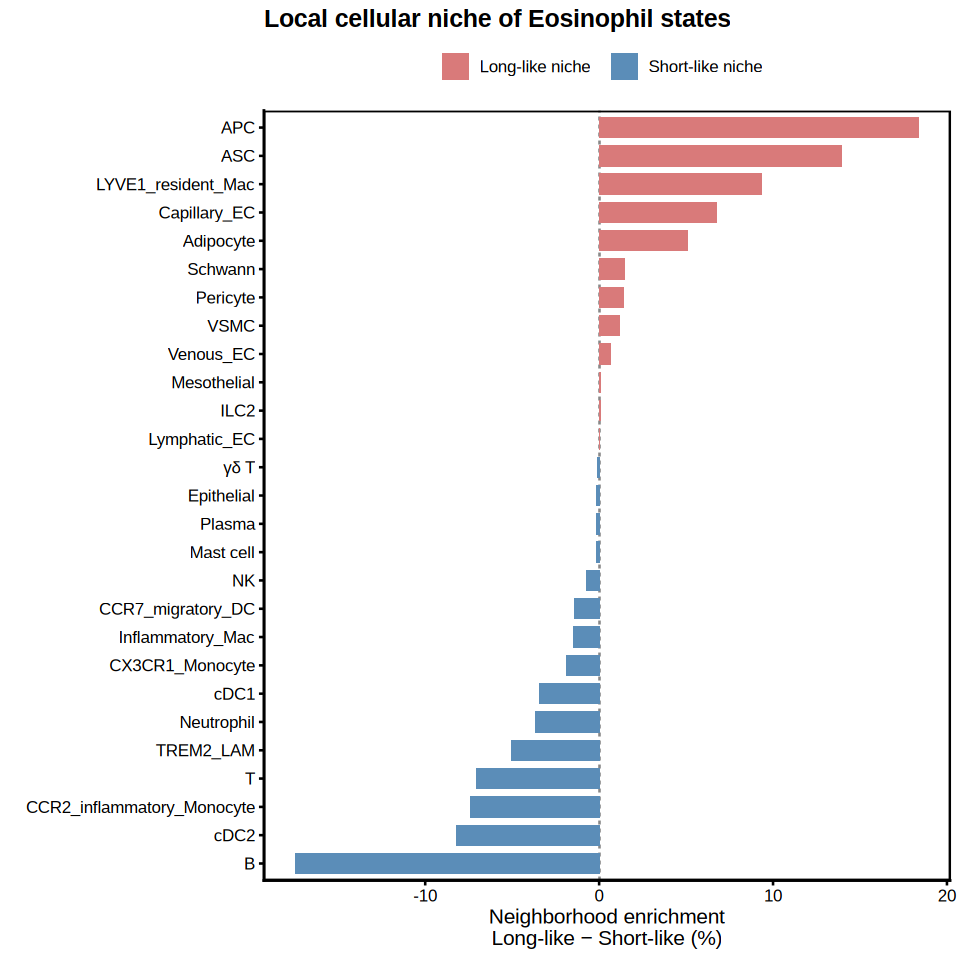

In [302]:
p_neighborhood <- ggplot(
  neighborhood_stats,
  aes(
    x = delta_pct,
    y = reorder(
      neighbor_type,
      delta_pct
    ),
    fill = enrichment
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#888888"
  ) +
  geom_col(
    width = 0.72
  ) +
  scale_fill_manual(
    values = c(
      "Long-like niche" =
        "#D97A7A",

      "Short-like niche" =
        "#5B8DB8",

      "Similar" =
        "#CFCFCF"
    )
  ) +
  labs(
    x = "Neighborhood enrichment\nLong-like − Short-like (%)",
    y = NULL,
    fill = NULL,
    title = "Local cellular niche of Eosinophil states"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_neighborhood

In [303]:
neighborhood_balance_stats <- neighborhood_comp %>%
  group_by(
    neighbor_type
  ) %>%
  summarise(

    rho = cor(
      EosState_balance,
      neighbor_fraction,
      method = "spearman",
      use = "complete.obs"
    ),

    p_value = cor.test(
      EosState_balance,
      neighbor_fraction,
      method = "spearman",
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    )
  ) %>%
  arrange(rho)

neighborhood_balance_stats

neighbor_type,rho,p_value,FDR
<chr>,<dbl>,<dbl>,<dbl>
cDC2,-0.2653145157,2.193690e-15,2.961482e-14
B,-0.2592608691,9.754761e-15,6.584464e-14
T,-0.2536590096,3.750518e-14,2.025280e-13
Neutrophil,-0.2066238838,8.734890e-10,3.369172e-09
Inflammatory_Mac,-0.1270284776,1.813814e-04,4.897298e-04
cDC1,-0.1176059383,5.323704e-04,1.306727e-03
CCR7_migratory_DC,-0.1080957876,1.462201e-03,3.036880e-03
NK,-0.0838231772,1.371434e-02,2.644908e-02
TREM2_LAM,-0.0817595561,1.622669e-02,2.920805e-02


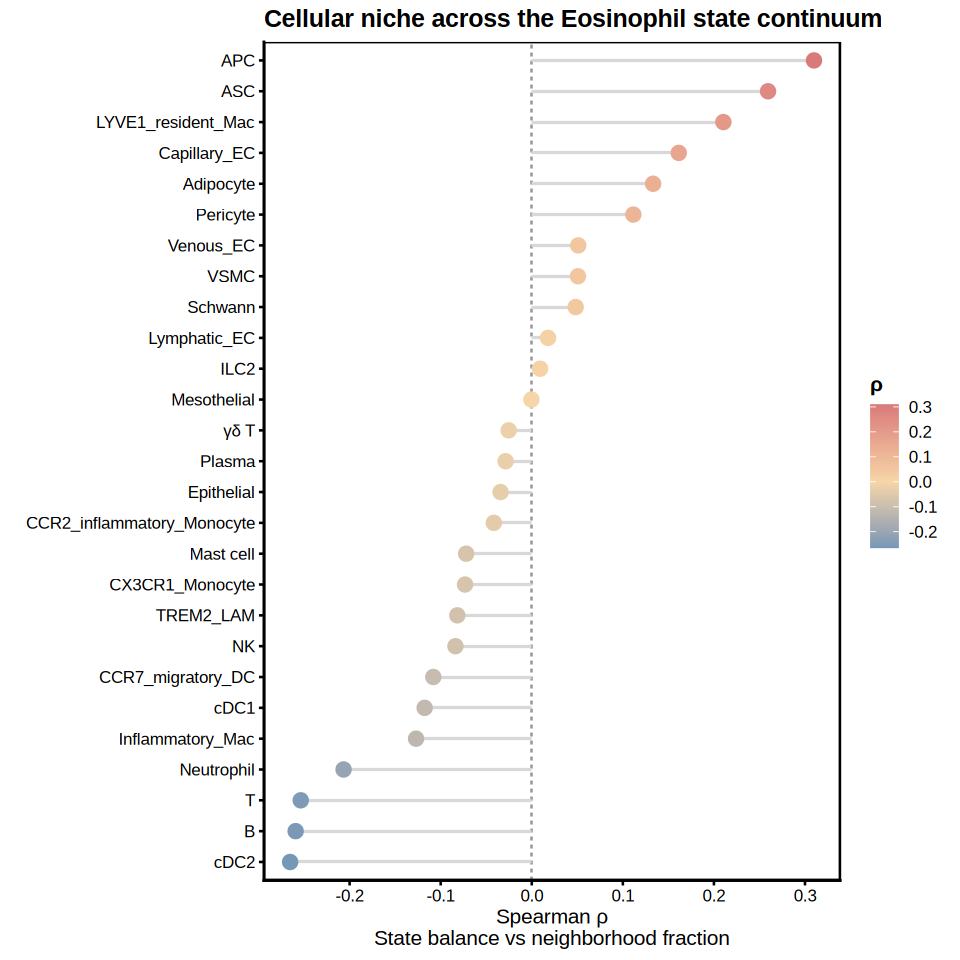

In [304]:
p_neighborhood_balance <- ggplot(
  neighborhood_balance_stats[complete.cases(neighborhood_balance_stats),],
  aes(
    x = rho,
    y = reorder(
      neighbor_type,
      rho
    )
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = rho,
      yend = neighbor_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    aes(
      colour = rho
    ),
    size = 3.5
  ) +
  scale_colour_gradient2(
    low = "#5B8DB8",
    mid = "#F6D6A8",
    high = "#D97A7A",
    midpoint = 0
  ) +
  labs(
    x = "Spearman \u03c1\nState balance vs neighborhood fraction",
    y = NULL,
    colour = "\u03c1",
    title = "Cellular niche across the Eosinophil state continuum"
  ) +
  theme_cell()

p_neighborhood_balance

### Step10_5 - Check whether suspicious DE genes are caused by neighboring cells

In [305]:
suspicious_genes <- c(
  "Vwf",
  "Eng",
  "Tagln",
  "Cpa3",
  "Ppbp",
  "Lrp2",
  "Upk1b",
  "Plp1"
)

In [306]:
eos_gene_expr <- FetchData(
  region_spatial,
  vars = suspicious_genes,
  layer = "counts"
)

eos_gene_expr$cell <- rownames(
  eos_gene_expr
)

eos_gene_expr <- eos_gene_expr %>%
  filter(
    cell %in% eos_all$cell
  )

In [307]:
endo_types <- c(
  "Capillary_EC",
  "Arterial_EC",
  "Venous_EC",
  "Lymphatic_EC"
)

eos_endo_distance <- nearest_by_type %>%
  filter(
    target_type %in%
      endo_types
  ) %>%
  group_by(cell) %>%
  summarise(
    nearest_Endo =
      min(
        nearest_distance,
        na.rm = TRUE
      ),
    .groups = "drop"
  )

In [308]:
vwf_check <- eos_gene_expr %>%
  select(
    cell,
    Vwf,
    Eng
  ) %>%
  left_join(
    eos_endo_distance,
    by = "cell"
  )

cor.test(
  vwf_check$Vwf,
  vwf_check$nearest_Endo,
  method = "spearman",
  exact = FALSE
)


	Spearman's rank correlation rho

data:  vwf_check$Vwf and vwf_check$nearest_Endo
S = 111446203, p-value = 0.2805
alternative hypothesis: true rho is not equal to 0
sample estimates:
        rho 
-0.03675439 


## Step11 - Spatially constrained ligand-receptor analysis

In [309]:
library(CellChat)

data(CellChatDB.mouse)

panel_genes <- rownames(
  region_spatial[["Xenium"]]
)

lr_db <- CellChatDB.mouse$interaction

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following object is masked from ‘package:FNN’:

    knn


The following object is masked from ‘package:circlize’:

    degree


The following objects are masked from ‘package:future’:

    %->%, %<-%


The following object is masked from ‘package:tibble’:

    as_data_frame


The following object is masked from ‘package:tidyr’:

    crossing


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [310]:
colnames(lr_db)
head(lr_db)

[1] "interaction_name"         "pathway_name"            
 [3] "ligand"                   "receptor"                
 [5] "agonist"                  "antagonist"              
 [7] "co_A_receptor"            "co_I_receptor"           
 [9] "annotation"               "interaction_name_2"      
[11] "evidence"                 "is_neurotransmitter"     
[13] "ligand.symbol"            "ligand.family"           
[15] "ligand.location"          "ligand.keyword"          
[17] "ligand.secreted_type"     "ligand.transmembrane"    
[19] "receptor.symbol"          "receptor.family"         
[21] "receptor.location"        "receptor.keyword"        
[23] "receptor.surfaceome_main" "receptor.surfaceome_sub" 
[25] "receptor.adhesome"        "receptor.secreted_type"  
[27] "receptor.transmembrane"   "version"

,interaction_name,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,annotation,interaction_name_2,⋯,receptor.symbol,receptor.family,receptor.location,receptor.keyword,receptor.surfaceome_main,receptor.surfaceome_sub,receptor.adhesome,receptor.secreted_type,receptor.transmembrane,version
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TGFB1_TGFBR1_TGFBR2,TGFB1_TGFBR1_TGFBR2,TGFb,Tgfb1,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb1 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB2_TGFBR1_TGFBR2,TGFB2_TGFBR1_TGFBR2,TGFb,Tgfb2,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb2 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB3_TGFBR1_TGFBR2,TGFB3_TGFBR1_TGFBR2,TGFb,Tgfb3,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb3 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB1_ACVR1B_TGFBR2,TGFB1_ACVR1B_TGFBR2,TGFb,Tgfb1,ACVR1B_TGFbR2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb1 - (Acvr1b+Tgfbr2),⋯,"Acvr1b, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Ubl conjugation",Receptors,Act.TGFB;Kinase,,

In [311]:
lr_simple <- lr_db %>%
  filter(
    ligand %in% panel_genes,
    receptor %in% panel_genes
  ) %>%
  transmute(
    interaction_name,
    pathway_name,
    ligand,
    receptor
  ) %>%
  distinct()

nrow(lr_simple)

lr_simple

[1] 21

,interaction_name,pathway_name,ligand,receptor
,<chr>,<chr>,<chr>,<chr>
CCL6_CCR3,CCL6_CCR3,CCL,Ccl6,Ccr3
CXCL2_CXCR2,CXCL2_CXCR2,CXCL,Cxcl2,Cxcr2
PPBP_CXCR2,PPBP_CXCR2,CXCL,Ppbp,Cxcr2
PTN_SDC1,PTN_SDC1,PTN,Ptn,Sdc1
HC_C5AR1,HC_C5AR1,COMPLEMENT,Hc,C5ar1
SCGB3A2_MARCO,SCGB3A2_MARCO,UGRP1,Scgb3a2,Marco
COL2A1_CD44,COL2A1_CD44,COLLAGEN,Col2a1,Cd44
COL2A1_SDC1,COL2A1_SDC1,COLLAGEN,Col2a1,Sdc1
THBS1_SDC1,THBS1_SDC1,THBS,Thbs1,Sdc1


In [312]:
DefaultAssay(region_spatial) <- "Xenium"

expr <- GetAssayData(
  region_spatial,
  assay = "Xenium",
  layer = "data"
)

lr_genes <- intersect(
  unique(
    c(
      lr_simple$ligand,
      lr_simple$receptor
    )
  ),
  rownames(expr)
)

length(lr_genes)

[1] 23

In [313]:
spatial_edges <- neighbor_long %>%
  filter(
    EosState %in%
      c(
        short_name,
        long_name
      )
  )

In [314]:
eos_idx <- match(
  spatial_edges$cell,
  colnames(expr)
)

neighbor_idx <- match(
  spatial_edges$neighbor_cell,
  colnames(expr)
)

stopifnot(
  !any(is.na(eos_idx)),
  !any(is.na(neighbor_idx))
)

In [315]:
lr_edge_scores <- purrr::map_dfr(
  seq_len(
    nrow(lr_simple)
  ),
  function(i) {

    lig <- lr_simple$ligand[i]
    rec <- lr_simple$receptor[i]

    # Eos ligand -> neighboring cell receptor
    eos_to_neighbor <- tibble(

      eos_cell =
        spatial_edges$cell,

      EosState =
        spatial_edges$EosState,

      neighbor_type =
        spatial_edges$neighbor_type,

      interaction =
        lr_simple$interaction_name[i],

      pathway =
        lr_simple$pathway_name[i],

      ligand = lig,

      receptor = rec,

      direction =
        "Eos -> Neighbor",

      LR_score =
        as.numeric(
          expr[
            lig,
            eos_idx
          ]
        ) *
        as.numeric(
          expr[
            rec,
            neighbor_idx
          ]
        )
    )

    # neighboring cell ligand -> Eos receptor
    neighbor_to_eos <- tibble(

      eos_cell =
        spatial_edges$cell,

      EosState =
        spatial_edges$EosState,

      neighbor_type =
        spatial_edges$neighbor_type,

      interaction =
        lr_simple$interaction_name[i],

      pathway =
        lr_simple$pathway_name[i],

      ligand = lig,

      receptor = rec,

      direction =
        "Neighbor -> Eos",

      LR_score =
        as.numeric(
          expr[
            lig,
            neighbor_idx
          ]
        ) *
        as.numeric(
          expr[
            rec,
            eos_idx
          ]
        )
    )

    bind_rows(
      eos_to_neighbor,
      neighbor_to_eos
    )
  }
)

In [316]:
lr_by_eos <- lr_edge_scores %>%
  group_by(
    eos_cell,
    EosState,
    neighbor_type,
    direction,
    pathway,
    interaction,
    ligand,
    receptor
  ) %>%
  summarise(
    LR_score = mean(
      LR_score,
      na.rm = TRUE
    ),
    .groups = "drop"
  )

In [317]:
lr_state_compare <- lr_by_eos %>%
  group_by(
    neighbor_type,
    direction,
    pathway,
    interaction,
    ligand,
    receptor
  ) %>%
  summarise(

    n_long = sum(
      EosState == long_name
    ),

    n_short = sum(
      EosState == short_name
    ),

    mean_long = mean(
      LR_score[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    mean_short = mean(
      LR_score[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    delta_score =
      mean_long -
      mean_short,

    .groups = "drop"
  ) %>%
  filter(
    n_long >= 5,
    n_short >= 5
  ) %>%
  arrange(
    desc(
      abs(delta_score)
    )
  )

head(
  lr_state_compare,
  30
)

neighbor_type,direction,pathway,interaction,ligand,receptor,n_long,n_short,mean_long,mean_short,delta_score
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
TREM2_LAM,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,12,28,0.0000000,10.9265035,-10.926503
CCR2_inflammatory_Monocyte,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,20,27,0.0000000,10.9025280,-10.902528
VSMC,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,11,11,0.0000000,9.7582347,-9.758235
Capillary_EC,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,36,17,0.0000000,8.5408759,-8.540876
Venous_EC,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,19,17,0.0000000,7.7303290,-7.730329
Adipocyte,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,33,15,0.0000000,7.7157725,-7.715772
T,Eos -> Neighbor,THBS,THBS4_CD36,Thbs4,Cd36,5,36,6.9893772,0.0000000,6.989377
T,Eos -> Neighbor,THBS,THBS4_CD47,Thbs4,Cd47,5,36,6.7953866,0.3043656,6.491021
CCR2_inflammatory_Monocyte,Eos -> Neighbor,THBS,THBS1_CD47,Thbs1,Cd47,20,27,0.0000000,6.0917509,-6.091751


In [318]:
top_lr <- lr_state_compare %>%
  slice_max(
    order_by = abs(delta_score),
    n = 25
  ) %>%
  mutate(
    LR_label = paste0(
      ligand, " → ", receptor,
      "\n", neighbor_type,
      " | ", direction
    )
  )

In [319]:
options(repr.plot.width=15, repr.plot.height=8)

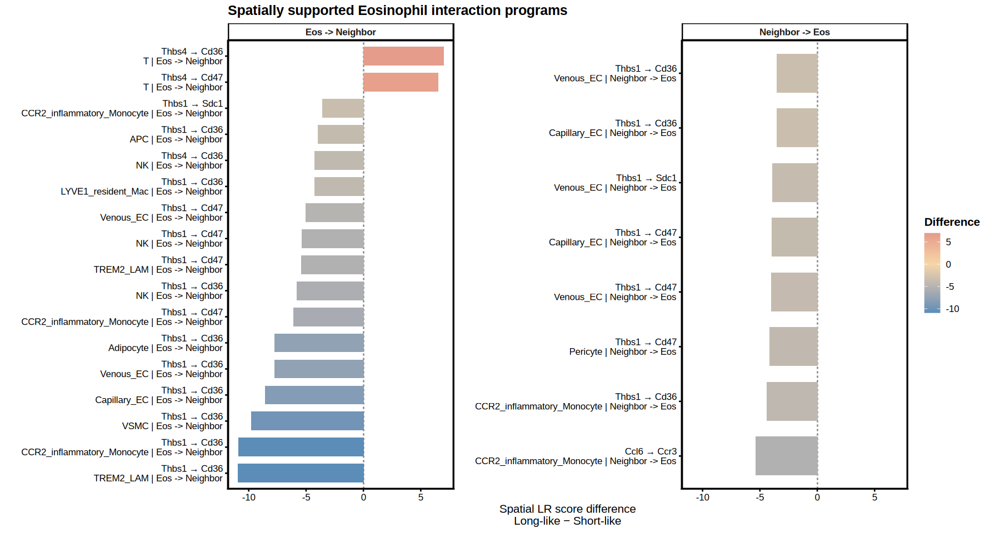

In [320]:
p_lr <- ggplot(
  top_lr,
  aes(
    x = delta_score,
    y = reorder(
      LR_label,
      delta_score
    ),
    fill = delta_score
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#888888"
  ) +
  geom_col(
    width = 0.7
  ) +
  scale_fill_gradient2(
    low = "#5B8DB8",
    mid = "#F6D6A8",
    high = "#D97A7A",
    midpoint = 0
  ) +
  facet_wrap(
    ~direction,
    scales = "free_y"
  )+
  labs(
    x = "Spatial LR score difference\nLong-like − Short-like",
    y = NULL,
    fill = "Difference",
    title = "Spatially supported Eosinophil interaction programs"
  ) +
  theme_cell()

p_lr

In [321]:
CellChatDB.mouse$interaction %>%
  dplyr::filter(
    ligand == "Ccl6" |
    receptor %in% c("Ccr1", "Ccr3")
  ) %>%
  dplyr::select(
    interaction_name,
    pathway_name,
    ligand,
    receptor,
    everything()
  )

,interaction_name,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,annotation,interaction_name_2,⋯,receptor.symbol,receptor.family,receptor.location,receptor.keyword,receptor.surfaceome_main,receptor.surfaceome_sub,receptor.adhesome,receptor.secreted_type,receptor.transmembrane,version
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CCL5_CCR1,CCL5_CCR1,CCL,Ccl5,Ccr1,,,,,Secreted Signaling,Ccl5 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL3_CCR1,CCL3_CCR1,CCL,Ccl3,Ccr1,,,,,Secreted Signaling,Ccl3 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL8_CCR1,CCL8_CCR1,CCL,Ccl8,Ccr1,,,,,Secreted Signaling,Ccl8 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL9_CCR1,CCL9_CCR1,CCL,Ccl9,Ccr1,,,,,Secreted Signaling,Ccl9 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR1,CCL6_CCR1,CCL,Ccl6,Ccr1,,,,,Secreted Signaling,Ccl6 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL7_CCR1,CCL7_CCR1,CCL,Ccl7,Ccr1,,,,,Secreted Signaling,Ccl7 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR1L1,CCL6_CCR1L1,CCL,Ccl6,Ccr1l1,,,,,Secreted Signaling,Ccl6 - Ccr1l1,⋯,Ccr1l1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR2,CCL6_CCR2,CCL,Ccl6,Ccr2,,,,,Secreted Signaling,Ccl6 - Ccr2,⋯,Ccr2,G-protein coupled receptor 1,Cell membrane,"Membrane, Host-virus interaction, Disulfide bond, Transmembrane, Receptor, Alternative splicing, Glycoprotein, Transducer, Reference proteome, Cell membrane, Transmembrane helix, Phosphoprotein, Sulfation, G-protein coupled receptor, 3D-structure, Inflammatory response",Unclassified,Unclassified,,,TRUE,CellChatDB v1
CCL5_CCR3,CCL5_CCR3,CCL,Ccl5,Ccr3,,,,,Secreted Signaling,Ccl5 - Ccr3,⋯,Ccr3,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Host-virus interaction, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, Alternative splicing, G-protein coupled receptor, 3D-structure",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1


In [322]:
c("Ccl6", "Ccr1", "Ccr3") %in% rownames(region_spatial[["Xenium"]])

[1]  TRUE FALSE  TRUE

Long-like and Short-like eosinophils appear embedded in different spatial communication programs
- Long-like Eos：
    - Eos → Neighbor: predicted Thbs4 → Cd36/Cd47 signaling toward venous EC and cDC1, and Comp → Cd36/Cd47 toward cDC1 (ECM/adhesion/tissue-remodeling program)
    - Neighbor → Eos: Ccl6 → Ccr3 from CCR2 inflammatory monocytes, LYVE1-resident macrophages, and venous EC (Ruggiero-Ruff The journal of immunology 2026, https://doi.org/10.1093/jimmun/vkag141.1564)
- Short-like
    - Eos → Neighbor: Thbs1 → Cd36/Cd47 interactions toward capillary EC, LYVE1 macrophages, adipocytes, APC, pericytes, venous EC and inflammatory monocytes (broad THBS1-associated stromal/vascular interaction program)

## Step12 - Define Lymph node

In [323]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [324]:
library(dplyr)
library(ggplot2)

coords <- GetTissueCoordinates(
  region_spatial[["fov"]],
  which = "centroids"
) %>%
  as.data.frame()

if (!"cell" %in% colnames(coords)) {
  coords$cell <- rownames(coords)
}

md <- region_spatial@meta.data %>%
  tibble::rownames_to_column("cell")

coords <- coords %>%
  left_join(
    md,
    by = "cell"
  )

range(coords$x)
range(coords$y)

[1]     3.949041 11470.705078

[1]  586.058 5189.915

In [325]:
options(repr.plot.width=12, repr.plot.height=8)

[1]     3.949041 11470.705078

[1]  586.058 5189.915

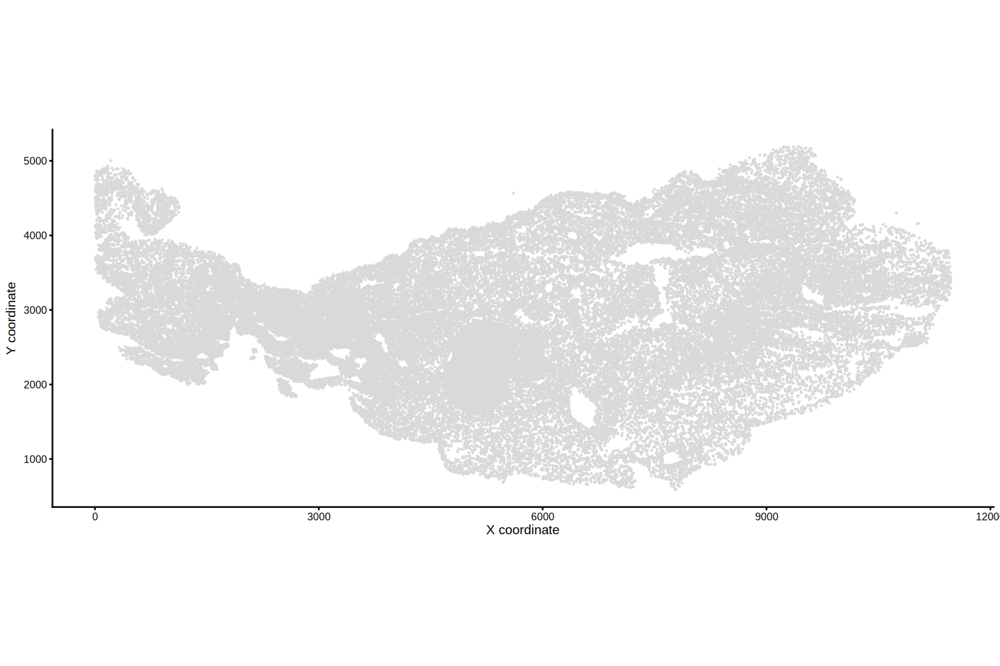

In [326]:
range(coords$x, na.rm = TRUE)
range(coords$y, na.rm = TRUE)

ggplot(
  coords,
  aes(x = x, y = y)
) +
  geom_point(
    size = 0.12,
    colour = "#D9D9D9"
  ) +
  coord_fixed() +
  theme_classic() +
  labs(
    x = "X coordinate",
    y = "Y coordinate"
  )

In [327]:
lymphoid_types <- c(
  "B",
  "T",
  "γδ T",
  "NK",
  "Plasma",
  "cDC1",
  "cDC2",
  "CCR7_migratory_DC"
)

coords$is_lymphoid <-
  coords$Final_CellType_subtype %in%
  lymphoid_types

In [328]:
library(FNN)

xy <- as.matrix(
  coords[, c("x", "y")]
)

knn <- FNN::get.knn(
  xy,
  k = 30
)

coords$local_lymphoid_fraction <- apply(
  knn$nn.index,
  1,
  function(ii) {
    mean(
      coords$is_lymphoid[ii],
      na.rm = TRUE
    )
  }
)

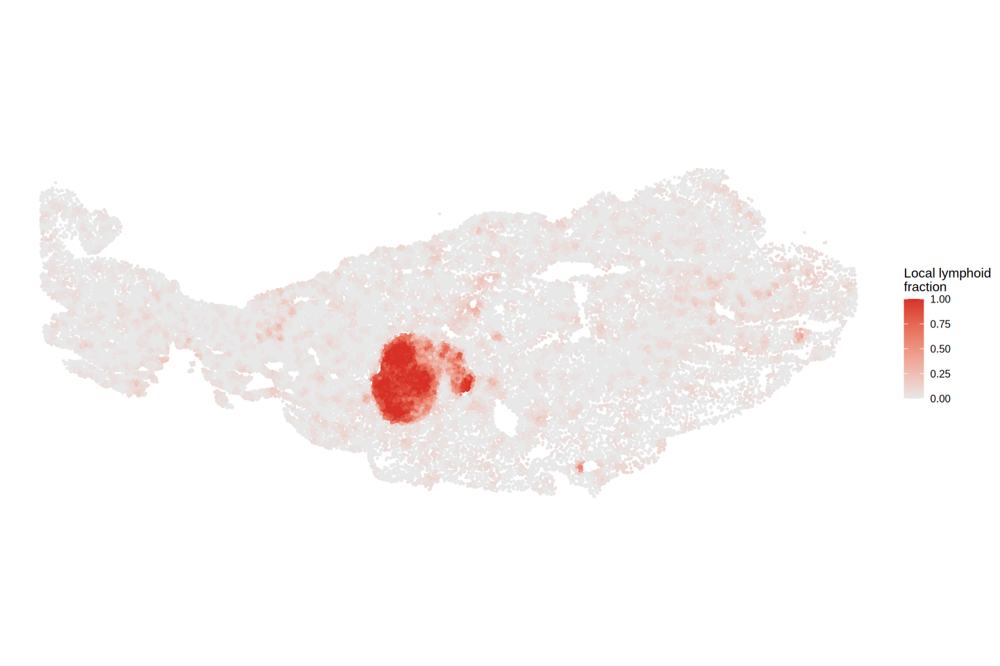

In [329]:
ggplot(
  coords,
  aes(
    x = x,
    y = y,
    colour = local_lymphoid_fraction
  )
) +
  geom_point(
    size = 0.25
  ) +
  scale_colour_gradient(
    low = "#E8E8E8",
    high = "#D73027"
  ) +
  coord_fixed() +
  theme_void() +
  labs(
    colour = "Local lymphoid\nfraction"
  )

In [330]:
ln_core <- coords %>%
  filter(
    local_lymphoid_fraction >= 0.5
  )

nrow(ln_core)

[1] 23275

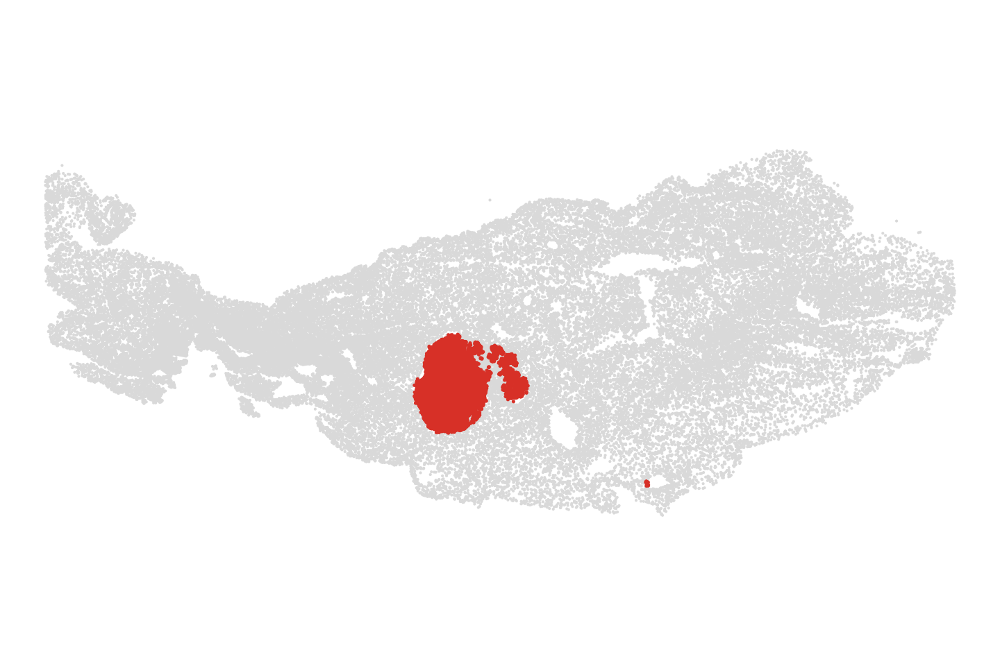

In [331]:
ggplot() +
  geom_point(
    data = coords,
    aes(x, y),
    size = 0.12,
    colour = "#D9D9D9"
  ) +
  geom_point(
    data = ln_core,
    aes(x, y),
    size = 0.4,
    colour = "#D73027"
  ) +
  coord_fixed() +
  theme_void()

In [332]:
library(dbscan)

cl <- dbscan::dbscan(
  as.matrix(
    ln_core[, c("x", "y")]
  ),
  eps = 80,
  minPts = 10
)

table(cl$cluster)


Attaching package: ‘dbscan’


The following object is masked from ‘package:stats’:

    as.dendrogram





    1     2 
23253    22 

In [333]:
ln_core$LN_cluster <- cl$cluster

In [334]:
main_cluster <- names(
  which.max(
    table(
      ln_core$LN_cluster[
        ln_core$LN_cluster != 0
      ]
    )
  )
)

main_cluster <- as.integer(main_cluster)

ln_core_main <- ln_core %>%
  filter(
    LN_cluster == main_cluster
  )

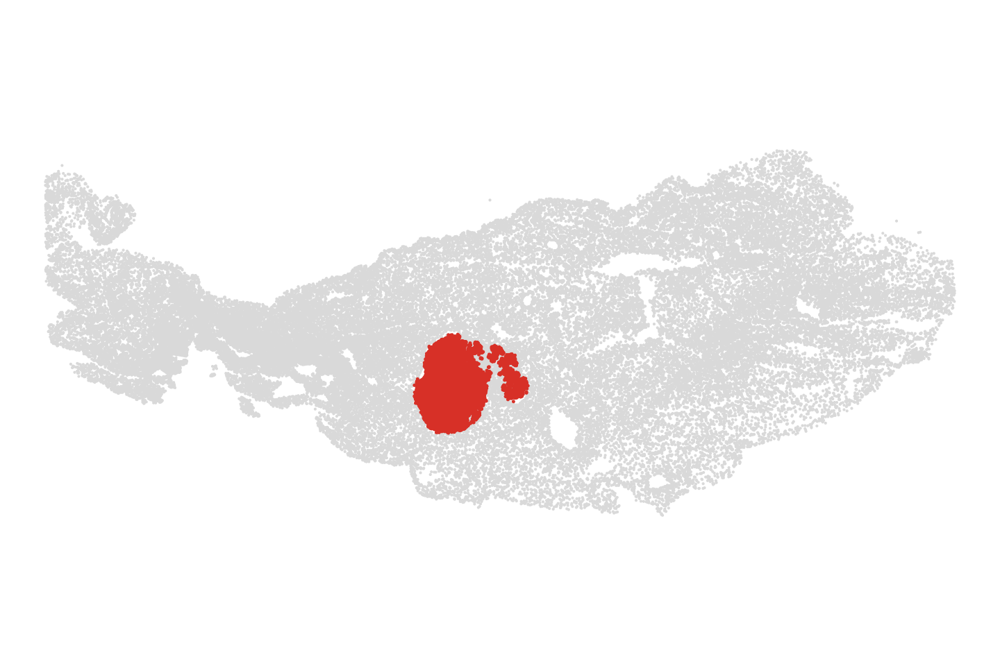

In [335]:
ggplot() +
  geom_point(
    data = coords,
    aes(x, y),
    colour = "#D9D9D9",
    size = 0.12
  ) +
  geom_point(
    data = ln_core_main,
    aes(x, y),
    colour = "#D73027",
    size = 0.35
  ) +
  coord_fixed() +
  theme_void()

In [336]:
hull_idx <- chull(
  ln_core_main$x,
  ln_core_main$y
)

ln_polygon <- ln_core_main[
  hull_idx,
  c("x", "y")
]

# close polygon explicitly
ln_polygon <- rbind(
  ln_polygon,
  ln_polygon[1, ]
)

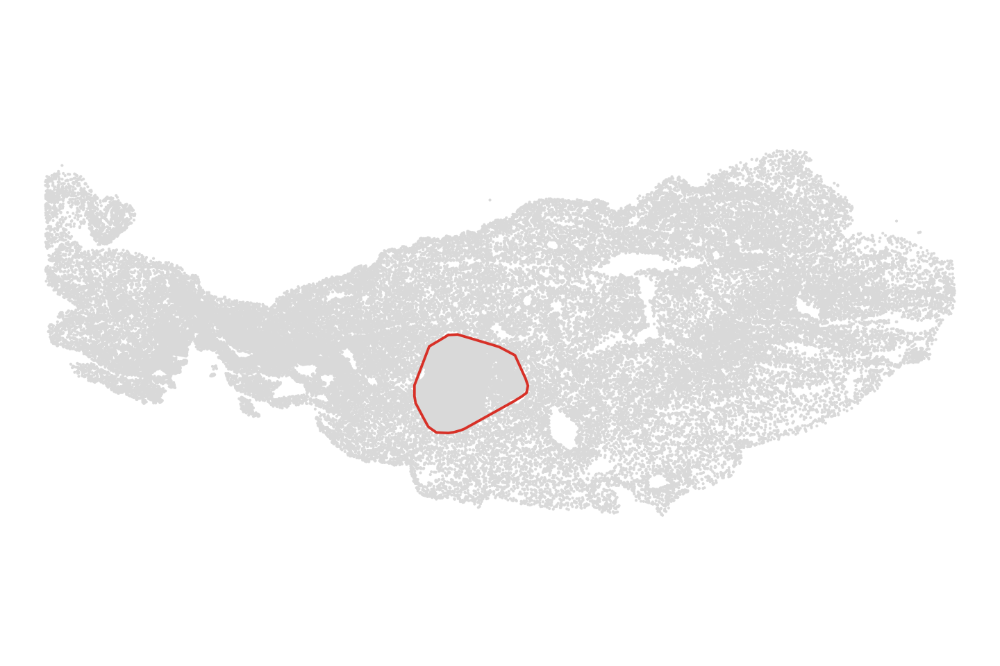

In [337]:
ggplot() +
  geom_point(
    data = coords,
    aes(x, y),
    colour = "#D9D9D9",
    size = 0.12
  ) +
  geom_polygon(
    data = ln_polygon,
    aes(x, y),
    fill = NA,
    colour = "#D73027",
    linewidth = 0.8
  ) +
  coord_fixed() +
  theme_void()

In [338]:
inside_ln <- sp::point.in.polygon(
  point.x = coords$x,
  point.y = coords$y,
  pol.x = ln_polygon$x,
  pol.y = ln_polygon$y
)

coords$LN_region <- ifelse(
  inside_ln > 0,
  "Lymph_node",
  "Adipose"
)

In [339]:
table(coords$LN_region)


   Adipose Lymph_node 
     63510      26154 

In [340]:
region_spatial$LN_region <-
  coords$LN_region[
    match(
      colnames(region_spatial),
      coords$cell
    )
  ]

In [348]:
dim(region_spatial@meta.data)

[1] 89664   268

In [341]:
table(
  region_spatial$LN_region,
  useNA = "ifany"
)


   Adipose Lymph_node 
     63510      26154 

In [346]:
ln_composition <- region_spatial@meta.data %>%
  dplyr::count(
    LN_region,
    Final_CellType_subtype_refined
  ) %>%
  group_by(LN_region) %>%
  mutate(
    pct = 100 * n / sum(n)
  ) %>%
  ungroup()

ln_composition

LN_region,Final_CellType_subtype_refined,n,pct
<chr>,<chr>,<int>,<dbl>
Adipose,APC,14322,22.55077940
Adipose,ASC,6032,9.49771689
Adipose,Adipocyte,9163,14.42764919
Adipose,B,133,0.20941584
Adipose,CCR2_inflammatory_Monocyte,1466,2.30829791
Adipose,CCR7_migratory_DC,129,0.20311762
Adipose,CX3CR1_Monocyte,888,1.39820501
Adipose,Capillary_EC,10234,16.11399780
Adipose,Eosinophil,655,1.03133365


Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


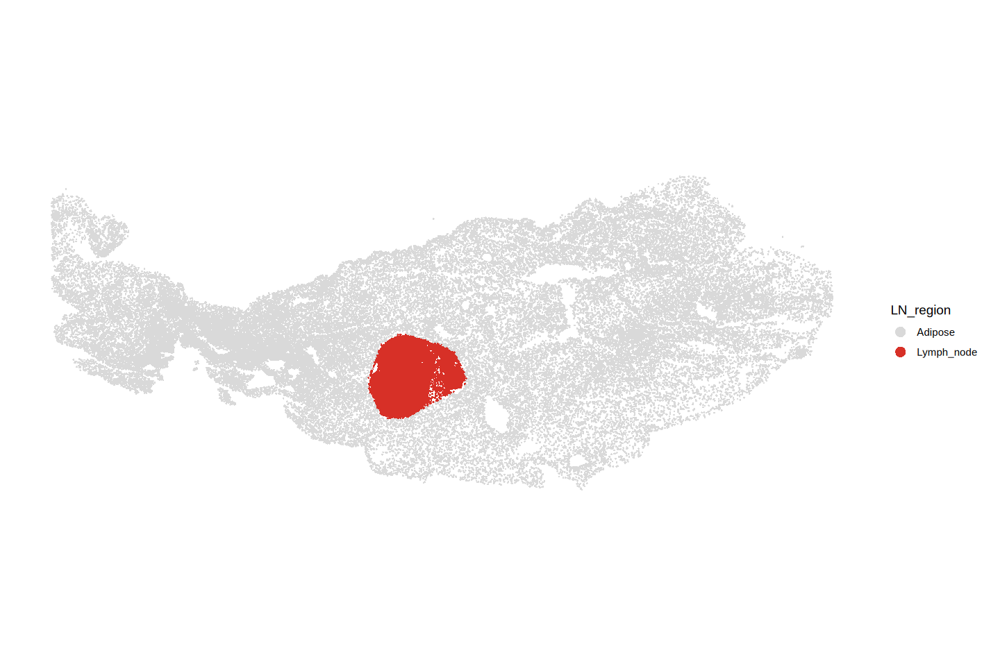

In [347]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  group.by = "LN_region",
  cols = c(
    "Adipose" = "#D9D9D9",
    "Lymph_node" = "#D73027"
  ),
  flip_xy = FALSE,
  dark.background = FALSE,
)

In [349]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

## Step14 - Remove Lymph node and redo Eos analysis

In [ ]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial_passQC.rds")))

In [350]:
LNremoved <- subset(
  region_spatial,
  subset = LN_region == "Adipose"
)

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [351]:
LNremoved

An object of class Seurat 
479 features across 63510 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap_PC30
 1 spatial field of view present: fov